In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from google.colab import files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Anàlisi incidència bronquiolitis

In [ ]:
bronq  = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx")

In [ ]:
bronq['data']=pd.to_datetime(bronq['data'])
# Factor "població"
bronq['f0']=bronq['casos_setmanals_0a']/bronq['incidencia_setmanal_0a']
bronq['f12']=bronq['casos_setmanals_1-2a']/bronq['incidencia_setmanal_1-2a']
bronq['f34']=bronq['casos_setmanals_3-4a']/bronq['incidencia_setmanal_3-4a']
bronq['f514']=bronq['casos_setmanals_5-14a']/bronq['incidencia_setmanal_5-14a']

# Incidència total (menors de 14 anys)
bronq['incidencia_total']=(bronq[['casos_setmanals_0a','casos_setmanals_1-2a','casos_setmanals_3-4a','casos_setmanals_5-14a']].sum(axis=1))/(bronq[['f0','f12','f34','f514']].sum(axis=1))
bronq.head()

,Unnamed: 0,data,casos_setmanals_0a,incidencia_setmanal_0a,casos_setmanals_1-2a,incidencia_setmanal_1-2a,casos_setmanals_3-4a,incidencia_setmanal_3-4a,casos_setmanals_5-14a,incidencia_setmanal_5-14a,f0,f12,f34,f514,incidencia_total
0,0,2012-09-06,39.571429,54.428131,9.142857,5.374231,1.000000,0.554474,2.714286,0.342627,0.72704,1.70124,1.80351,7.92199,4.313767
1,1,2012-09-13,41.857143,57.571994,10.428571,6.129983,2.428571,1.346581,2.857143,0.360660,0.72704,1.70124,1.80351,7.92199,4.736915
2,2,2012-09-20,60.714286,83.508866,24.142857,14.191329,2.571429,1.425791,1.714286,0.216396,0.72704,1.70124,1.80351,7.92199,7.334579
3,3,2012-09-27,123.000000,169.179137,38.714286,22.756510,10.428571,5.782375,4.000000,0.504924,0.72704,1.70124,1.80351,7.92199,14.492846
4,4,2012-10-04,176.428571,242.666939,58.142857,34.176752,9.428571,5.227901,8.714286,1.100012,0.72704,1.70124,1.80351,7.92199,20.793061


## Màxims de cada temporada

In [ ]:
# Dividir per temporades
def temporada (data):
  if data.month >= 9:
    return data.year
  else:
    return data.year - 1
bronq['temporada']=bronq['data'].apply(temporada)
bronq.head()

,Unnamed: 0,data,casos_setmanals_0a,incidencia_setmanal_0a,casos_setmanals_1-2a,incidencia_setmanal_1-2a,casos_setmanals_3-4a,incidencia_setmanal_3-4a,casos_setmanals_5-14a,incidencia_setmanal_5-14a,f0,f12,f34,f514,incidencia_total,temporada
0,0,2012-09-06,39.571429,54.428131,9.142857,5.374231,1.000000,0.554474,2.714286,0.342627,0.72704,1.70124,1.80351,7.92199,4.313767,2012
1,1,2012-09-13,41.857143,57.571994,10.428571,6.129983,2.428571,1.346581,2.857143,0.360660,0.72704,1.70124,1.80351,7.92199,4.736915,2012
2,2,2012-09-20,60.714286,83.508866,24.142857,14.191329,2.571429,1.425791,1.714286,0.216396,0.72704,1.70124,1.80351,7.92199,7.334579,2012
3,3,2012-09-27,123.000000,169.179137,38.714286,22.756510,10.428571,5.782375,4.000000,0.504924,0.72704,1.70124,1.80351,7.92199,14.492846,2012
4,4,2012-10-04,176.428571,242.666939,58.142857,34.176752,9.428571,5.227901,8.714286,1.100012,0.72704,1.70124,1.80351,7.92199,20.793061,2012


In [ ]:
# Agrupar per temporades i trobar el màxim
max_temp=bronq.groupby('temporada')['incidencia_total'].max()
print(max_temp)

temporada
2012     94.373931
2013     79.161902
2014     91.459589
2015    130.672830
2016    112.520453
2017    101.622702
2018    116.159330
2019    107.982275
2020     45.255508
2021     82.043775
2022    157.316023
2023     85.421394
Name: incidencia_total, dtype: float64


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim de cada temporada
pic_temporada = []
for temporada, maxim in max_temp.items():
  data_max=bronq[(bronq['temporada']==temporada) & (bronq['incidencia_total']==maxim)].index[0]
  start_pic=max(0,data_max-6)
  end_pic=min(len(bronq),data_max+7)
  rang_pic=bronq.iloc[start_pic:end_pic]

  pic_temporada.append(rang_pic)

# Guardar tot en un dtframe nou
pic_temporades=pd.concat(pic_temporada)
pic_temporades.reset_index(drop=True,inplace=True)
print(pic_temporades)

     Unnamed: 0       data  casos_setmanals_0a  incidencia_setmanal_0a  \
0             9 2012-11-08          218.285714              300.238934   
1            10 2012-11-15          318.000000              437.389965   
2            11 2012-11-22          401.000000              551.551496   
3            12 2012-11-29          499.285714              686.737613   
4            13 2012-12-06          601.571429              827.425490   
..          ...        ...                 ...                     ...   
151         589 2023-12-21          510.714286             1010.555000   
152         590 2023-12-28          315.571429              624.424054   
153         591 2024-01-04          355.142857              702.724400   
154         592 2024-01-11          334.714286              662.302200   
155         593 2024-01-18          221.857143              438.990745   

     casos_setmanals_1-2a  incidencia_setmanal_1-2a  casos_setmanals_3-4a  \
0               72.428571         

In [ ]:
# Enumerar les setmanes de la 1 a la 13 per cada temporada
pic_temporades['setmana']=pic_temporades.groupby('temporada').cumcount()+1
print(pic_temporades)

     Unnamed: 0       data  casos_setmanals_0a  incidencia_setmanal_0a  \
0             9 2012-11-08          218.285714              300.238934   
1            10 2012-11-15          318.000000              437.389965   
2            11 2012-11-22          401.000000              551.551496   
3            12 2012-11-29          499.285714              686.737613   
4            13 2012-12-06          601.571429              827.425490   
..          ...        ...                 ...                     ...   
151         589 2023-12-21          510.714286             1010.555000   
152         590 2023-12-28          315.571429              624.424054   
153         591 2024-01-04          355.142857              702.724400   
154         592 2024-01-11          334.714286              662.302200   
155         593 2024-01-18          221.857143              438.990745   

     casos_setmanals_1-2a  incidencia_setmanal_1-2a  casos_setmanals_3-4a  \
0               72.428571         

### Representació dels pics superposats

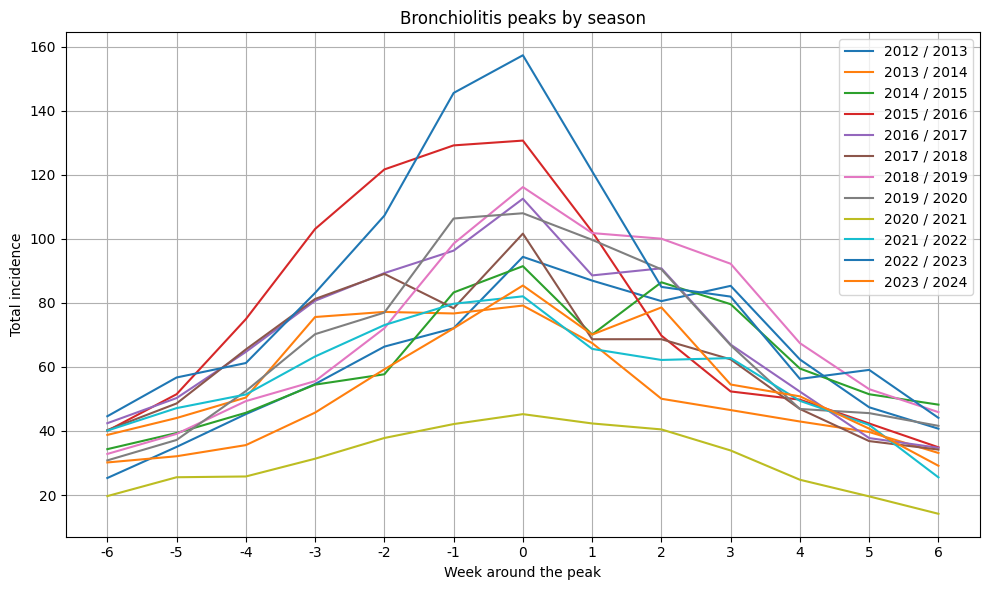

In [ ]:
# Representació dels pics superposats
plt.figure(figsize=(10,6))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']

for temporada,dades in pic_temporades.groupby('temporada'):
  plt.plot(dades['setmana'],dades['incidencia_total'],label=f'{temporada} / {temporada+1}')
  plt.xticks(dades['setmana'],etiquetes)

plt.xlabel('Week around the peak')
plt.ylabel('Total incidence')
plt.title('Bronchiolitis peaks by season')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

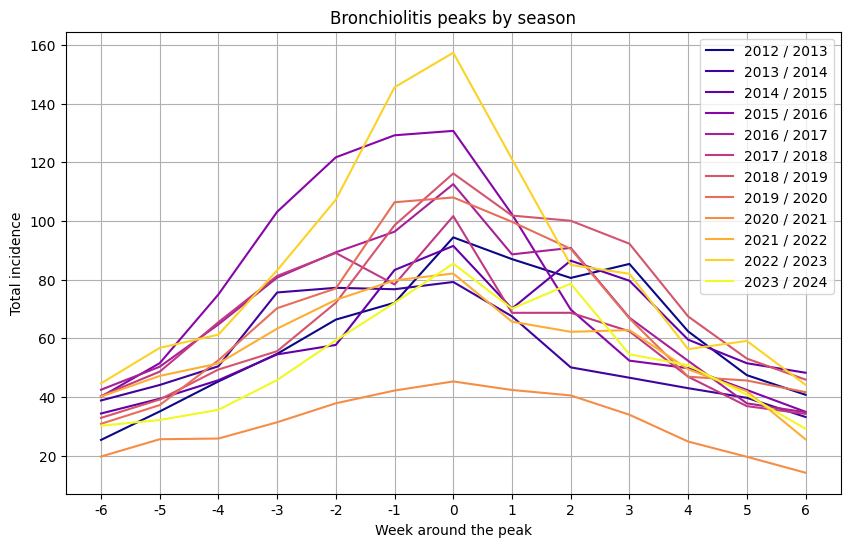

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']

# Normalizar i para que esté en el rango adecuado
max_temporada = len(pic_temporades['temporada'].unique()) - 1
for i, (temporada, dades) in enumerate(pic_temporades.groupby('temporada')):
    plt.plot(dades['setmana'], dades['incidencia_total'], label=f'{temporada} / {temporada+1}', color=plt.cm.plasma(i / max_temporada))
    plt.xticks(dades['setmana'],etiquetes)

plt.xlabel('Week around the peak')
plt.ylabel('Total incidence')
plt.title('Bronchiolitis peaks by season')
plt.legend()
plt.grid(True)
plt.show()


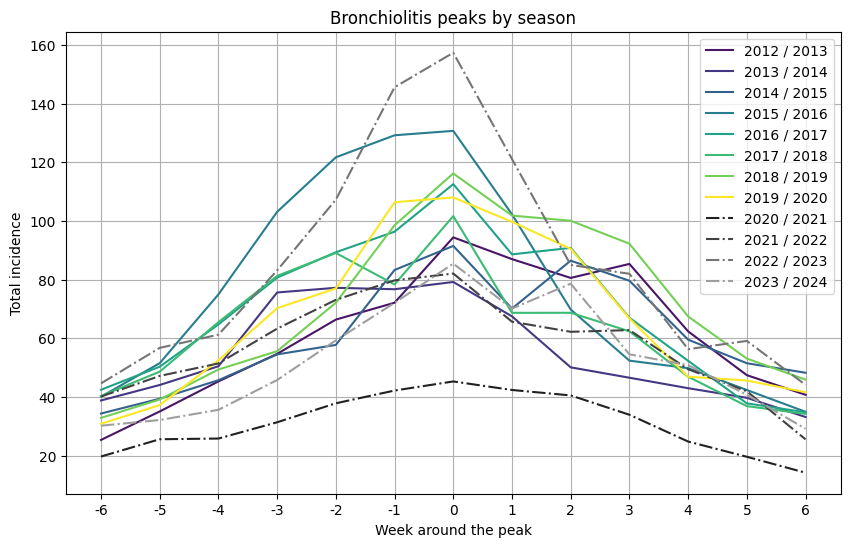

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']

# Definir colores personalizados
colores_personalizados = ['#481567FF', '#453781FF', '#33638DFF', '#287D8EFF', '#20A387FF', '#3CBB75FF', '#73D055FF', '#FDE725FF', '#212121', '#424242', '#757575', '#9E9E9E']

# Definir estilos de línea personalizados
estilos_linea = ['-', '-', '-', '-', '-', '-', '-', '-', '-.', '-.', '-.', '-.']

for i, (temporada, dades) in enumerate(pic_temporades.groupby('temporada')):
    plt.plot(dades['setmana'], dades['incidencia_total'], label=f'{temporada} / {temporada+1}', color=colores_personalizados[i], linestyle=estilos_linea[i])
    plt.xticks(dades['setmana'],etiquetes)

plt.xlabel('Week around the peak')
plt.ylabel('Total incidence')
plt.title('Bronchiolitis peaks by season')
plt.legend()
plt.grid(True)
plt.show()


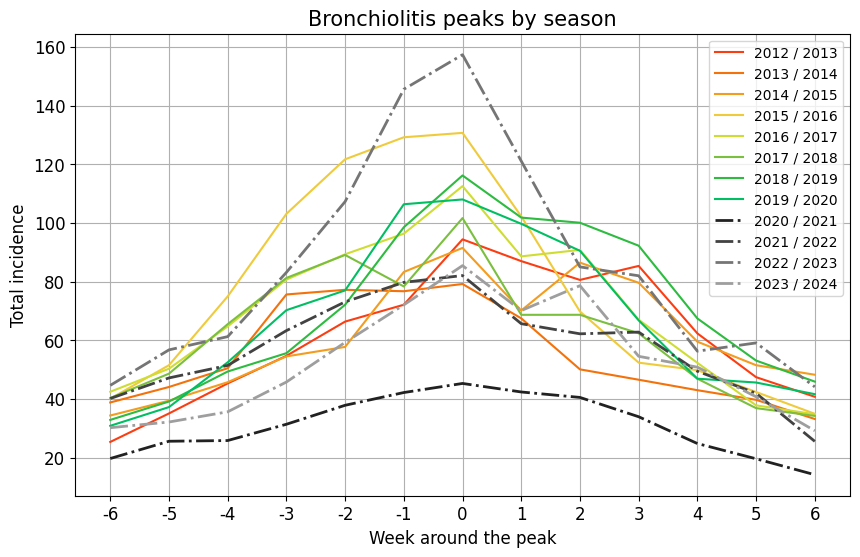

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']

# Definir colores personalizados
colores_personalizados = ['#fc3d11', '#f4720a', '#f39c1e', '#efcb3c', '#cfdd33', '#7bbf3f', '#2dbb40', '#00BF63', '#212121', '#424242', '#757575', '#9E9E9E']

# Definir estilos de línea personalizados
estilos_linea = ['-', '-', '-', '-', '-', '-', '-', '-', '-.', '-.', '-.', '-.']

# Definir el grosor de línea para cada serie
grosor_linea = [1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 2, 2, 2, 2]

for i, (temporada, dades) in enumerate(pic_temporades.groupby('temporada')):
    plt.plot(dades['setmana'], dades['incidencia_total'], label=f'{temporada} / {temporada+1}', color=colores_personalizados[i], linestyle=estilos_linea[i], linewidth=grosor_linea[i])
    plt.xticks(dades['setmana'],etiquetes)

plt.tick_params(axis='both', which='major', labelsize=12)
plt.xlabel('Week around the peak', fontsize=12)
plt.ylabel('Total incidence',fontsize=12)
plt.title('Bronchiolitis peaks by season',fontsize=15)
plt.legend()
plt.grid(True)
plt.show()


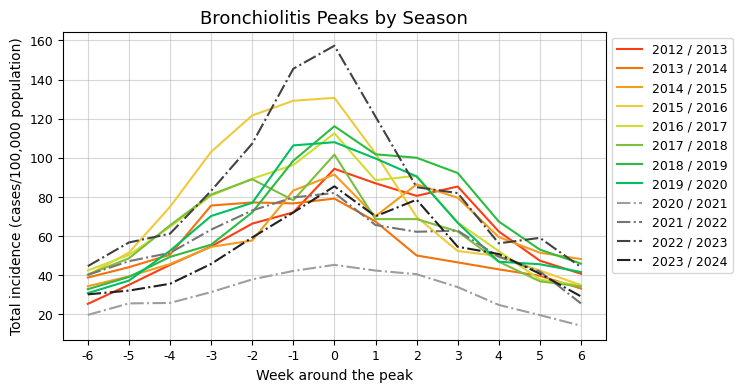

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,4))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']

# Definir colores personalizados
colores_personalizados = ['#fc3d11', '#f4720a', '#f39c1e', '#efcb3c', '#cfdd33', '#7bbf3f', '#2dbb40', '#00BF63', '#9E9E9E', '#757575', '#424242', '#212121']

# Definir estilos de línea personalizados
estilos_linea = ['-', '-', '-', '-', '-', '-', '-', '-', '-.', '-.', '-.', '-.']

# Definir el grosor de línea para cada serie
grosor_linea = [1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5]

for i, (temporada, dades) in enumerate(pic_temporades.groupby('temporada')):
    plt.plot(dades['setmana'], dades['incidencia_total'], label=f'{temporada} / {temporada+1}', color=colores_personalizados[i], linestyle=estilos_linea[i], linewidth=grosor_linea[i])
    plt.xticks(dades['setmana'],etiquetes)

plt.tick_params(axis='both', which='major', labelsize=9)
plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('Total incidence (cases/100,000 population)',fontsize=10)
plt.title('Bronchiolitis Peaks by Season',fontsize=13)
plt.legend(loc='upper left', bbox_to_anchor=(1,1), fontsize=9)
plt.grid(True, alpha=0.5)
# Guardar el gráfico con alta resolución
#plt.savefig('grafico.png', dpi=600)  # Puedes ajustar el DPI según sea necesario

plt.show()


## Risk ratios per temporada

In [ ]:
# Tenint en compte que les "poblacions" son f0,f12,f34 i f514 --> busquem la mitjana per cada pic
# població = incid / casos
f_promt=pic_temporades.groupby('temporada',as_index=False)[['f0','f12','f34','f514']].mean()
print(f_promt)

    temporada        f0       f12       f34      f514
0        2012  0.717121  1.683756  1.794161  7.930374
1        2013  0.666797  1.606952  1.735825  8.027882
2        2014  0.641527  1.532371  1.678254  8.089579
3        2015  0.626921  1.440258  1.604685  8.125518
4        2016  0.616189  1.417284  1.544882  8.162648
5        2017  0.608355  1.412263  1.473572  8.171050
6        2018  0.585313  1.388438  1.448902  8.157493
7        2019  0.564190  1.349868  1.450697  8.126675
8        2020  0.500070  1.250370  1.411800  8.141830
9        2021  0.500826  1.240966  1.402927  8.134763
10       2022  0.505380  1.183190  1.349660  8.093140
11       2023  0.505380  1.183190  1.349660  8.093140


In [ ]:
pic_temporades_rr=pic_temporades.copy()
pic_temporades_rr.drop('Unnamed: 0',axis=1,inplace=True)
pic_temporades_rr.drop('data',axis=1,inplace=True)
pic_temporades_rr.drop('f0',axis=1,inplace=True)
pic_temporades_rr.drop('f12',axis=1,inplace=True)
pic_temporades_rr.drop('f34',axis=1,inplace=True)
pic_temporades_rr.drop('f514',axis=1,inplace=True)
pic_temporades_rr.columns=['Casos_0','Incid_0','Casos_1-2','Incid_1-2','Casos_3-4','Incid_3-4','Casos_5-14','Incid_5-14','Incid_total','Season','Week']
print(pic_temporades_rr)

        Casos_0      Incid_0   Casos_1-2   Incid_1-2  Casos_3-4  Incid_3-4  \
0    218.285714   300.238934   72.428571   42.573988   9.285714   5.148690   
1    318.000000   437.389965   87.142857   51.223141  11.571429   6.416060   
2    401.000000   551.551496  127.285714   74.819375  15.857143   8.792379   
3    499.285714   686.737613  147.571429   86.743451  10.571429   5.861586   
4    601.571429   827.425490  176.571429  103.789841  17.000000   9.426064   
..          ...          ...         ...         ...        ...        ...   
151  510.714286  1010.555000  310.000000  262.003567  30.285714  22.439514   
152  315.571429   624.424054  244.142857  206.342901  28.714286  21.275199   
153  355.142857   702.724400  178.285714  150.682236  11.142857   8.256048   
154  334.714286   662.302200  100.571429   85.000235   7.428571   5.504032   
155  221.857143   438.990745   77.285714   65.319783  11.571429   8.573588   

     Casos_5-14  Incid_5-14  Incid_total  Season  Week  
0     

In [ ]:
# Incidències totals de la temporada --> incid = casos totals / f
# Casos totals de la temporada (pic)
casos_temporada=pic_temporades_rr.groupby('Season')[['Casos_0','Casos_1-2','Casos_3-4','Casos_5-14']].sum()
print(casos_temporada)

            Casos_0    Casos_1-2   Casos_3-4  Casos_5-14
Season                                                  
2012    7708.428571  1672.714286  172.285714  102.571429
2013    6777.857143  1626.571429  177.285714  106.857143
2014    7561.000000  1684.285714  201.142857  122.714286
2015    9288.428571  2206.714286  211.857143  123.000000
2016    8397.714286  1983.714286  153.142857  123.428571
2017    7494.714286  1815.714286  166.142857  120.285714
2018    8068.857143  2243.857143  191.142857  196.714286
2019    7771.714286  2024.571429  127.714286  110.857143
2020    2784.428571  1568.285714  129.285714   71.428571
2021    5540.571429  2353.428571  290.000000  217.285714
2022    8494.142857  3171.714286  346.428571  267.571429
2023    4370.857143  2765.142857  271.142857  208.714286


In [ ]:
# Incidències totals
f_prom=pic_temporades.groupby('temporada')[['f0','f12','f34','f514']].mean()
incid_temporada=pd.DataFrame()
for col1,col2 in zip(casos_temporada.columns,f_prom.columns):
  incid_temporada[col1]=casos_temporada[col1] / f_prom[col2]
incid_temporada.columns=['Incid_0','Incid_1-2','Incid_3-4','Incid_5-14']
print(incid_temporada)

             Incid_0    Incid_1-2   Incid_3-4  Incid_5-14
Season                                                   
2012    10749.135687   993.442062   96.025784   12.933996
2013    10164.799957  1012.209269  102.133430   13.310751
2014    11785.943525  1099.137223  119.852424   15.169428
2015    14815.952872  1532.166290  132.024099   15.137497
2016    13628.473609  1399.659193   99.129156   15.121144
2017    12319.636085  1285.676952  112.748386   14.720961
2018    13785.538939  1616.101213  131.922577   24.114550
2019    13774.993196  1499.829426   88.036477   13.641143
2020     5568.077612  1254.257311   91.575092    8.773036
2021    11062.867245  1896.449563  206.710752   26.710763
2022    16807.437685  2680.646630  256.678402   33.061510
2023     8648.654760  2337.023519  200.897157   25.789037


In [ ]:
# Risk ratios
resultados = []
for season, season_data in incid_temporada.iterrows():
    baseline = season_data['Incid_0']
    for cohort, cohort_data in season_data.items():
        if cohort_data == baseline:
            continue
        risk_factor = cohort_data / baseline
        resultados.append({'Season': season,'Cohort': cohort,'Risk Ratio': risk_factor})
df_resultados = pd.DataFrame(resultados)
print(df_resultados)

    Season      Cohort  Risk Ratio
0     2012   Incid_1-2    0.092421
1     2012   Incid_3-4    0.008933
2     2012  Incid_5-14    0.001203
3     2013   Incid_1-2    0.099580
4     2013   Incid_3-4    0.010048
5     2013  Incid_5-14    0.001309
6     2014   Incid_1-2    0.093258
7     2014   Incid_3-4    0.010169
8     2014  Incid_5-14    0.001287
9     2015   Incid_1-2    0.103413
10    2015   Incid_3-4    0.008911
11    2015  Incid_5-14    0.001022
12    2016   Incid_1-2    0.102701
13    2016   Incid_3-4    0.007274
14    2016  Incid_5-14    0.001110
15    2017   Incid_1-2    0.104360
16    2017   Incid_3-4    0.009152
17    2017  Incid_5-14    0.001195
18    2018   Incid_1-2    0.117232
19    2018   Incid_3-4    0.009570
20    2018  Incid_5-14    0.001749
21    2019   Incid_1-2    0.108881
22    2019   Incid_3-4    0.006391
23    2019  Incid_5-14    0.000990
24    2020   Incid_1-2    0.225259
25    2020   Incid_3-4    0.016446
26    2020  Incid_5-14    0.001576
27    2021   Incid_1

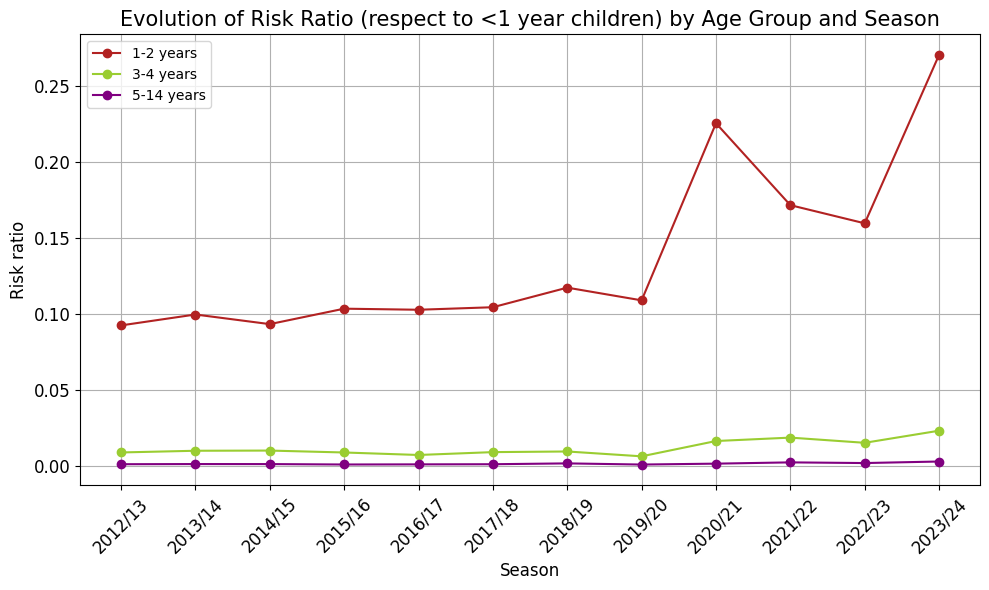

In [ ]:
# Inicializar un diccionario para almacenar los datos de cada cohorte
cohort_data_dict = {}
cohort_legend_labels = {'Incid_1-2': '1-2 years', 'Incid_3-4': '3-4 years', 'Incid_5-14': '5-14 years'}
cohort_colors={'Incid_1-2': 'firebrick', 'Incid_3-4': 'yellowgreen', 'Incid_5-14': 'purple'}

for season, season_data in incid_temporada.iterrows():
    baseline = season_data['Incid_0']
    for cohort, cohort_data in season_data.items():
        if cohort != 'Incid_total' and cohort != 'Week':
            if cohort_data == baseline:  # Saltar si es el primer cohorte
                continue
            risk_factor = cohort_data / baseline
            # Almacenar el factor de riesgo en el diccionario
            if cohort not in cohort_data_dict:
                cohort_data_dict[cohort] = []
            cohort_data_dict[cohort].append(risk_factor)

# Crear el gráfico de líneas
plt.figure(figsize=(10, 6))
for cohort, data in cohort_data_dict.items():
    plt.plot(range(len(data)), data, label=cohort_legend_labels[cohort],color=cohort_colors[cohort],marker='o')

# Configurar el gráfico
plt.title('Evolution of Risk Ratio (respect to <1 year children) by Age Group and Season', fontsize=15)
plt.xlabel('Season', fontsize=12)
plt.ylabel('Risk ratio',fontsize=12)
xtickslabels=[f'{temporada}/{temporada-1999}' for temporada in incid_temporada.index]
plt.xticks(range(len(incid_temporada)),xtickslabels, rotation=45)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Mostrar el gráfico
plt.show()


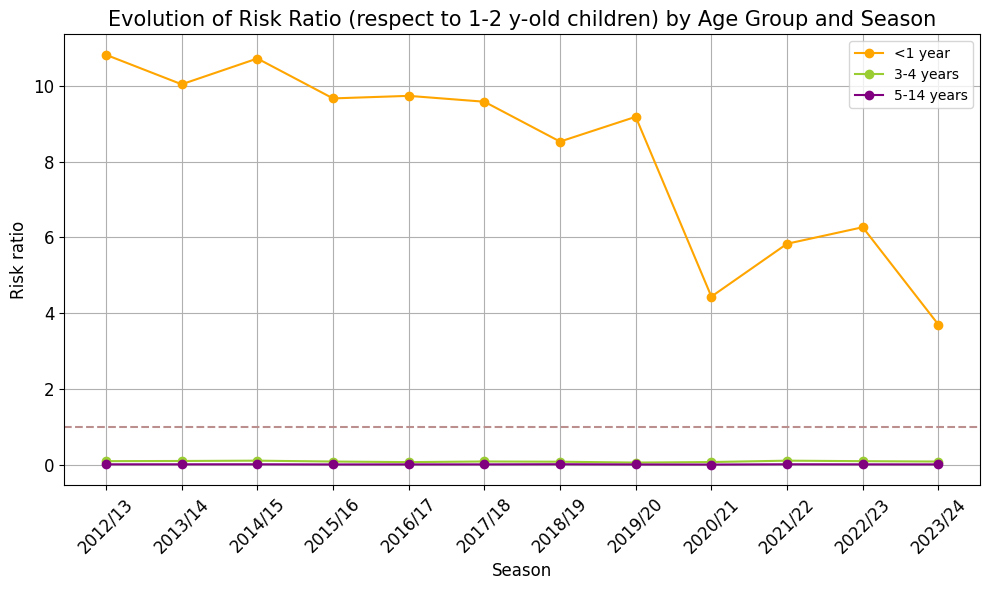

In [ ]:
# Inicializar un diccionario para almacenar los datos de cada cohorte
cohort_data_dict = {}
cohort_legend_labels = {'Incid_0': '<1 year', 'Incid_3-4': '3-4 years', 'Incid_5-14': '5-14 years'}
cohort_colors={'Incid_0': 'orange', 'Incid_3-4': 'yellowgreen', 'Incid_5-14': 'purple'}

for season, season_data in incid_temporada.iterrows():
    baseline = season_data['Incid_1-2']
    for cohort, cohort_data in season_data.items():
        if cohort != 'Incid_total' and cohort != 'Week':
            if cohort_data == baseline:  # Saltar si es el primer cohorte
                continue
            risk_factor = cohort_data / baseline
            # Almacenar el factor de riesgo en el diccionario
            if cohort not in cohort_data_dict:
                cohort_data_dict[cohort] = []
            cohort_data_dict[cohort].append(risk_factor)

# Crear el gráfico de líneas
plt.figure(figsize=(10, 6))
for cohort, data in cohort_data_dict.items():
    plt.plot(range(len(data)), data, label=cohort_legend_labels[cohort],color=cohort_colors[cohort],marker='o')

# Configurar el gráfico
plt.title('Evolution of Risk Ratio (respect to 1-2 y-old children) by Age Group and Season',fontsize=15)
plt.xlabel('Season',fontsize=12)
plt.ylabel('Risk ratio',fontsize=12)
xtickslabels=[f'{temporada}/{temporada-1999}' for temporada in incid_temporada.index]
plt.xticks(range(len(incid_temporada)),xtickslabels,rotation=45)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.axhline(y=1,color='rosybrown',linestyle='--')


# Mostrar el gráfico
plt.show()

Barres d'error

In [ ]:
# Crida a les dades
# Casos totals:
casos_temporada_rr=casos_temporada.copy()

# Població susceptible (s'ha de calcular):
bronq_rr=bronq.copy()
bronq_rr.drop('f0',axis=1,inplace=True)
bronq_rr.drop('f12',axis=1,inplace=True)
bronq_rr.drop('f34',axis=1,inplace=True)
bronq_rr.drop('f514',axis=1,inplace=True)


In [ ]:
bronq_rr['pobl_0']=bronq_rr['casos_setmanals_0a']/bronq_rr['incidencia_setmanal_0a']*100000
bronq_rr['pobl_12']=bronq_rr['casos_setmanals_1-2a']/bronq_rr['incidencia_setmanal_1-2a']*100000
bronq_rr['pobl_34']=bronq_rr['casos_setmanals_3-4a']/bronq_rr['incidencia_setmanal_3-4a']*100000
bronq_rr['pobl_514']=bronq_rr['casos_setmanals_5-14a']/bronq_rr['incidencia_setmanal_5-14a']*100000

In [ ]:
# Població mitjana per any
pobl_rr=bronq_rr.groupby('temporada',as_index=True)[['pobl_0','pobl_12','pobl_34','pobl_514']].mean().round().astype(int)
pobl_rr=pobl_rr.rename_axis(None)
#pobl_rr = pd.DataFrame(pobl_rr, index= ['2012', '2013', '2014', '2015','2016', '2017', '2018', '2019','2020', '2021', '2022','2023'])
print(pobl_rr)

      pobl_0  pobl_12  pobl_34  pobl_514
2012   70796   166722   178526    793841
2013   66153   159942   172880    804196
2014   64078   150530   166073    808860
2015   62416   143395   159759    813370
2016   61643   141910   151903    816635
2017   60107   140420   145992    817142
2018   57800   138161   145229    814359
2019   56047   133489   144872    812526
2020   51923   127233   142261    813534
2021   50353   120668   137134    811010
2022   50538   118319   134966    809314
2023   50538   118319   134966    809314


In [ ]:
# Taula amb casos totals i població total per franja i temporada
risk_ratio_df=casos_temporada_rr.merge(pobl_rr,left_index=True,right_index=True)
print(risk_ratio_df)

            Casos_0    Casos_1-2   Casos_3-4  Casos_5-14  pobl_0  pobl_12  \
Season                                                                      
2012    7708.428571  1672.714286  172.285714  102.571429   70796   166722   
2013    6777.857143  1626.571429  177.285714  106.857143   66153   159942   
2014    7561.000000  1684.285714  201.142857  122.714286   64078   150530   
2015    9288.428571  2206.714286  211.857143  123.000000   62416   143395   
2016    8397.714286  1983.714286  153.142857  123.428571   61643   141910   
2017    7494.714286  1815.714286  166.142857  120.285714   60107   140420   
2018    8068.857143  2243.857143  191.142857  196.714286   57800   138161   
2019    7771.714286  2024.571429  127.714286  110.857143   56047   133489   
2020    2784.428571  1568.285714  129.285714   71.428571   51923   127233   
2021    5540.571429  2353.428571  290.000000  217.285714   50353   120668   
2022    8494.142857  3171.714286  346.428571  267.571429   50538   118319   

In [ ]:
pobl_rr.index=pobl_rr.index.astype(str)
print(pobl_rr.index)

Index(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020',
       '2021', '2022', '2023'],
      dtype='object')


Referència < 1 any

In [ ]:
from tabulate import tabulate
import math
import scipy.stats as st

exposed_cases1=risk_ratio_df['Casos_1-2']
exposed_total1=risk_ratio_df['pobl_12']

exposed_cases2 = risk_ratio_df['Casos_3-4']
exposed_total2 = risk_ratio_df['pobl_34']

exposed_cases3 = risk_ratio_df['Casos_5-14']
exposed_total3 = risk_ratio_df['pobl_514']

control_cases = risk_ratio_df['Casos_0']
control_total = risk_ratio_df['pobl_0']

RR_vec1 = []; CI_vec1_low = []; CI_vec1_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases1.iloc[i].round().astype(int), exposed_total1.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec1.append(RR); CI_vec1_low.append(CI.low); CI_vec1_high.append(CI.high)

RR_vec2 = []; CI_vec2_low = []; CI_vec2_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases2.iloc[i].round().astype(int), exposed_total2.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec2.append(RR); CI_vec2_low.append(CI.low); CI_vec2_high.append(CI.high)

RR_vec3 = []; CI_vec3_low = []; CI_vec3_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases3.iloc[i].round().astype(int), exposed_total3.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec3.append(RR); CI_vec3_low.append(CI.low); CI_vec3_high.append(CI.high)


In [ ]:
# Create DataFrame for the first set of data (RR_vec1 and CI_vec1)
df1 = pd.DataFrame({'RR_0': RR_vec1, 'CI_0_low': CI_vec1_low, 'CI_0_high': CI_vec1_high}, index = pobl_rr.index)

# Create DataFrame for the second set of data (RR_vec2 and CI_vec2)
df2 = pd.DataFrame({'RR_1': RR_vec2, 'CI_1_low': CI_vec2_low, 'CI_1_high': CI_vec2_high}, index = pobl_rr.index)

# Create DataFrame for the third set of data (RR_vec3 and CI_vec3)
df3 = pd.DataFrame({'RR_2': RR_vec3, 'CI_2_low': CI_vec3_low, 'CI_2_high': CI_vec3_high}, index = pobl_rr.index)

# Concatenate the two DataFrames along axis 1 (columns)
result_combined = pd.concat([df1, df2, df3], axis=1)

In [ ]:
data_plot_RR = result_combined.T
data_plot_RR

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
RR_0,0.092166,0.099283,0.094809,0.103429,0.102621,0.103715,0.116344,0.109395,0.229846,0.177201,0.159509,0.270195
CI_0_low,0.087485,0.094125,0.090005,0.098833,0.097811,0.098620,0.111141,0.104279,0.216236,0.169050,0.153341,0.257926
CI_0_high,0.097098,0.104723,0.099869,0.108238,0.107667,0.109072,0.121792,0.114762,0.244312,0.185746,0.165924,0.283048
RR_1,0.008849,0.009993,0.010257,0.008918,0.007393,0.009119,0.009421,0.006372,0.016912,0.019217,0.015253,0.023216
CI_1_low,0.007610,0.008610,0.008919,0.007785,0.006302,0.007821,0.008164,0.005352,0.014179,0.017085,0.013705,0.020544
CI_1_high,0.010290,0.011598,0.011796,0.010215,0.008673,0.010632,0.010871,0.007585,0.020171,0.021616,0.016976,0.026235
RR_2,0.001192,0.001299,0.001289,0.001016,0.001106,0.001178,0.001733,0.000985,0.001628,0.002431,0.001970,0.002986
CI_2_low,0.000981,0.001073,0.001079,0.000851,0.000925,0.000984,0.001505,0.000817,0.001286,0.002124,0.001745,0.002600
CI_2_high,0.001447,0.001572,0.001540,0.001214,0.001321,0.001410,0.001995,0.001188,0.002060,0.002784,0.002224,0.003429


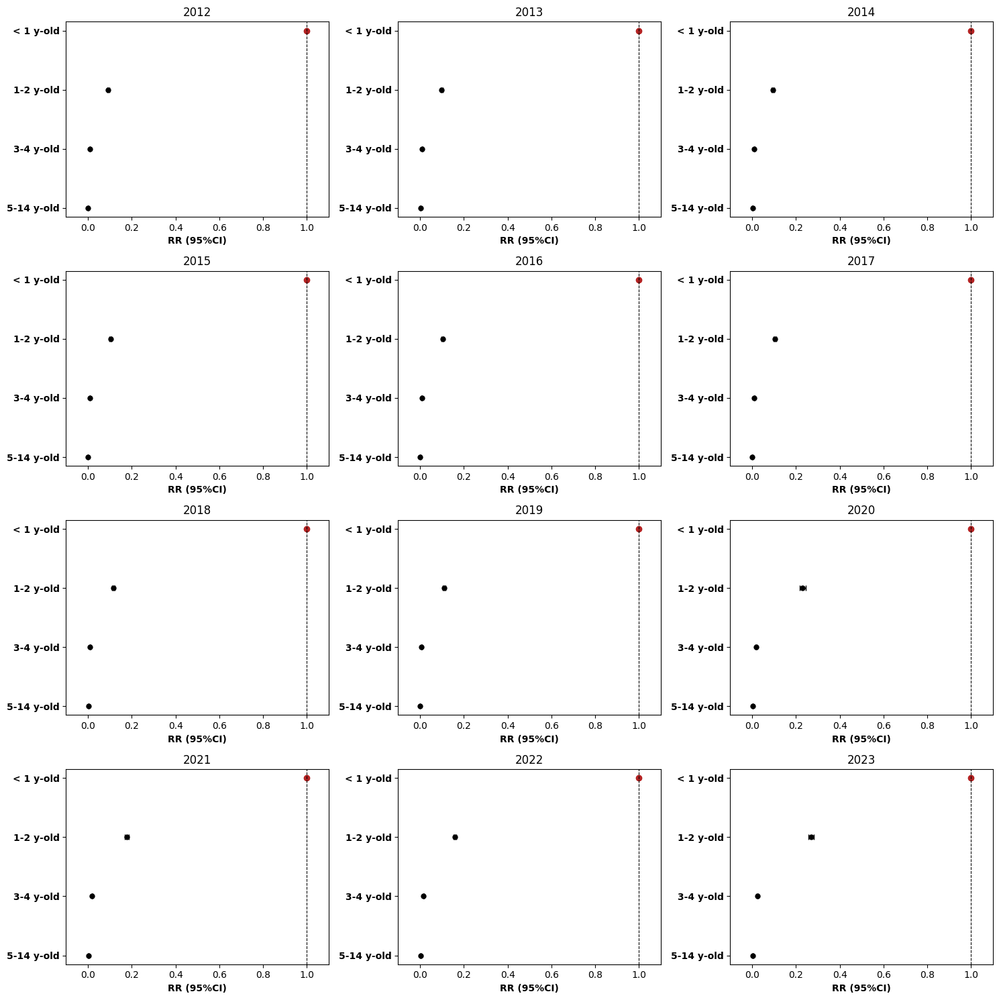

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))  # Ajustar el tamaño de la figura según sea necesario

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
  row=i//3
  column=i%3
  ax[row,column].errorbar(x=data_plot_RR.iloc[[6, 3, 0]][col], y=['5-14 y-old', '3-4 y-old', '1-2 y-old'],
                   xerr=[list(data_plot_RR.iloc[[6, 3, 0]][col].values - data_plot_RR.iloc[[7, 4, 1]][col].values), list(data_plot_RR.iloc[[8, 5, 2]][col].values- data_plot_RR.iloc[[6, 3, 0]][col].values )],
                   color='black', capsize=3, linestyle='None', linewidth=1,
                   marker="o", markersize=5, mfc="black", mec="black")
  ax[row,column].scatter(x=1, y=['< 1 y-old'], color='firebrick')
  ax[row,column].axvline(x=1, linewidth=0.8, linestyle='--', color='black')
  ax[row,column].tick_params(axis='both', which='major', labelsize=10)
  ax[row,column].set_xlabel('RR (95%CI)', fontsize=10, weight='bold')
  ax[row,column].set_xlim((-0.1, 1.1))
  ax[row,column].set_title(col)  # Set title font

  # Set y-axis labels to bold
  for tick in ax[row,column].get_yticklabels():
    tick.set_fontweight('bold')

plt.tight_layout()
plt.show()

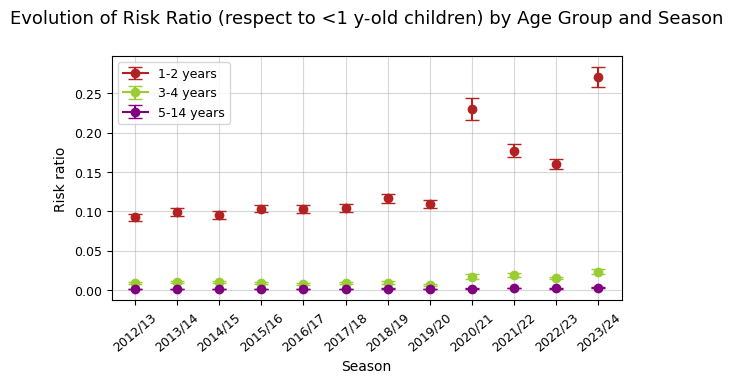

In [ ]:
import matplotlib.pyplot as plt

# Inicializar un diccionario para almacenar los datos de cada cohorte
cohort_data_dict = {}
cohort_legend_labels = {'Incid_1-2': '1-2 years', 'Incid_3-4': '3-4 years', 'Incid_5-14': '5-14 years'}
cohort_colors = {'Incid_1-2': 'firebrick', 'Incid_3-4': 'yellowgreen', 'Incid_5-14': 'purple'}

# Crear el gráfico de líneas con barras de error
plt.figure(figsize=(6,4))

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
    # Obtener los datos de los ratios de riesgo y los intervalos de confianza del dataframe
    for j, cohort in enumerate(['Incid_1-2', 'Incid_3-4', 'Incid_5-14']):
        # Calcular los índices de las filas para el cohorte actual
        idx = j * 3
        # Obtener los datos del DataFrame para el cohorte actual y la temporada actual
        rr_value = data_plot_RR.loc[f'RR_{j}'][col]
        lower_ci_value = data_plot_RR.loc[f'CI_{j}_low'][col]
        upper_ci_value = data_plot_RR.loc[f'CI_{j}_high'][col]

        # Almacenar los datos en el diccionario
        if cohort not in cohort_data_dict:
            cohort_data_dict[cohort] = {'rr_values': [], 'lower_ci_values': [], 'upper_ci_values': []}
        cohort_data_dict[cohort]['rr_values'].append(rr_value)
        cohort_data_dict[cohort]['lower_ci_values'].append(lower_ci_value)
        cohort_data_dict[cohort]['upper_ci_values'].append(upper_ci_value)

        # Dibujar las líneas y las barras de error
        plt.errorbar(i, rr_value, yerr=[[rr_value - lower_ci_value], [upper_ci_value - rr_value]],
                     label=None, color=cohort_colors[cohort], marker='o', capsize=5)  # No asignamos etiquetas aquí

# Configurar el gráfico
plt.title('Evolution of Risk Ratio (respect to <1 y-old children) by Age Group and Season', fontsize=13, y=1.1)
plt.xlabel('Season',fontsize=10)
plt.ylabel('Risk ratio',fontsize=10)
plt.xticks(range(len(['2012/13', '2013/14', '2014/15', '2015/16', '2016/17', '2017/18', '2018/19', '2019/20', '2020/21', '2021/22', '2022/23', '2023/24'])),
           ['2012/13', '2013/14', '2014/15', '2015/16', '2016/17', '2017/18', '2018/19', '2019/20', '2020/21', '2021/22', '2022/23', '2023/24'], rotation=40)
plt.tick_params(axis='both', which='major', labelsize=9)

# Agregar etiquetas de leyenda manualmente
legend_labels_txt = ['1-2 years', '3-4 years', '5-14 years']
plt.legend(loc='upper left', labels=legend_labels_txt, fontsize=9)

plt.grid(True, alpha=0.5)
plt.tight_layout()

# Mostrar el gráfico
plt.show()


Referència: 1-2 anys

In [ ]:
from tabulate import tabulate
import math
import scipy.stats as st

exposed_cases1=risk_ratio_df['Casos_0']
exposed_total1=risk_ratio_df['pobl_0']

exposed_cases2 = risk_ratio_df['Casos_3-4']
exposed_total2 = risk_ratio_df['pobl_34']

exposed_cases3 = risk_ratio_df['Casos_5-14']
exposed_total3 = risk_ratio_df['pobl_514']

control_cases = risk_ratio_df['Casos_1-2']
control_total = risk_ratio_df['pobl_12']

RR_vec1 = []; CI_vec1_low = []; CI_vec1_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases1.iloc[i].round().astype(int), exposed_total1.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec1.append(RR); CI_vec1_low.append(CI.low); CI_vec1_high.append(CI.high)

RR_vec2 = []; CI_vec2_low = []; CI_vec2_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases2.iloc[i].round().astype(int), exposed_total2.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec2.append(RR); CI_vec2_low.append(CI.low); CI_vec2_high.append(CI.high)

RR_vec3 = []; CI_vec3_low = []; CI_vec3_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases3.iloc[i].round().astype(int), exposed_total3.iloc[i].round().astype(int), control_cases.iloc[i].round().astype(int), control_total.iloc[i].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec3.append(RR); CI_vec3_low.append(CI.low); CI_vec3_high.append(CI.high)


In [ ]:
# Create DataFrame for the first set of data (RR_vec1 and CI_vec1)
df1 = pd.DataFrame({'RR_0': RR_vec1, 'CI_0_low': CI_vec1_low, 'CI_0_high': CI_vec1_high}, index = pobl_rr.index)

# Create DataFrame for the second set of data (RR_vec2 and CI_vec2)
df2 = pd.DataFrame({'RR_1': RR_vec2, 'CI_1_low': CI_vec2_low, 'CI_1_high': CI_vec2_high}, index = pobl_rr.index)

# Create DataFrame for the third set of data (RR_vec3 and CI_vec3)
df3 = pd.DataFrame({'RR_2': RR_vec3, 'CI_2_low': CI_vec3_low, 'CI_2_high': CI_vec3_high}, index = pobl_rr.index)

# Concatenate the two DataFrames along axis 1 (columns)
result_combined = pd.concat([df1, df2, df3], axis=1)

In [ ]:
# Calculate the relative risk ratios relative to the 2023/24 period
#result_combined.loc['2020/21 vs. 2023/24 Relative difference (%)'] = 1e2*(result_combined.iloc[0]-result_combined.iloc[3]) / result_combined.iloc[0]
#result_combined.loc['2021/22 vs. 2023/24 Relative difference (%)'] = 1e2*(result_combined.iloc[1]-result_combined.iloc[3] )/ result_combined.iloc[1]
#result_combined.loc['2022/23 vs. 2023/24 Relative difference (%)'] = 1e2*(result_combined.iloc[2]-result_combined.iloc[3]) / result_combined.iloc[2]

#result_combined.loc['2020/21 vs. 2023/24 Absolute difference'] = result_combined.iloc[0] - result_combined.iloc[3]
#result_combined.loc['2021/22 vs. 2023/24 Absolute difference'] = result_combined.iloc[1] - result_combined.iloc[3]
#result_combined.loc['2022/23 vs. 2023/24 Absolute difference'] = result_combined.iloc[2] - result_combined.iloc[3]



In [ ]:
data_plot_RR = result_combined.T
data_plot_RR

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
RR_0,10.850005,10.072261,10.547542,9.668474,9.744587,9.641835,8.595170,9.141151,4.350740,5.643298,6.269249,3.701026
CI_0_low,10.298916,9.549032,10.013111,9.238865,9.287870,9.168253,8.210744,8.713651,4.093124,5.383700,6.026855,3.532965
CI_0_high,11.430584,10.624160,11.110498,10.118061,10.223762,10.139881,8.997595,9.589624,4.624570,5.915414,6.521392,3.877081
RR_1,0.096012,0.100648,0.108188,0.086219,0.072044,0.087921,0.080973,0.058243,0.073580,0.108448,0.095625,0.085922
CI_1_low,0.082078,0.086198,0.093482,0.074899,0.061129,0.075015,0.069866,0.048723,0.061498,0.096018,0.085605,0.075863
CI_1_high,0.112311,0.117519,0.125207,0.099249,0.084908,0.103048,0.093847,0.069624,0.088035,0.122487,0.106818,0.097315
RR_2,0.012930,0.013080,0.013593,0.009825,0.010773,0.011355,0.014894,0.009005,0.007082,0.013722,0.012352,0.011051
CI_2_low,0.010598,0.010757,0.011320,0.008195,0.008980,0.009441,0.012877,0.007440,0.005583,0.011942,0.010906,0.009602
CI_2_high,0.015776,0.015904,0.016322,0.011781,0.012924,0.013658,0.017227,0.010900,0.008982,0.015767,0.013990,0.012717


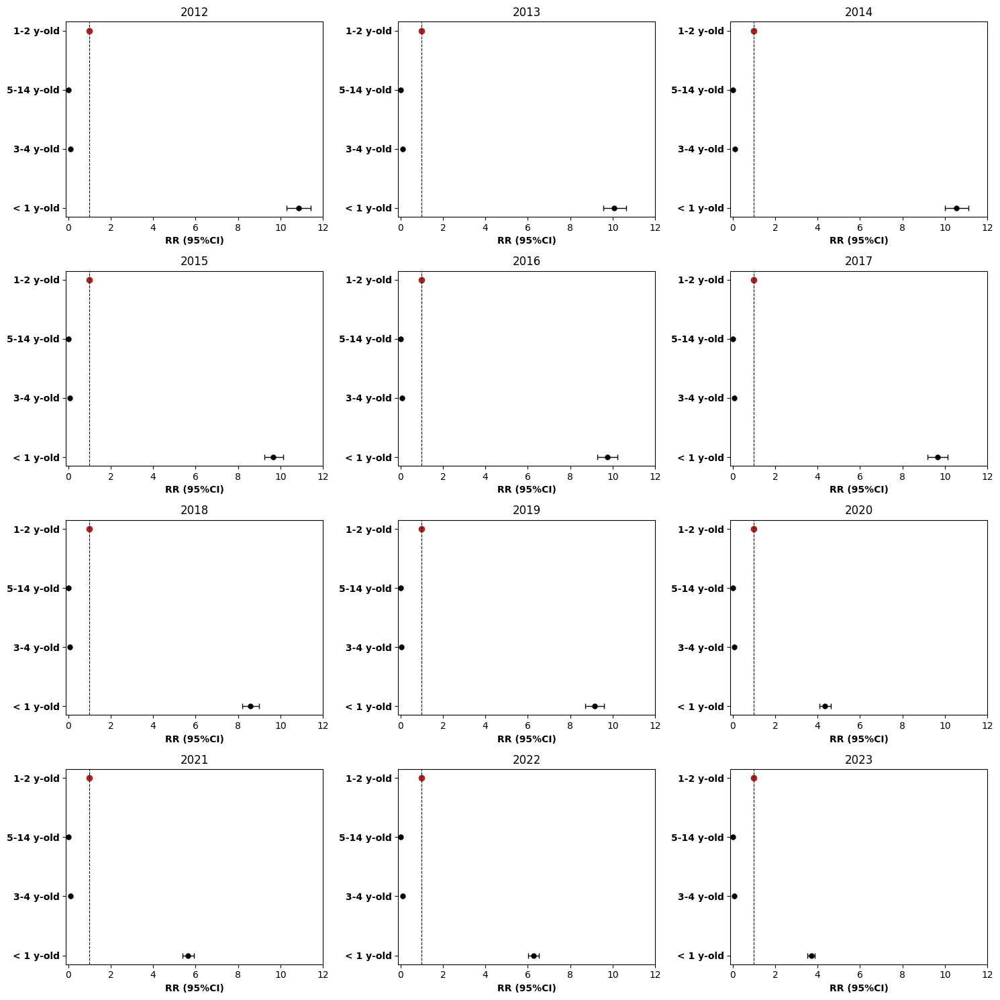

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))  # Ajustar el tamaño de la figura según sea necesario

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
  row=i//3
  column=i%3
  ax[row,column].errorbar(x=data_plot_RR.iloc[[0, 3, 6]][col], y=['< 1 y-old', '3-4 y-old','5-14 y-old'],
                   xerr=[list(data_plot_RR.iloc[[0, 3, 6]][col].values - data_plot_RR.iloc[[1, 4, 7]][col].values), list(data_plot_RR.iloc[[2, 5, 8]][col].values- data_plot_RR.iloc[[0, 3, 6]][col].values )],
                   color='black', capsize=3, linestyle='None', linewidth=1,
                   marker="o", markersize=5, mfc="black", mec="black")
  ax[row,column].scatter(x=1, y=['1-2 y-old'], color='firebrick')
  ax[row,column].axvline(x=1, linewidth=0.8, linestyle='--', color='black')
  ax[row,column].tick_params(axis='both', which='major', labelsize=10)
  ax[row,column].set_xlabel('RR (95%CI)', fontsize=10, weight='bold')
  ax[row,column].set_xlim((-0.1, 12))
  ax[row,column].set_title(col)  # Set title font

  # Set y-axis labels to bold
  for tick in ax[row,column].get_yticklabels():
    tick.set_fontweight('bold')

plt.tight_layout()
plt.show()


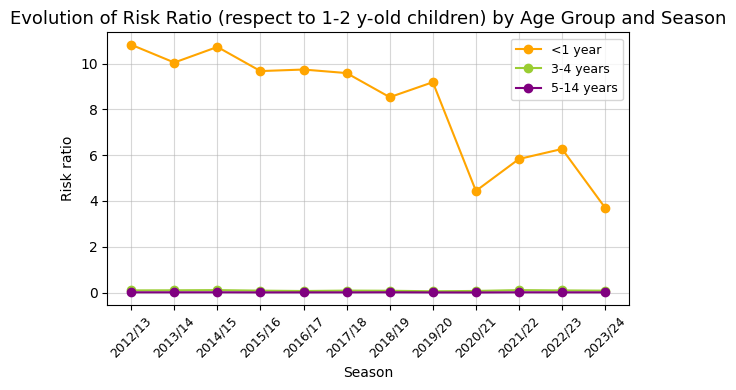

In [ ]:
# Inicializar un diccionario para almacenar los datos de cada cohorte
cohort_data_dict = {}
cohort_legend_labels = {'Incid_0': '<1 year', 'Incid_3-4': '3-4 years', 'Incid_5-14': '5-14 years'}
cohort_colors={'Incid_0': 'orange', 'Incid_3-4': 'yellowgreen', 'Incid_5-14': 'purple'}

for season, season_data in incid_temporada.iterrows():
    baseline = season_data['Incid_1-2']
    for cohort, cohort_data in season_data.items():
        if cohort != 'Incid_total' and cohort != 'Week':
            if cohort_data == baseline:  # Saltar si es el primer cohorte
                continue
            risk_factor = cohort_data / baseline
            # Almacenar el factor de riesgo en el diccionario
            if cohort not in cohort_data_dict:
                cohort_data_dict[cohort] = []
            cohort_data_dict[cohort].append(risk_factor)

# Crear el gráfico de líneas
plt.figure(figsize=(6,4))
for cohort, data in cohort_data_dict.items():
    plt.plot(range(len(data)), data, label=cohort_legend_labels[cohort],color=cohort_colors[cohort],marker='o')

# Configurar el gráfico
plt.title('Evolution of Risk Ratio (respect to 1-2 y-old children) by Age Group and Season', fontsize=13)
plt.xlabel('Season', fontsize=10)
plt.ylabel('Risk ratio', fontsize=10)
xtickslabels=[f'{temporada}/{temporada-1999}' for temporada in incid_temporada.index]
plt.xticks(range(len(incid_temporada)),xtickslabels,fontsize=9,rotation=45)
plt.legend(fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

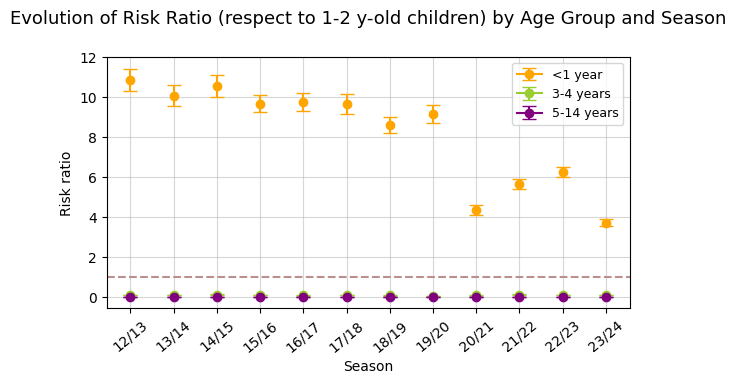

In [ ]:
import matplotlib.pyplot as plt

# Inicializar un diccionario para almacenar los datos de cada cohorte
cohort_data_dict = {}
cohort_legend_labels = {'Incid_0': '<1 year', 'Incid_3-4': '3-4 years', 'Incid_5-14': '5-14 years'}
cohort_colors = {'Incid_0': 'orange', 'Incid_3-4': 'yellowgreen', 'Incid_5-14': 'purple'}
legend_labels=[]

# Crear el gráfico de líneas con barras de error
plt.figure(figsize=(6,4))

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
    # Obtener los datos de los ratios de riesgo y los intervalos de confianza del dataframe
    for j, cohort in enumerate(['Incid_0', 'Incid_3-4', 'Incid_5-14']):
        # Calcular los índices de las filas para el cohorte actual
        idx = j * 3
        # Obtener los datos del DataFrame para el cohorte actual y la temporada actual
        rr_value = data_plot_RR.loc[f'RR_{j}'][col]
        lower_ci_value = data_plot_RR.loc[f'CI_{j}_low'][col]
        upper_ci_value = data_plot_RR.loc[f'CI_{j}_high'][col]

        # Almacenar los datos en el diccionario
        if cohort not in cohort_data_dict:
            cohort_data_dict[cohort] = {'rr_values': [], 'lower_ci_values': [], 'upper_ci_values': []}
        cohort_data_dict[cohort]['rr_values'].append(rr_value)
        cohort_data_dict[cohort]['lower_ci_values'].append(lower_ci_value)
        cohort_data_dict[cohort]['upper_ci_values'].append(upper_ci_value)

        # Dibujar las líneas y las barras de error
        plt.errorbar(i, rr_value, yerr=[[rr_value - lower_ci_value], [upper_ci_value - rr_value]],
                     label=cohort_legend_labels[cohort], color=cohort_colors[cohort], marker='o', capsize=5)

# Configurar el gráfico
plt.title('Evolution of Risk Ratio (respect to 1-2 y-old children) by Age Group and Season', fontsize=13,y=1.1)
plt.xlabel('Season', fontsize=10)
plt.ylabel('Risk ratio', fontsize=10)
xtickslabels=[f'{temporada-2000}/{temporada-1999}' for temporada in incid_temporada.index]
plt.xticks(range(len(incid_temporada)),xtickslabels, rotation=40)
#plt.legend()
legend_labels_txt = ['<1 year', '3-4 years', '5-14 years']
plt.legend(loc='upper right', labels=legend_labels_txt, fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()
plt.axhline(y=1,color='rosybrown',linestyle='--')


# Mostrar el gráfico
plt.show()

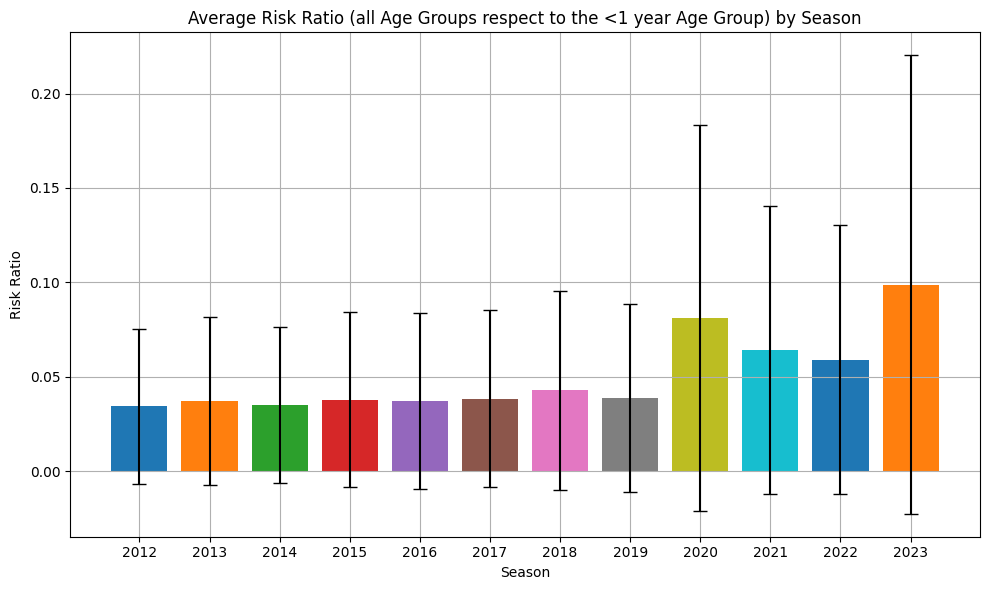

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Inicializar listas para almacenar los datos de los risk ratios por cohorte y temporada
cohortes = []
temporadas = []
risk_ratios = []

for season, season_data in incid_temporada.iterrows():
    baseline = season_data['Incid_0']
    for cohort, cohort_data in season_data.items():
        if cohort != 'Incid_total' and cohort != 'Week':
            if cohort_data == baseline:  # Saltar si es el primer cohorte
                continue
            risk_factor = cohort_data / baseline
            cohortes.append(cohort)
            temporadas.append(season)
            risk_ratios.append(risk_factor)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
unique_temporadas = np.unique(temporadas)
for i, temporada in enumerate(unique_temporadas):
    temporada_indices = [j for j, t in enumerate(temporadas) if t == temporada]
    mean_risk_ratios = [risk_ratios[j] for j in temporada_indices]
    plt.bar([i], np.mean(mean_risk_ratios), yerr=np.std(mean_risk_ratios), capsize=5, label=temporada)

# Configurar el gráfico
plt.title('Average Risk Ratio (all Age Groups respect to the <1 year Age Group) by Season')
plt.xlabel('Season')
plt.ylabel('Risk Ratio')
plt.xticks(range(len(unique_temporadas)), unique_temporadas)
#plt.legend()
plt.grid(True)
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [ ]:
print(pic_temporades_rr)

        Casos_0      Incid_0   Casos_1-2   Incid_1-2  Casos_3-4  Incid_3-4  \
0    218.285714   300.238934   72.428571   42.573988   9.285714   5.148690   
1    318.000000   437.389965   87.142857   51.223141  11.571429   6.416060   
2    401.000000   551.551496  127.285714   74.819375  15.857143   8.792379   
3    499.285714   686.737613  147.571429   86.743451  10.571429   5.861586   
4    601.571429   827.425490  176.571429  103.789841  17.000000   9.426064   
..          ...          ...         ...         ...        ...        ...   
151  510.714286  1010.555000  310.000000  262.003567  30.285714  22.439514   
152  315.571429   624.424054  244.142857  206.342901  28.714286  21.275199   
153  355.142857   702.724400  178.285714  150.682236  11.142857   8.256048   
154  334.714286   662.302200  100.571429   85.000235   7.428571   5.504032   
155  221.857143   438.990745   77.285714   65.319783  11.571429   8.573588   

     Casos_5-14  Incid_5-14  Incid_total  Season  Week  
0     

In [ ]:
# Intervals de confiança pels risk ratios
# incid cada edat / incid 0
serie_rr=pic_temporades_rr.copy()
serie_rr.drop('Casos_0',axis=1,inplace=True)
serie_rr.drop('Casos_1-2',axis=1,inplace=True)
serie_rr.drop('Casos_3-4',axis=1,inplace=True)
serie_rr.drop('Casos_5-14',axis=1,inplace=True)
serie_rr.drop('Incid_total',axis=1,inplace=True)
serie_rr.drop('Week',axis=1,inplace=True)

serie_rr_temp=serie_rr.groupby('Season')
print(serie_rr_temp)

In [ ]:
serie_rr_temp=serie_rr.groupby('Season').groups
serie_rr_dict={}
for grup,indices in serie_rr_temp.items():
  grup_df=serie_rr.iloc[indices]
  serie_rr_dict[grup]=grup_df
print(serie_rr_dict)

{2012:         Incid_0   Incid_1-2  Incid_3-4  Incid_5-14  Season
0    300.238934   42.573988   5.148690    0.973781    2012
1    437.389965   51.223141   6.416060    1.136078    2012
2    551.551496   74.819375   8.792379    0.757385    2012
3    686.737613   86.743451   5.861586    0.883616    2012
4    827.425490  103.789841   9.426064    1.406573    2012
5    929.601044  103.537924   7.762641    1.280342    2012
6   1243.594379  127.721964   8.475536    1.298375    2012
7   1137.292505  114.706248  12.436067    1.568870    2012
8   1139.315580   80.890877  11.318051    0.918556    2012
9   1300.784399   66.845904   3.700295    0.593230    2012
10   950.526001   46.064794   3.780737    0.737043    2012
11   682.103678   48.575845   6.435296    0.539300    2012
12   576.535142   42.947627   6.354855    0.844903    2012, 2013:         Incid_0   Incid_1-2  Incid_3-4  Incid_5-14  Season
13   474.649230   67.971547   7.641914    1.366227    2013
14   554.643993   74.205880   8.768091    

In [ ]:
all_data=pd.DataFrame()
# Iterar sobre las claves (temporadas)
for season in serie_rr_dict:
    # Obtener los datos para esta temporada
    season_data = serie_rr_dict[season]

    # Realizar las operaciones para cada columna
    incid_1_2_divided = [a / b for a, b in zip(season_data['Incid_1-2'], season_data['Incid_0'])]
    incid_3_4_divided = [a / b for a, b in zip(season_data['Incid_3-4'], season_data['Incid_0'])]
    incid_5_14_divided = [a / b for a, b in zip(season_data['Incid_5-14'], season_data['Incid_0'])]

    # Imprimir los resultados o almacenarlos como desees
    print(f"Resultados para la temporada {season}:")
    print("Incid_1-2 dividido por Incid_0:", incid_1_2_divided)
    print("Incid_3-4 dividido por Incid_0:", incid_3_4_divided)
    print("Incid_5-14 dividido por Incid_0:", incid_5_14_divided)
    print()

    season_df = pd.DataFrame({'Incid_1-2 / Incid_0': incid_1_2_divided,'Incid_3-4 / Incid_0': incid_3_4_divided,'Incid_5-14 / Incid_0': incid_5_14_divided,'Season': season})

    # Agregar los datos de esta temporada al DataFrame general
    all_data = pd.concat([all_data, season_df], ignore_index=True)


Resultados para la temporada 2012:
Incid_1-2 dividido por Incid_0: [0.1418003572632761, 0.11711092060475396, 0.1356525653992469, 0.12631236345691332, 0.12543708392656291, 0.11137888053515274, 0.102703877025574, 0.10085905549571328, 0.0709995358440785, 0.05138891871960718, 0.048462423650587935, 0.0712147524127323, 0.07449264426537862]
Incid_3-4 dividido por Incid_0: [0.017148642752798416, 0.014668969633204468, 0.015941174536278177, 0.008535408092195107, 0.01139203919780371, 0.008350507651252935, 0.006815354219311667, 0.010934800919210381, 0.00993407920677146, 0.0028446646374275207, 0.003977520424038989, 0.009434484110880872, 0.011022493931992856]
Incid_5-14 dividido por Incid_0: [0.003243354509350402, 0.0025974034016181423, 0.0013731908257931325, 0.0012866870069627688, 0.0016999391533743997, 0.0013773027549199004, 0.0010440502849923452, 0.0013794778950542799, 0.000806234829340789, 0.0004560555557778622, 0.000775405693845873, 0.0007906422052777574, 0.0014654844130898277]

Resultados para

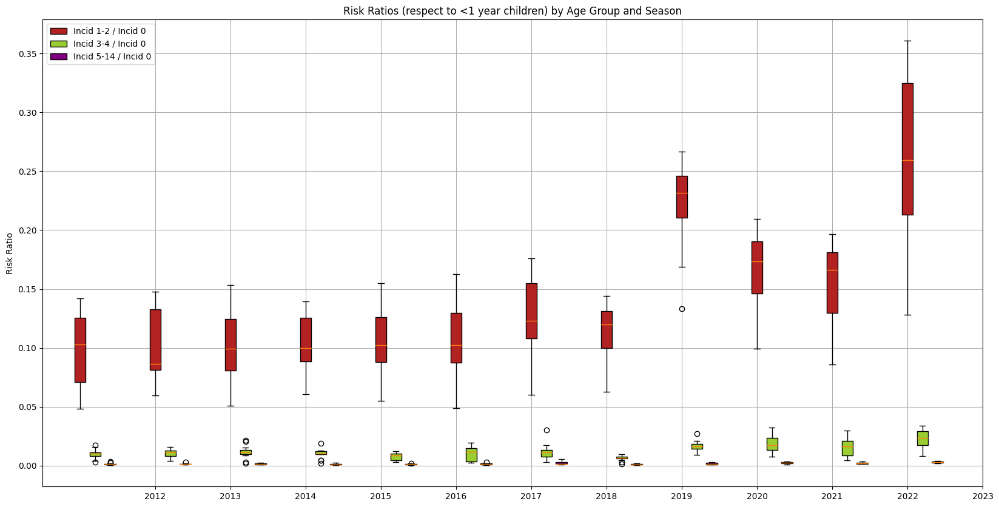

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todas las temporadas y divisiones
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['firebrick','yellowgreen','purple']
legend_labels=[]

for i, (season, season_data) in enumerate(serie_rr_dict.items()):
    for j, division in enumerate(['Incid_1-2', 'Incid_3-4', 'Incid_5-14']):
        # Dividir los datos de la columna 2 por los datos de la columna 1
        ratios = season_data[division] / season_data['Incid_0']
        box = ax.boxplot(ratios, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
        labels.append(f'{season}-{division} / Incid_0')
        legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(serie_rr_dict) + 1))
ax.set_xticklabels([str(season) for season in serie_rr_dict.keys()])
ax.set_ylabel('Risk Ratio')
ax.set_title('Risk Ratios (respect to <1 year children) by Age Group and Season')

legend_labels_txt=['Incid 1-2 / Incid 0', 'Incid 3-4 / Incid 0', 'Incid 5-14 / Incid 0']
ax.legend(legend_labels, legend_labels_txt, loc='upper left')

plt.grid(True)
plt.show()


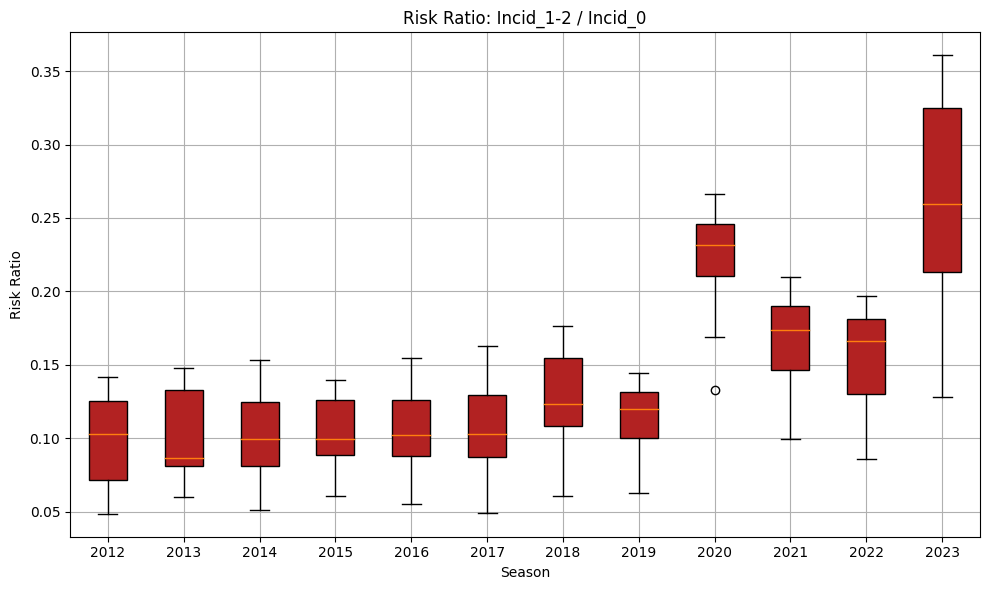

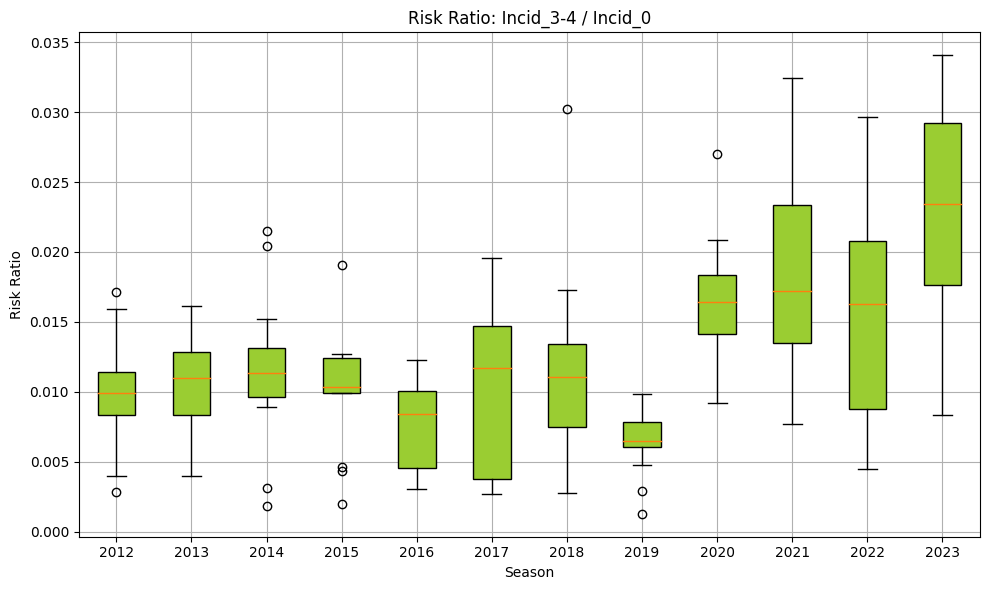

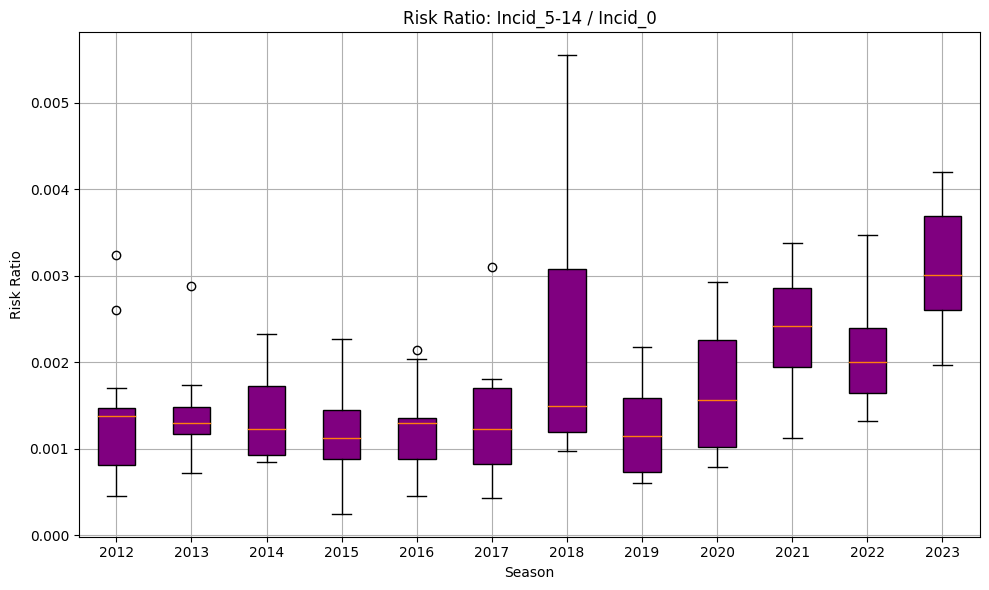

In [ ]:
import matplotlib.pyplot as plt

# Lista de colores para cada división
colors = {'Incid_1-2': 'firebrick','Incid_3-4': 'yellowgreen','Incid_5-14': 'purple'}

# Crear un diagrama de caja para cada columna dividida
for i, division in enumerate(['Incid_1-2', 'Incid_3-4', 'Incid_5-14']):
    fig, ax = plt.subplots(figsize=(10, 6))  # Crear una nueva figura y ejes para cada diagrama

    boxplot_data = []  # Almacenar los datos para el boxplot

    # Obtener los datos de la columna dividida y dividirlos por Incid_0
    for season, season_data in serie_rr_dict.items():
        ratios = season_data[division] / season_data['Incid_0']
        boxplot_data.append(ratios)

    # Crear el boxplot con colores personalizados
    box = ax.boxplot(boxplot_data, patch_artist=True, boxprops=dict(facecolor=colors[division]))

    # Configurar el gráfico
    ax.set_title(f'Risk Ratio: {division} / Incid_0')
    ax.set_xlabel('Season')
    ax.set_ylabel('Risk Ratio')
    ax.set_xticks(range(1, len(serie_rr_dict) + 1))
    ax.set_xticklabels(serie_rr_dict.keys())
    ax.grid(True)
    plt.tight_layout()

    # Guardar la figura en un archivo con un nombre único para cada división
    #plt.savefig(f'boxplot_{division}.png')

    # Cerrar la figura para liberar memoria
    #plt.close()
    plt.show()


## Pic mitjà prepandèmic (per cada franja d'edat)

In [ ]:
# Filtre prepandèmia
pic_temporades_pre=pic_temporades.copy()
pic_temporades_pre.drop('casos_setmanals_0a',axis=1,inplace=True)
pic_temporades_pre.drop('casos_setmanals_1-2a',axis=1,inplace=True)
pic_temporades_pre.drop('casos_setmanals_3-4a',axis=1,inplace=True)
pic_temporades_pre.drop('casos_setmanals_5-14a',axis=1,inplace=True)
pic_temporades_pre.drop('f0',axis=1,inplace=True)
pic_temporades_pre.drop('f12',axis=1,inplace=True)
pic_temporades_pre.drop('f34',axis=1,inplace=True)
pic_temporades_pre.drop('f514',axis=1,inplace=True)
pic_temporades_prepand=pic_temporades_pre[(pic_temporades_pre['temporada']<=2019)]

In [ ]:
# Preparar dataframe
prom_pic_prepand=pic_temporades_prepand.groupby('setmana').mean()
prom_pic_prepand.drop('Unnamed: 0',axis=1,inplace=True)
prom_pic_prepand.drop('temporada',axis=1,inplace=True)
print(prom_pic_prepand)

                       data  incidencia_setmanal_0a  incidencia_setmanal_1-2a  \
setmana                                                                         
1       2016-05-15 12:00:00              476.060723                 65.420430   
2       2016-05-22 12:00:00              578.321947                 81.878034   
3       2016-05-29 12:00:00              749.217324                108.469802   
4       2016-06-05 12:00:00              980.121373                134.478410   
5       2016-06-12 12:00:00             1131.586307                144.129916   
6       2016-06-19 12:00:00             1336.196344                149.500260   
7       2016-06-26 12:00:00             1574.845085                152.253031   
8       2016-07-03 12:00:00             1317.461849                115.044124   
9       2016-07-10 12:00:00             1256.252077                 96.728680   
10      2016-07-17 12:00:00             1130.143955                 69.553990   
11      2016-07-24 12:00:00 

In [ ]:
# Càlcul dels intervals de confiança
pic_temporades_prepand=pic_temporades_prepand.drop('data',axis=1)

from scipy import stats
setmanes=pic_temporades_prepand.groupby('setmana')
promitjos=setmanes.mean()

def conf_intervals(pic_temporades_prepand):
  mean=pic_temporades_prepand.mean()
  n=len(pic_temporades_prepand)
  stderr=stats.sem(pic_temporades_prepand)
  interval=stderr * stats.t.ppf((1+0.95)/2,n-1)
  return mean,mean-interval,mean+interval

intervals=setmanes.aggregate(lambda x: conf_intervals(x))
resultats=pd.concat([promitjos,intervals.rename(columns=lambda x: x+'_ci')],axis=1)
#print(resultats)

In [ ]:
#print(resultats.columns)

In [ ]:
# Guardar les dades en un df
resultats_f=pd.DataFrame()
  # Separar tuples en columnes
for columna in resultats.columns:
   if not columna.endswith('_ci'):
     continue
   dades_sep=resultats[columna].apply(pd.Series)
   dades_sep.columns=[f'{columna}_{i}' for i in range(len(dades_sep.columns))]
   resultats_f=pd.concat([resultats_f,dades_sep],axis=1)
#print(resultats_f)
resultats_f.head()

,Unnamed: 0_ci_0,Unnamed: 0_ci_1,Unnamed: 0_ci_2,incidencia_setmanal_0a_ci_0,incidencia_setmanal_0a_ci_1,incidencia_setmanal_0a_ci_2,incidencia_setmanal_1-2a_ci_0,incidencia_setmanal_1-2a_ci_1,incidencia_setmanal_1-2a_ci_2,incidencia_setmanal_3-4a_ci_0,...,incidencia_setmanal_3-4a_ci_2,incidencia_setmanal_5-14a_ci_0,incidencia_setmanal_5-14a_ci_1,incidencia_setmanal_5-14a_ci_2,incidencia_total_ci_0,incidencia_total_ci_1,incidencia_total_ci_2,temporada_ci_0,temporada_ci_1,temporada_ci_2
setmana,,,,,,,,,,,,,,,,,,,,,
1,192.5,85.960622,299.039378,476.060723,402.711127,549.410319,65.420430,54.303578,76.537282,7.274824,...,9.955630,1.285781,0.812207,1.759356,35.602858,30.744828,40.460889,2015.5,2013.452175,2017.547825
2,193.5,86.960622,300.039378,578.321947,497.361322,659.282573,81.878034,67.467014,96.289053,7.885150,...,9.626066,1.083459,0.755724,1.411194,43.136399,37.821271,48.451527,2015.5,2013.452175,2017.547825
3,194.5,87.960622,301.039378,749.217324,614.107873,884.326775,108.469802,85.323194,131.616409,10.523108,...,13.591159,1.281060,0.978638,1.583482,56.031197,46.911478,65.150916,2015.5,2013.452175,2017.547825
4,195.5,88.960622,302.039378,980.121373,766.893741,1193.349005,134.478410,106.967632,161.989189,11.354858,...,14.986726,1.368914,0.992344,1.745485,71.936924,57.737813,86.136034,2015.5,2013.452175,2017.547825
5,196.5,89.960622,303.039378,1131.586307,883.006525,1380.166090,144.129916,113.243857,175.015975,12.261721,...,14.832478,1.285921,1.050182,1.521660,81.285714,65.005280,97.566148,2015.5,2013.452175,2017.547825


In [ ]:
print(resultats_f.columns)

Index(['Unnamed: 0_ci_0', 'Unnamed: 0_ci_1', 'Unnamed: 0_ci_2',
       'incidencia_setmanal_0a_ci_0', 'incidencia_setmanal_0a_ci_1',
       'incidencia_setmanal_0a_ci_2', 'incidencia_setmanal_1-2a_ci_0',
       'incidencia_setmanal_1-2a_ci_1', 'incidencia_setmanal_1-2a_ci_2',
       'incidencia_setmanal_3-4a_ci_0', 'incidencia_setmanal_3-4a_ci_1',
       'incidencia_setmanal_3-4a_ci_2', 'incidencia_setmanal_5-14a_ci_0',
       'incidencia_setmanal_5-14a_ci_1', 'incidencia_setmanal_5-14a_ci_2',
       'incidencia_total_ci_0', 'incidencia_total_ci_1',
       'incidencia_total_ci_2', 'temporada_ci_0', 'temporada_ci_1',
       'temporada_ci_2'],
      dtype='object')


In [ ]:
# Ordenar el dataframe
resultats_f.drop('Unnamed: 0_ci_0',axis=1,inplace=True)
resultats_f.drop('Unnamed: 0_ci_1',axis=1,inplace=True)
resultats_f.drop('Unnamed: 0_ci_2',axis=1,inplace=True)
resultats_f.drop('temporada_ci_0',axis=1,inplace=True)
resultats_f.drop('temporada_ci_1',axis=1,inplace=True)
resultats_f.drop('temporada_ci_2',axis=1,inplace=True)
resultats_f.columns=['incid_0a','incid_0a_icinf','incid_0a_icsup','incid_1-2a','incid_1-2a_icinf','incid_1-2a_icsup','incid_3-4a','incid_3-4a_icinf','incid_3-4a_icsup','incid_5-14a','incid_5-14a_icinf','incid_5-14a_icsup','incid_total','incid_total_icinf','incid_total_icsup',]
pics_promig_prepand=resultats_f
pics_promig_prepand.head()

,incid_0a,incid_0a_icinf,incid_0a_icsup,incid_1-2a,incid_1-2a_icinf,incid_1-2a_icsup,incid_3-4a,incid_3-4a_icinf,incid_3-4a_icsup,incid_5-14a,incid_5-14a_icinf,incid_5-14a_icsup,incid_total,incid_total_icinf,incid_total_icsup
setmana,,,,,,,,,,,,,,,
1,476.060723,402.711127,549.410319,65.420430,54.303578,76.537282,7.274824,4.594018,9.955630,1.285781,0.812207,1.759356,35.602858,30.744828,40.460889
2,578.321947,497.361322,659.282573,81.878034,67.467014,96.289053,7.885150,6.144233,9.626066,1.083459,0.755724,1.411194,43.136399,37.821271,48.451527
3,749.217324,614.107873,884.326775,108.469802,85.323194,131.616409,10.523108,7.455057,13.591159,1.281060,0.978638,1.583482,56.031197,46.911478,65.150916
4,980.121373,766.893741,1193.349005,134.478410,106.967632,161.989189,11.354858,7.722991,14.986726,1.368914,0.992344,1.745485,71.936924,57.737813,86.136034
5,1131.586307,883.006525,1380.166090,144.129916,113.243857,175.015975,12.261721,9.690963,14.832478,1.285921,1.050182,1.521660,81.285714,65.005280,97.566148


### Representacions dels pics superposats

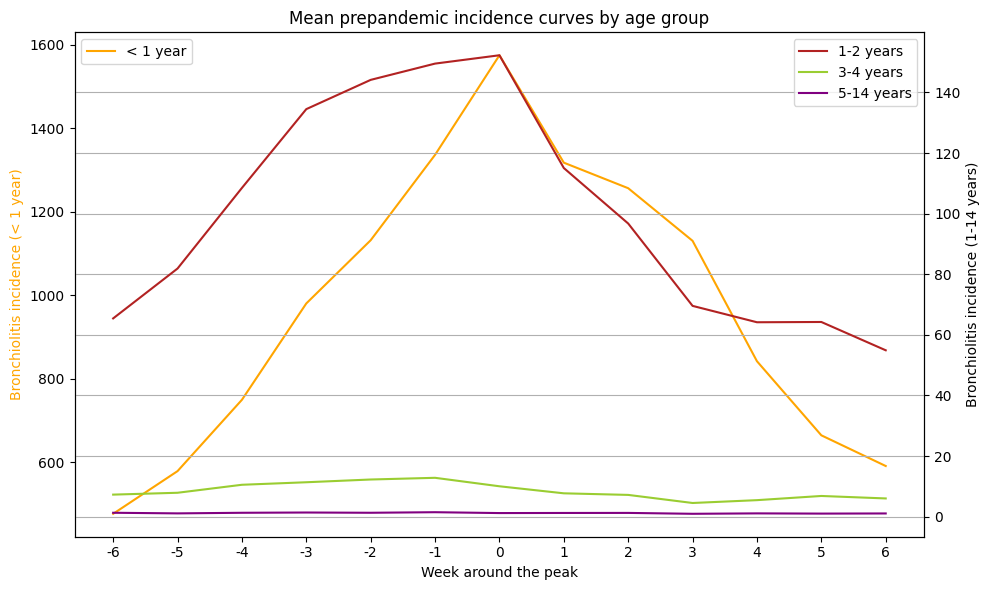

In [ ]:
# Representació dels pics superposats
col1='orange'
col2='black'
fig,ax1=plt.subplots(figsize=(10,6))
ax1.plot(pics_promig_prepand.index,pics_promig_prepand['incid_0a'],label='< 1 year',color=col1)
ax1.set_xlabel('Week around the peak')
ax1.set_ylabel('Bronchiolitis incidence (< 1 year)',color=col1)

ax2=ax1.twinx()
ax2.plot(pics_promig_prepand.index,pics_promig_prepand['incid_1-2a'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_5-14a'],label='5-14 years',color='purple')
ax2.set_ylabel('Bronchiolitis incidence (1-14 years)',color=col2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prepand.index,etiquetes)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Mean prepandemic incidence curves by age group')
#fig.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

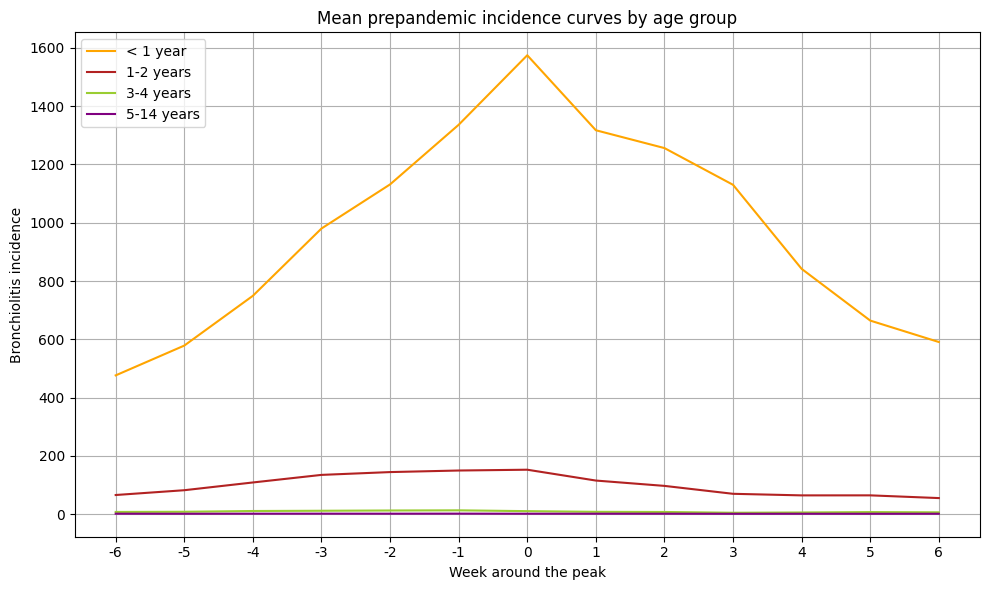

In [ ]:
# Representació dels pics superposats
fig,ax1=plt.subplots(figsize=(10,6))
ax1.plot(pics_promig_prepand.index,pics_promig_prepand['incid_0a'],label='< 1 year', color='orange')
ax1.plot(pics_promig_prepand.index,pics_promig_prepand['incid_1-2a'],label='1-2 years',color='firebrick')
ax1.plot(pics_promig_prepand.index,pics_promig_prepand['incid_3-4a'],label='3-4 years',color='yellowgreen')
ax1.plot(pics_promig_prepand.index,pics_promig_prepand['incid_5-14a'],label='5-14 years',color='purple')
ax1.set_xlabel('Week around the peak')
ax1.set_ylabel('Bronchiolitis incidence')

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prepand.index,etiquetes)

ax1.legend(loc='upper left')
plt.title('Mean prepandemic incidence curves by age group')
#fig.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

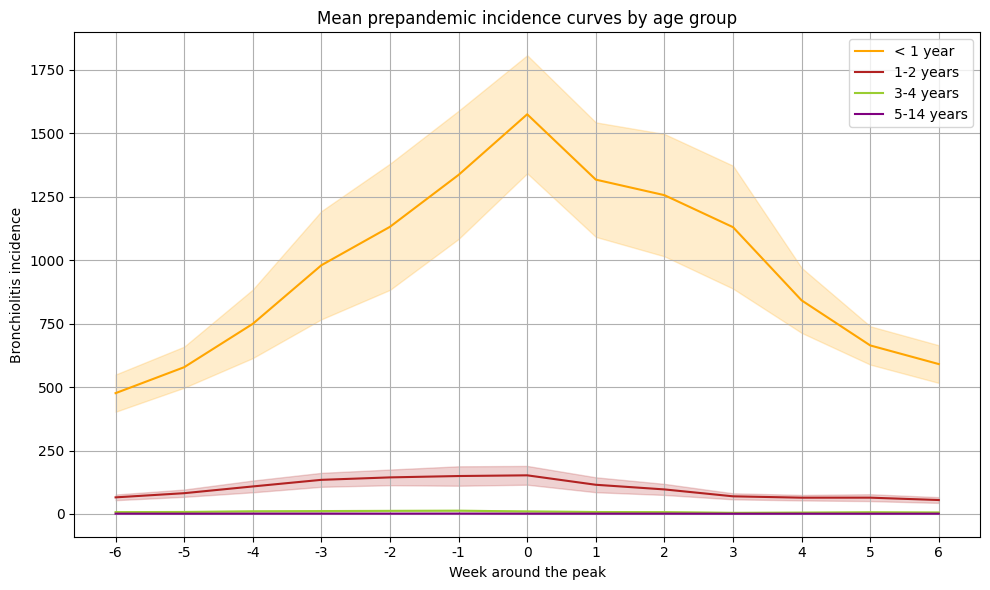

In [ ]:
# Representació dels pics superposats amb IC 90% (un eix)
plt.figure(figsize=(10,6))
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_0a'],label='< 1 year', color='orange')
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_1-2a'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prepand.index,pics_promig_prepand['incid_5-14a'],label='5-14 years',color='purple')
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_0a_icinf'],pics_promig_prepand['incid_0a_icsup'], color='orange',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_1-2a_icinf'],pics_promig_prepand['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_3-4a_icinf'],pics_promig_prepand['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_5-14a_icinf'],pics_promig_prepand['incid_5-14a_icsup'], color='purple',alpha=0.2)

plt.xlabel('Week around the peak')
plt.ylabel('Bronchiolitis incidence')

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prepand.index,etiquetes)

plt.legend(loc='upper left')
plt.title('Mean prepandemic incidence curves by age group')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

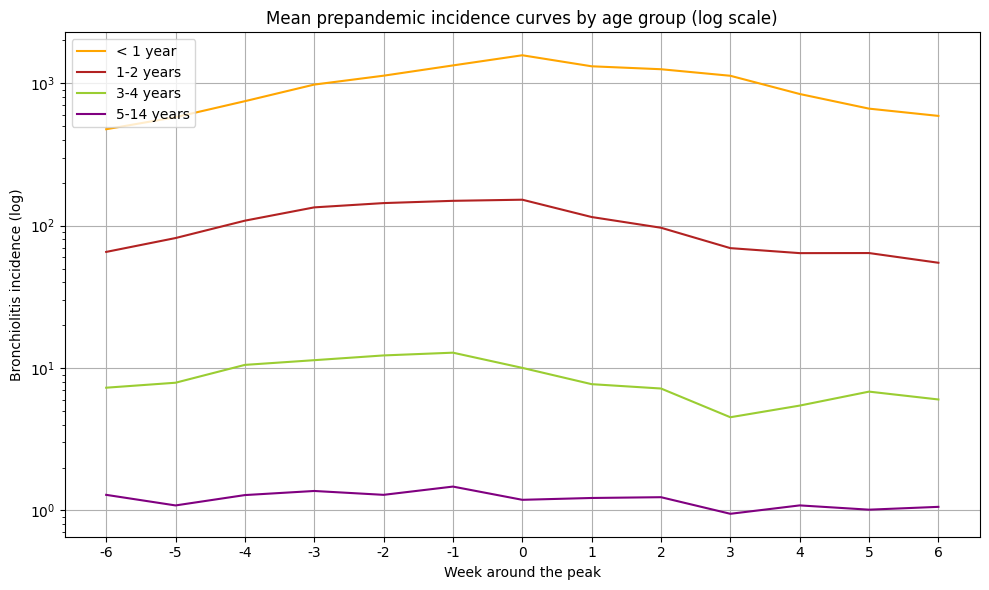

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Trama de las series en escala logarítmica
ax1.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_0a'], label='< 1 year', color='orange')
ax1.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_1-2a'], label='1-2 years', color='firebrick')
ax1.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_3-4a'], label='3-4 years', color='yellowgreen')
ax1.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_5-14a'], label='5-14 years', color='purple')

ax1.set_xlabel('Week around the peak')
ax1.set_ylabel('Bronchiolitis incidence (log)')

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prepand.index, etiquetes)

ax1.legend(loc='upper left')
plt.title('Mean prepandemic incidence curves by age group (log scale)')
plt.grid(True)
plt.tight_layout()

plt.show()


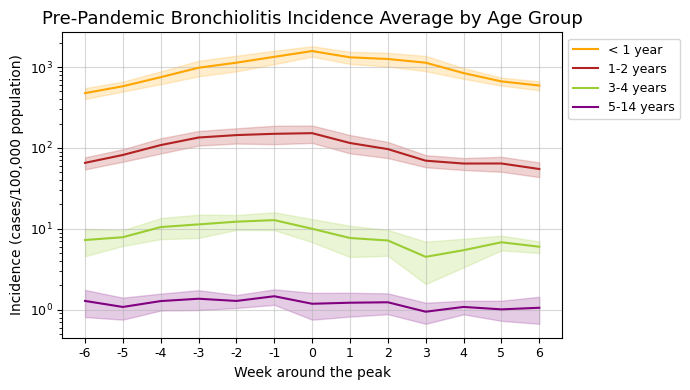

In [ ]:
plt.figure(figsize=(7,4))

# Trama de las series en escala logarítmica amb 95%
plt.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_0a'], label='< 1 year', color='orange')
plt.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_1-2a'], label='1-2 years', color='firebrick')
plt.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_3-4a'], label='3-4 years', color='yellowgreen')
plt.semilogy(pics_promig_prepand.index, pics_promig_prepand['incid_5-14a'], label='5-14 years', color='purple')
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_0a_icinf'],pics_promig_prepand['incid_0a_icsup'], color='orange',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_1-2a_icinf'],pics_promig_prepand['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_3-4a_icinf'],pics_promig_prepand['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
plt.fill_between(pics_promig_prepand.index,pics_promig_prepand['incid_5-14a_icinf'],pics_promig_prepand['incid_5-14a_icsup'], color='purple',alpha=0.2)

plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('Incidence (cases/100,000 population)', fontsize=10)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prepand.index, etiquetes)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.legend(loc='upper left', bbox_to_anchor=(1,1), fontsize=9)
plt.title('Pre-Pandemic Bronchiolitis Incidence Average by Age Group', fontsize=13)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

### Tests de diferència significant (franges 3-4 i 5-14)

In [ ]:
# Seleccionar dades
promig_prepand_34=pics_promig_prepand['incid_3-4a']
promig_prepand_514=pics_promig_prepand['incid_5-14a']

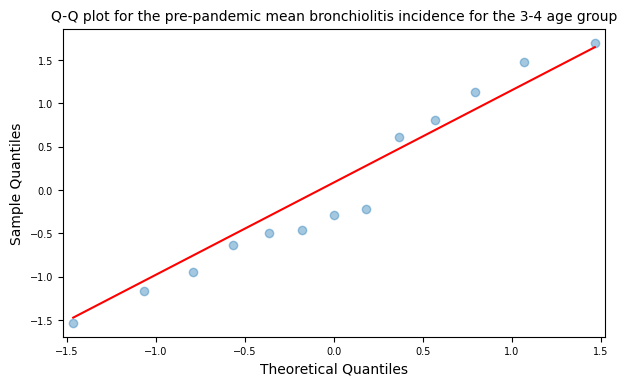

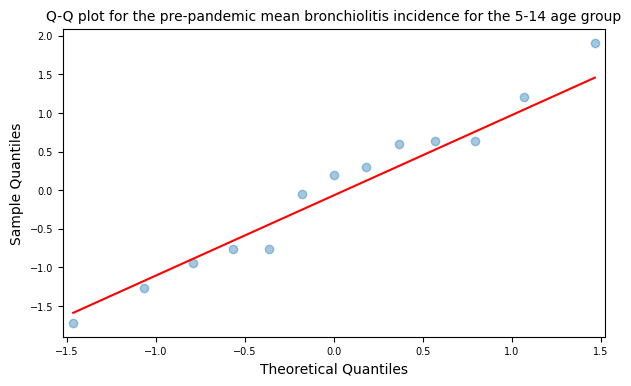

In [ ]:
# Test de normalitat (gràfic Q-Q)
import statsmodels.api as sm
fig1, ax1 = plt.subplots(figsize=(7,4))
sm.qqplot(promig_prepand_34,fit = True,line = 'q',alpha = 0.4,lw = 2,ax = ax1)
ax1.set_title('Q-Q plot for the pre-pandemic mean bronchiolitis incidence for the 3-4 age group', fontsize = 10)
ax1.tick_params(labelsize = 7)

fig2, ax2 = plt.subplots(figsize=(7,4))
sm.qqplot(promig_prepand_514,fit = True,line = 'q',alpha = 0.4,lw = 2,ax = ax2)
ax2.set_title('Q-Q plot for the pre-pandemic mean bronchiolitis incidence for the 5-14 age group', fontsize = 10)
ax2.tick_params(labelsize = 7)

In [ ]:
!pip install pingouin

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 3.3 MB/s eta 0:00:00


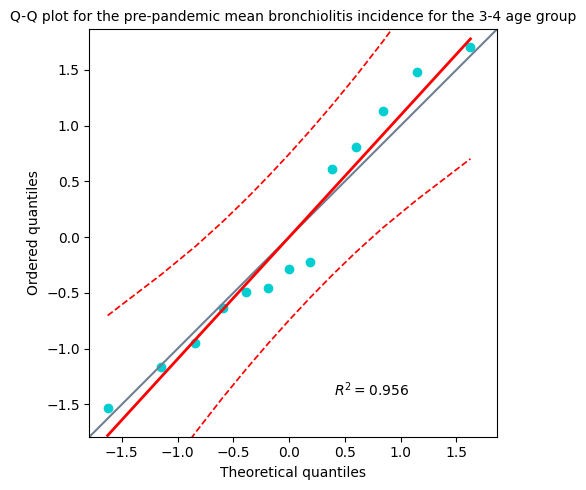

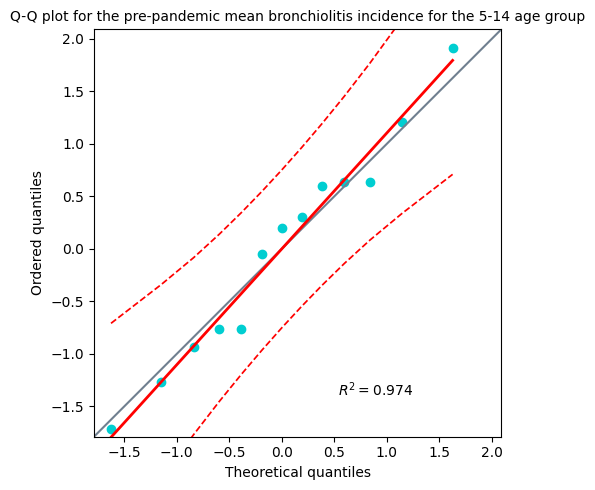

In [ ]:
import pingouin as pg

fig1, ax = plt.subplots(figsize=(7, 5))
pg.qqplot(promig_prepand_34, dist='norm', ax=ax, color='darkturquoise')
ax.set_title('Q-Q plot for the pre-pandemic mean bronchiolitis incidence for the 3-4 age group', fontsize = 10)
plt.tight_layout()
plt.show()

fig2, ax = plt.subplots(figsize=(7, 5))
pg.qqplot(promig_prepand_514, dist='norm', ax=ax, color='darkturquoise')
ax.set_title('Q-Q plot for the pre-pandemic mean bronchiolitis incidence for the 5-14 age group', fontsize = 10)
plt.tight_layout()
plt.show()


In [ ]:
# Test de igualtat de variànces (Bartlett)
bartlett_test = stats.bartlett(promig_prepand_34, promig_prepand_514)
bartlett_test

BartlettResult(statistic=50.434794259911, pvalue=1.2319061451651951e-12)

El conjunt de dades d'incidència de bronquiolitis per les franges d'edat 3-4 i 5-14 segueix una distribució aproximadament normal, però les variàncies de ambdós grups són significativament diferents. Tant el U-test de Mann-Whitney com el T-test requereixen variàncies iguals.

In [ ]:
# U-test (p-value y tamaño de efecto)
# ==============================================================================
pg.mwu(x=promig_prepand_34, y=promig_prepand_514, alternative='two-sided')

,U-val,alternative,p-val,RBC,CLES
MWU,169.0,two-sided,0.000016,-1.0,1.0


In [ ]:
# Test para datos independientes (p-value, intervalos de confianza)
# ==============================================================================
pg.ttest(x=promig_prepand_34, y=promig_prepand_514, alternative='two-sided', correction=False)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.765625,24,two-sided,7.795522e-10,"[5.72, 8.79]",3.830393,8.008e+06,1.0


Els dos tests recolzen la teoria de que sí que hi ha diferències significatives entre la mitjana prepandèmica per el grup d'edat 3-4 anys i per el grup d'edat 5-14 anys. Per tant, no podem ajuntar les dues franjes en un grup.

## Primera comparació: intra-franges d'edat

In [ ]:
# Recuperem dades:
# Temporades per franja 0a
temp12=pic_temporades[(pic_temporades['temporada']==2012)]
temp12_0a=temp12['incidencia_setmanal_0a']
# Mitjana prepand per franja 0a
prom_prepand_0a=pics_promig_prepand['incid_0a']

In [ ]:
# Arreglar dataframe per posar nom de columnes coincidents
pic_temporades_pre.columns=['Unnamed: 0','data','incid_0a','incid_1-2a','incid_3-4a','incid_5-14a','incid_total','temporada','setmana',]

In [ ]:
# Automatització
temporades=pic_temporades_pre['temporada'].unique()
# Diccionari dataframes
temporada_cohort={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=pic_temporades_pre[pic_temporades_pre['temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in pic_temporades_pre.columns:
    if columna.startswith('incid_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort[temporada]=dades_cohort


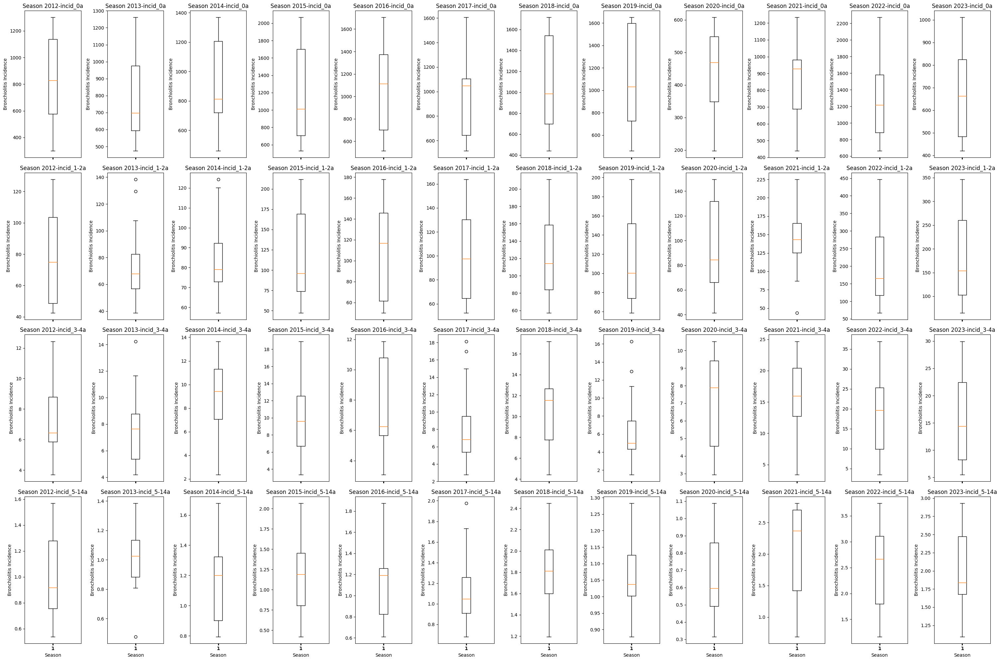

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para cada grupo de edad y temporada
fig, axs = plt.subplots(4, 12, figsize=(30, 20), sharex=True,)

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
            row = j
            col = i
            axs[row, col].boxplot(dades_cohort)
            axs[row, col].set_title(f'Season {temporada}-{cohort}')
            axs[row, col].set_ylabel('Bronchiolitis Incidence')
            if row == 3:
                axs[row, col].set_xlabel('Season')

plt.tight_layout()
plt.show()


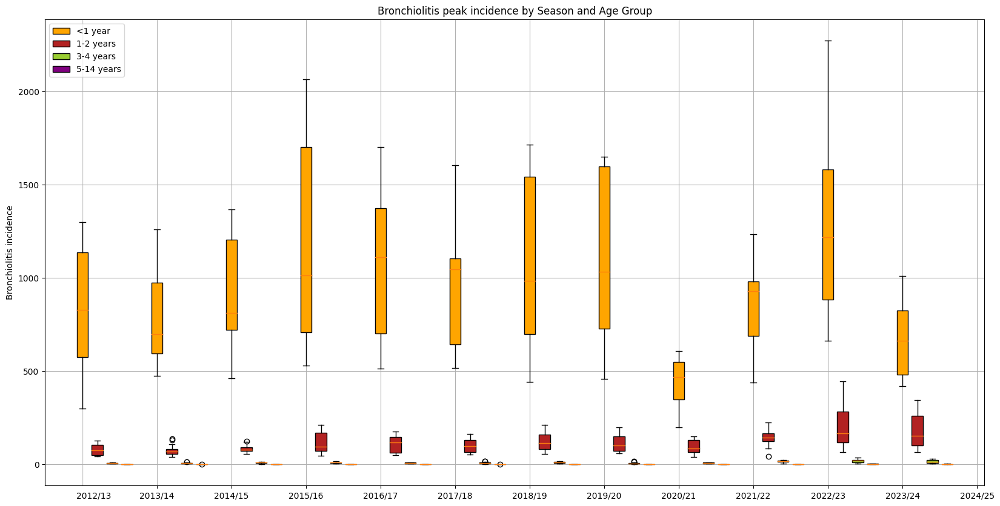

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
          box = ax.boxplot(dades_cohort, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada-1998}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Bronchiolitis incidence')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Bronchiolitis peak incidence by Season and Age Group')

# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2012/13'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -180.5))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')

plt.grid(True)
plt.show()


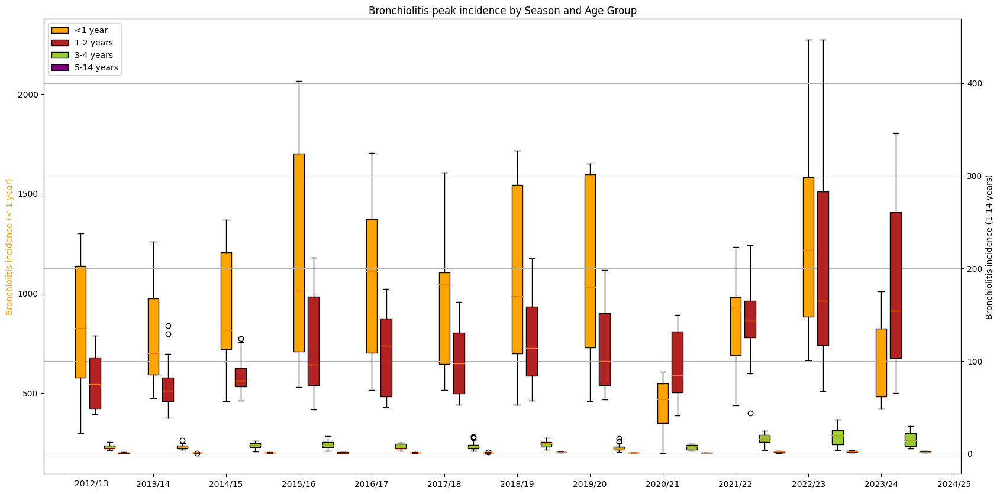

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas (dos ejes)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors = ['orange', 'firebrick', 'yellowgreen', 'purple']
legend_labels = []

# Crear un segundo eje y
ax2 = ax1.twinx()

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
            # Determinar en qué eje dibujar la serie
            if cohort == 'incid_0a':
                box = ax1.boxplot(dades_cohort, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
            else:
                box = ax2.boxplot(dades_cohort, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
            labels.append(f'{temporada}-{cohort}')
            legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax1.set_title('Bronchiolitis peak incidence by Season and Age Group')
ax1.set_xticks(range(1, len(temporada_cohort) + 1))
ax1.set_xticklabels([f'{temporada+1}/{temporada-1998}' for temporada in temporada_cohort.keys()])
ax1.set_ylabel('Bronchiolitis incidence (< 1 year)', color='orange')
ax2.set_ylabel('Bronchiolitis incidence (1-14 years)', color='black')

# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2012/13'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -35))
#plt.axvline(x=posicion, color='#CCCCCC', linewidth=1, zorder=0)

legend_labels_txt = ['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax1.legend(legend_labels, legend_labels_txt, loc='upper left')

plt.grid(True)
plt.show()


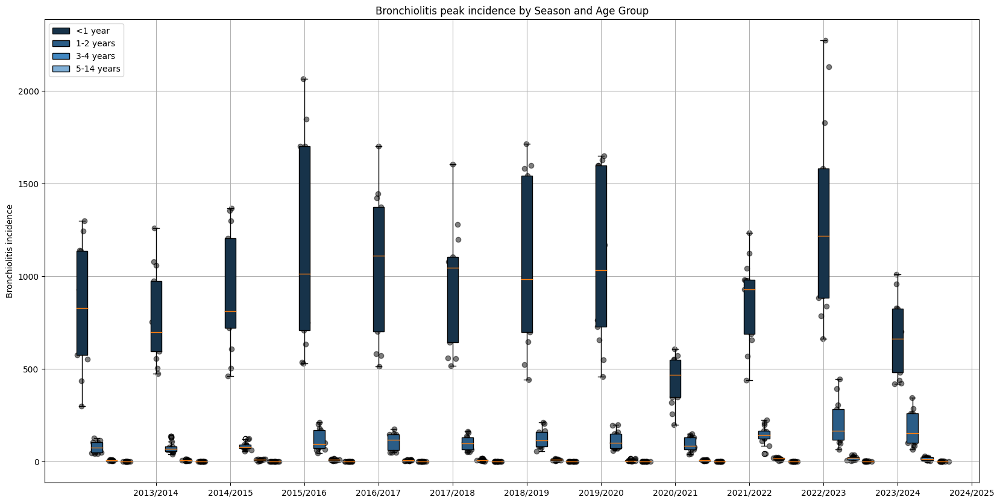

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Crear el diagrama de cajas y scatterplots para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#17334a','#2b5d87','#4288c2','#80afd6']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
          box = ax.boxplot(dades_cohort, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda
          # Agregar scatterplot
          scatter_x = np.random.normal(i + (j * 0.2), 0.03, size=len(dades_cohort))  # Añadir un poco de ruido a la posición x
          ax.scatter(scatter_x, dades_cohort, color='black', alpha=0.5, label=None)

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Bronchiolitis incidence')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Bronchiolitis peak incidence by Season and Age Group')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')

plt.grid(True)
plt.show()

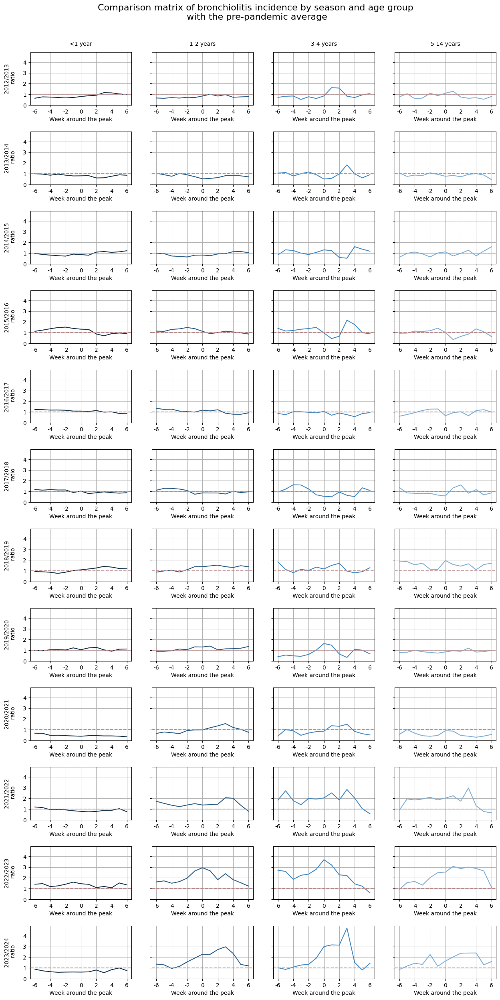

In [ ]:
# Matriu plots
num_files=len(temporada_cohort)
num_columnes=len(next(iter(temporada_cohort.values())))-1
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,30),sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16,y=0.92)
colors=['#17334a','#2b5d87','#4288c2','#80afd6']
etiquetes=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    if (cohort) != ('incid_total'):
      cohort_promig_prepand=pics_promig_prepand[cohort]
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_promig_prepand.index=range(1,len(cohort_promig_prepand)+1)

      ratio_temp_coh=dades_cohort.div(cohort_promig_prepand.squeeze(),axis=0)

      axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
      axs[i,j].set_xlabel('Week around the peak')
      axs[i,j].grid(True)
      axs[i,j].set_xticks([1,3,5,7,9,11,13])
      axs[i,j].set_xticklabels(etiquetes)
      axs[i,j].set_yticks([0,1,2,3,4])
      axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')


# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

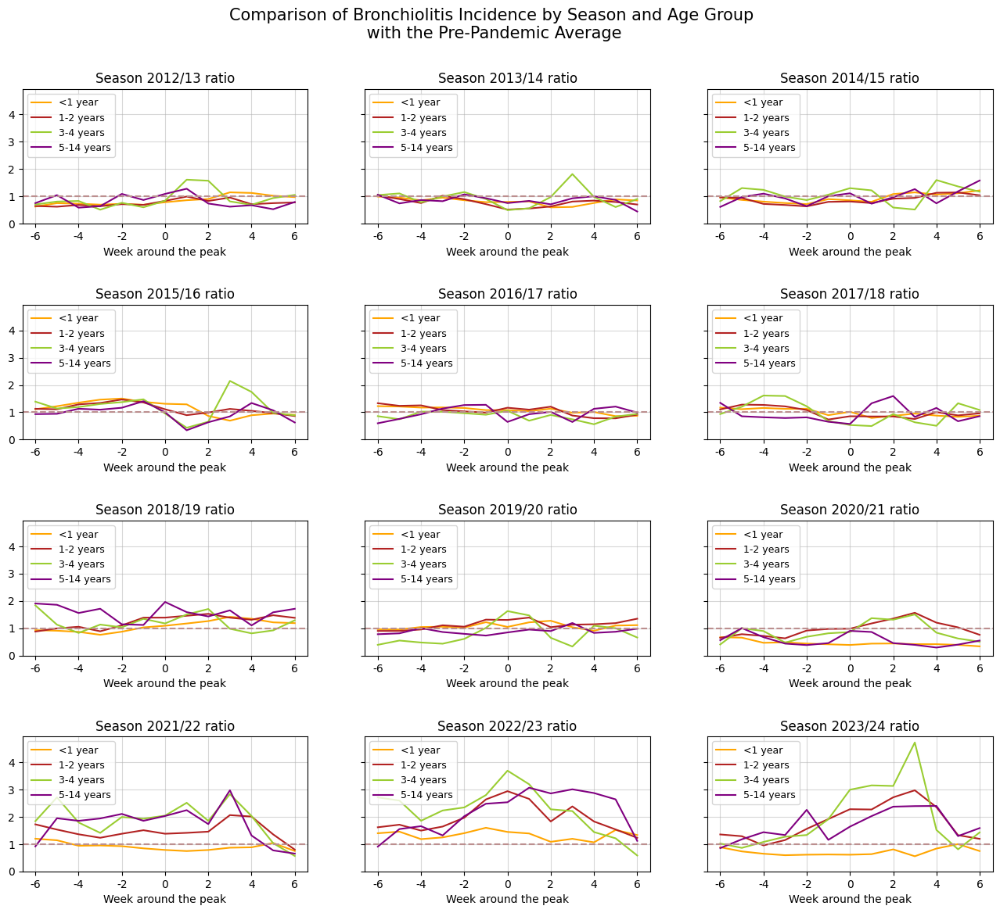

In [ ]:
# Matriu plots (1 per cada temporada)
num_files=len(temporada_cohort)
num_columnes=-(-num_files // 4)
fig,axs=plt.subplots(4,3,figsize=(16,13),gridspec_kw={'height_ratios':[3.5]*4,'width_ratios':[3.5]*3},sharey=True)
fig.suptitle('Comparison of Bronchiolitis Incidence by Season and Age Group\n with the Pre-Pandemic Average', fontsize=15,y=0.96)
cohort_colors={'incid_0a': 'orange','incid_1-2a':'firebrick','incid_3-4a':'yellowgreen','incid_5-14a':'purple'}
etiquetas=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  fila=i//3
  columna=i%3
  handles = []  # Lista para guardar los handles de las líneas
  for cohort,dades_cohort in dades_temp.items():
    if (cohort) != ('incid_total'):
      cohort_promig_prepand=pics_promig_prepand[cohort]
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_promig_prepand.index=range(1,len(cohort_promig_prepand)+1)

      ratio_temp_coh=dades_cohort.div(cohort_promig_prepand.squeeze(),axis=0)

      # Guardar el handle de la línea y la etiqueta para cada cohort
      handle, = axs[fila,columna].plot(ratio_temp_coh, label=f'{cohort}',color=cohort_colors[cohort])
      handles.append(handle)
  axs[fila,columna].set_xlabel('Week around the peak')
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].set_xticklabels(etiquetas, fontsize=10)
  axs[fila,columna].set_yticks([0,1,2,3,4])
  # Utilizar legend() para personalizar las etiquetas de la leyenda
  axs[fila,columna].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years','5-14 years'], loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=12)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')

plt.subplots_adjust(hspace=0.6)
plt.show()


Veure barres d'error a les últimes temporades

In [ ]:
temp_interes={key: temporada_cohort[key] for key in [2021,2022,2023]}

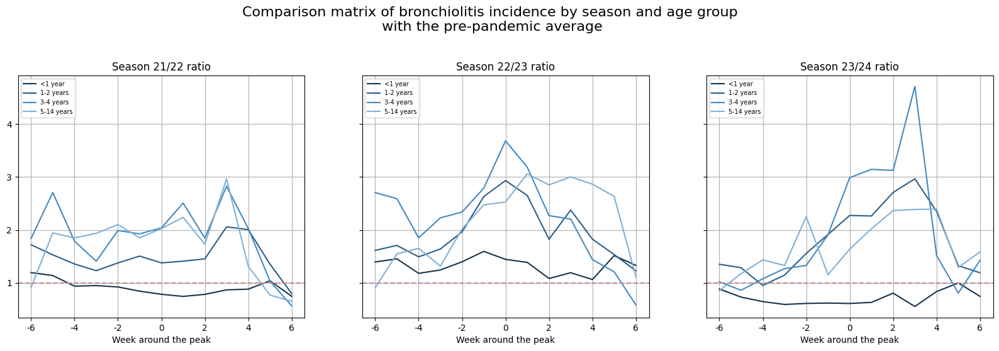

In [ ]:
# Matriu plots (1 per cada temporada)
fig,axs=plt.subplots(1,3,figsize=(20,5),sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16,y=1.1)
cohort_colors={'incid_0a': '#17334a','incid_1-2a':'#2b5d87','incid_3-4a':'#4288c2','incid_5-14a':'#80afd6'}
etiquetas=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temp_interes.items()):
  handles = []  # Lista para guardar los handles de las líneas
  for cohort,dades_cohort in dades_temp.items():
    if (cohort) != ('incid_total'):
      cohort_promig_prepand=pics_promig_prepand[cohort]
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_promig_prepand.index=range(1,len(cohort_promig_prepand)+1)

      ratio_temp_coh=dades_cohort.div(cohort_promig_prepand.squeeze(),axis=0)

      # Guardar el handle de la línea i la etiqueta para cada cohort
      handle, = axs[i].plot(ratio_temp_coh, label=f'{cohort}',color=cohort_colors[cohort])
      handles.append(handle)
  axs[i].set_xlabel('Week around the peak')
  axs[i].grid(True)
  axs[i].set_xticks([1,3,5,7,9,11,13])
  axs[i].set_xticklabels(etiquetas)
  #axs[i].set_yticks([0,1,2,3,4])
  axs[i].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years','5-14 years'], loc='upper left',fontsize='x-small')
  axs[i].set_title(f'Season {temporada-2000}/{temporada-1999} ratio')
  axs[i].axhline(y=1,color='rosybrown',linestyle='--')

plt.show()


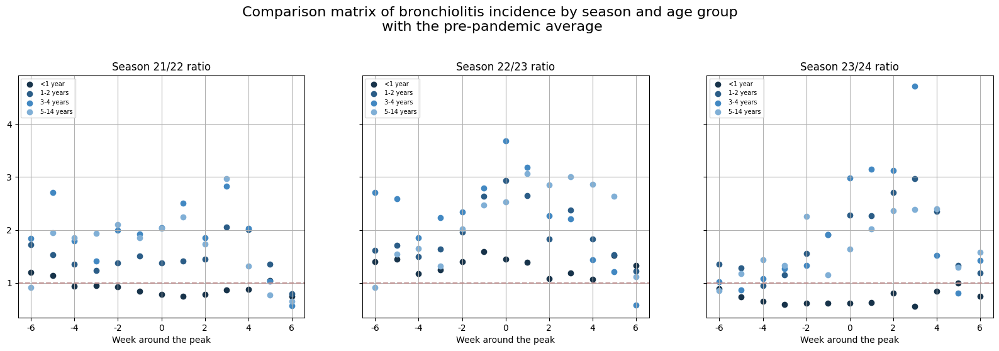

In [ ]:
# Matriu plots (1 per cada temporada)
fig, axs = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16, y=1.1)
cohort_colors = {'incid_0a': '#17334a', 'incid_1-2a': '#2b5d87', 'incid_3-4a': '#4288c2', 'incid_5-14a': '#80afd6'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temp_interes.items()):
    handles = []  # Lista para guardar los handles de los puntos
    for cohort, dades_cohort in dades_temp.items():
        if (cohort) != ('incid_total'):
            cohort_promig_prepand = pics_promig_prepand[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prepand.index = range(1, len(cohort_promig_prepand) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prepand.squeeze(), axis=0)

            # Guardar el handle del punto y la etiqueta para cada cohort
            handle = axs[i].scatter(ratio_temp_coh.index, ratio_temp_coh, label=f'{cohort}', color=cohort_colors[cohort], marker='o')
            handles.append(handle)
    axs[i].set_xlabel('Week around the peak')
    axs[i].grid(True)
    axs[i].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[i].set_xticklabels(etiquetas)
    axs[i].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years', '5-14 years'], loc='upper left', fontsize='x-small')
    axs[i].set_title(f'Season {temporada - 2000}/{temporada - 1999} ratio')
    axs[i].axhline(y=1, color='rosybrown', linestyle='--')

plt.show()


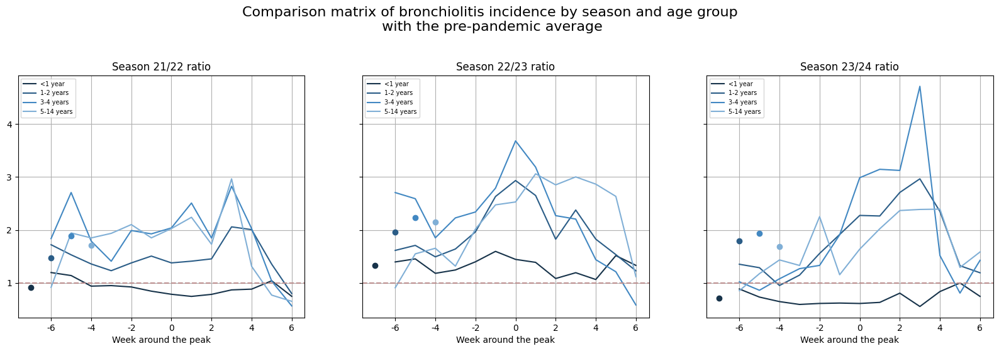

In [ ]:
# Matriu plots (1 per cada temporada)
fig, axs = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16, y=1.1)
cohort_colors = {'incid_0a': '#17334a', 'incid_1-2a': '#2b5d87', 'incid_3-4a': '#4288c2', 'incid_5-14a': '#80afd6'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temp_interes.items()):
    handles = []  # Lista para guardar los handles de las líneas
    for cohort, dades_cohort in dades_temp.items():
        if (cohort) != ('incid_total'):
            cohort_promig_prepand = pics_promig_prepand[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prepand.index = range(1, len(cohort_promig_prepand) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prepand.squeeze(), axis=0)

            # Guardar el handle de la línea i la etiqueta para cada cohort
            handle, = axs[i].plot(ratio_temp_coh, label=f'{cohort}', color=cohort_colors[cohort])
            handles.append(handle)

            # Calcular la media de la serie
            media_serie = ratio_temp_coh.mean()

            # Mostrar la media como un punto centrado en el eje x
            axs[i].scatter(media_serie.index, media_serie, color=cohort_colors[cohort], marker='o', label=f'Media {cohort}', zorder=5)

    axs[i].set_xlabel('Week around the peak')
    axs[i].grid(True)
    axs[i].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[i].set_xticklabels(etiquetas)
    axs[i].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years', '5-14 years'], loc='upper left', fontsize='x-small')
    axs[i].set_title(f'Season {temporada - 2000}/{temporada - 1999} ratio')
    axs[i].axhline(y=1, color='rosybrown', linestyle='--')

plt.show()


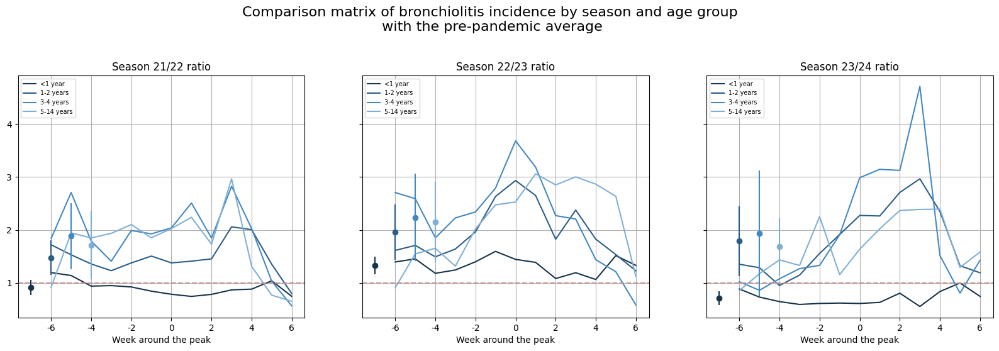

In [ ]:
# Matriu plots (1 per cada temporada)
fig, axs = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16, y=1.1)
cohort_colors = {'incid_0a': '#17334a', 'incid_1-2a': '#2b5d87', 'incid_3-4a': '#4288c2', 'incid_5-14a': '#80afd6'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temp_interes.items()):
    handles = []  # Lista para guardar los handles de las líneas
    for cohort, dades_cohort in dades_temp.items():
        if (cohort) != ('incid_total'):
            cohort_promig_prepand = pics_promig_prepand[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prepand.index = range(1, len(cohort_promig_prepand) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prepand.squeeze(), axis=0)

            # Guardar el handle de la línea i la etiqueta para cada cohort
            handle, = axs[i].plot(ratio_temp_coh, label=f'{cohort}', color=cohort_colors[cohort])
            handles.append(handle)

            # Calcular la media de la serie
            media_serie = ratio_temp_coh.mean()
            error_serie = ratio_temp_coh.std()  # Desviación estándar como error

            # Mostrar la media como un punto centrado en el eje x con barras de error
            axs[i].errorbar(media_serie.index, media_serie, yerr=error_serie, fmt='o', color=cohort_colors[cohort], label=f'Media {cohort}', zorder=5)

    axs[i].set_xlabel('Week around the peak')
    axs[i].grid(True)
    axs[i].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[i].set_xticklabels(etiquetas)
    axs[i].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years', '5-14 years'], loc='upper left', fontsize='x-small')
    axs[i].set_title(f'Season {temporada - 2000}/{temporada - 1999} ratio')
    axs[i].axhline(y=1, color='rosybrown', linestyle='--')

plt.show()


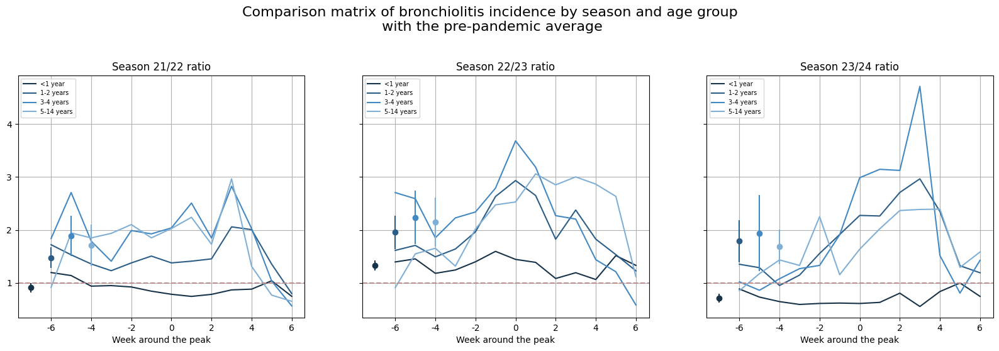

In [ ]:
from scipy.stats import sem, t

# Matriu plots (1 per cada temporada)
fig, axs = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle('Comparison matrix of bronchiolitis incidence by season and age group\n with the pre-pandemic average', fontsize=16, y=1.1)
cohort_colors = {'incid_0a': '#17334a', 'incid_1-2a': '#2b5d87', 'incid_3-4a': '#4288c2', 'incid_5-14a': '#80afd6'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temp_interes.items()):
    handles = []  # Lista para guardar los handles de las líneas
    for cohort, dades_cohort in dades_temp.items():
        if (cohort) != ('incid_total'):
            cohort_promig_prepand = pics_promig_prepand[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prepand.index = range(1, len(cohort_promig_prepand) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prepand.squeeze(), axis=0)

            # Guardar el handle de la línea i la etiqueta para cada cohort
            handle, = axs[i].plot(ratio_temp_coh, label=f'{cohort}', color=cohort_colors[cohort])
            handles.append(handle)

            # Calcular la media de la serie
            media_serie = ratio_temp_coh.mean()
            sem_serie = sem(ratio_temp_coh)  # Calcular el error estándar de la media
            confidence_interval = sem_serie * t.ppf(0.975, len(ratio_temp_coh) - 1)  # Obtener el intervalo de confianza al 95%

            # Mostrar la media como un punto centrado en el eje x con intervalo de confianza
            axs[i].errorbar(media_serie.index, media_serie, yerr=confidence_interval, fmt='o', color=cohort_colors[cohort], label=f'Media {cohort}', zorder=5)

    axs[i].set_xlabel('Week around the peak')
    axs[i].grid(True)
    axs[i].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[i].set_xticklabels(etiquetas)
    axs[i].legend(handles=handles, labels=['<1 year', '1-2 years', '3-4 years', '5-14 years'], loc='upper left', fontsize='x-small')
    axs[i].set_title(f'Season {temporada - 2000}/{temporada - 1999} ratio')
    axs[i].axhline(y=1, color='rosybrown', linestyle='--')

plt.show()


### Càlcul intervals de confiança

In [ ]:
pic_temporades

,Unnamed: 0,data,casos_setmanals_0a,incidencia_setmanal_0a,casos_setmanals_1-2a,incidencia_setmanal_1-2a,casos_setmanals_3-4a,incidencia_setmanal_3-4a,casos_setmanals_5-14a,incidencia_setmanal_5-14a,f0,f12,f34,f514,incidencia_total,temporada,setmana
0,9,2012-11-08,218.285714,300.238934,72.428571,42.573988,9.285714,5.148690,7.714286,0.973781,0.72704,1.70124,1.80351,7.92199,25.318402,2012,1
1,10,2012-11-15,318.000000,437.389965,87.142857,51.223141,11.571429,6.416060,9.000000,1.136078,0.72704,1.70124,1.80351,7.92199,35.027315,2012,2
2,11,2012-11-22,401.000000,551.551496,127.285714,74.819375,15.857143,8.792379,6.000000,0.757385,0.72704,1.70124,1.80351,7.92199,45.265165,2012,3
3,12,2012-11-29,499.285714,686.737613,147.571429,86.743451,10.571429,5.861586,7.000000,0.883616,0.72704,1.70124,1.80351,7.92199,54.668471,2012,4
4,13,2012-12-06,601.571429,827.425490,176.571429,103.789841,17.000000,9.426064,11.142857,1.406573,0.72704,1.70124,1.80351,7.92199,66.340325,2012,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,589,2023-12-21,510.714286,1010.555000,310.000000,262.003567,30.285714,22.439514,23.714286,2.930171,0.50538,1.18319,1.34966,8.09314,78.581009,2023,9
152,590,2023-12-28,315.571429,624.424054,244.142857,206.342901,28.714286,21.275199,18.285714,2.259409,0.50538,1.18319,1.34966,8.09314,54.504907,2023,10
153,591,2024-01-04,355.142857,702.724400,178.285714,150.682236,11.142857,8.256048,21.000000,2.594790,0.50538,1.18319,1.34966,8.09314,50.808789,2023,11
154,592,2024-01-11,334.714286,662.302200,100.571429,85.000235,7.428571,5.504032,10.571429,1.306221,0.50538,1.18319,1.34966,8.09314,40.721467,2023,12


In [ ]:
# Recueprem base de dades
pic_temporades_ic=pic_temporades.copy()
pic_temporades_ic.drop('Unnamed: 0',axis=1,inplace=True)
pic_temporades_ic.drop('f0',axis=1,inplace=True)
pic_temporades_ic.drop('f12',axis=1,inplace=True)
pic_temporades_ic.drop('f34',axis=1,inplace=True)
pic_temporades_ic.drop('f514',axis=1,inplace=True)
pic_temporades_ic.drop('incidencia_total',axis=1,inplace=True)


In [ ]:
# Calculem població
pic_temporades_ic['pobl_0']=pic_temporades_ic['casos_setmanals_0a']/pic_temporades_ic['incidencia_setmanal_0a']*100000
pic_temporades_ic['pobl_12']=pic_temporades_ic['casos_setmanals_1-2a']/pic_temporades_ic['incidencia_setmanal_1-2a']*100000
pic_temporades_ic['pobl_34']=pic_temporades_ic['casos_setmanals_3-4a']/pic_temporades_ic['incidencia_setmanal_3-4a']*100000
pic_temporades_ic['pobl_514']=pic_temporades_ic['casos_setmanals_5-14a']/pic_temporades_ic['incidencia_setmanal_5-14a']*100000


In [ ]:
# Filtre prepandèmia
pic_temporades_prepand_ic=pic_temporades_ic[(pic_temporades_ic['temporada']<=2019)]
pic_temporades_prepand_ic

,data,casos_setmanals_0a,incidencia_setmanal_0a,casos_setmanals_1-2a,incidencia_setmanal_1-2a,casos_setmanals_3-4a,incidencia_setmanal_3-4a,casos_setmanals_5-14a,incidencia_setmanal_5-14a,temporada,setmana,pobl_0,pobl_12,pobl_34,pobl_514
0,2012-11-08,218.285714,300.238934,72.428571,42.573988,9.285714,5.148690,7.714286,0.973781,2012,1,72704.0,170124.0,180351.0,792199.0
1,2012-11-15,318.000000,437.389965,87.142857,51.223141,11.571429,6.416060,9.000000,1.136078,2012,2,72704.0,170124.0,180351.0,792199.0
2,2012-11-22,401.000000,551.551496,127.285714,74.819375,15.857143,8.792379,6.000000,0.757385,2012,3,72704.0,170124.0,180351.0,792199.0
3,2012-11-29,499.285714,686.737613,147.571429,86.743451,10.571429,5.861586,7.000000,0.883616,2012,4,72704.0,170124.0,180351.0,792199.0
4,2012-12-06,601.571429,827.425490,176.571429,103.789841,17.000000,9.426064,11.142857,1.406573,2012,5,72704.0,170124.0,180351.0,792199.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,2020-01-09,887.142857,1597.218114,131.714286,100.254442,6.714286,4.652908,9.000000,1.107955,2019,9,55543.0,131380.0,144303.0,812307.0
100,2020-01-16,649.000000,1168.464073,103.142857,78.507274,2.142857,1.484971,9.142857,1.125542,2019,10,55543.0,131380.0,144303.0,812307.0
101,2020-01-23,423.857143,763.115321,96.285714,73.287954,8.571429,5.939882,7.285714,0.896916,2019,11,55543.0,131380.0,144303.0,812307.0
102,2020-01-30,404.142857,727.621585,100.000000,76.115086,9.857143,6.830865,7.142857,0.879330,2019,12,55543.0,131380.0,144303.0,812307.0


In [ ]:
# Població per any al pic
pobl_prepand_ic=pic_temporades_prepand_ic.groupby('temporada',as_index=True)[['pobl_0','pobl_12','pobl_34','pobl_514']].mean().round().astype(int)
pobl_prepand_ic=pobl_prepand_ic.rename_axis(None)
print(pobl_prepand_ic)

      pobl_0  pobl_12  pobl_34  pobl_514
2012   71712   168376   179416    793037
2013   66680   160695   173582    802788
2014   64153   153237   167825    808958
2015   62692   144026   160469    812552
2016   61619   141728   154488    816265
2017   60836   141226   147357    817105
2018   58531   138844   144890    815749
2019   56419   134987   145070    812668


In [ ]:
# Població mitjana prepandèmica
pobl_prom_prepand_ic=pd.DataFrame(pobl_prepand_ic.mean().round().astype(int)).T
pobl_prom_prepand_ic

,pobl_0,pobl_12,pobl_34,pobl_514
0,62830,147890,159137,809890


In [ ]:
# Casos totals per any al pic
casos_prepand_ic=pic_temporades_prepand_ic.groupby('temporada',as_index=True)[['casos_setmanals_0a','casos_setmanals_1-2a','casos_setmanals_3-4a','casos_setmanals_5-14a']].sum().round()
casos_prepand_ic.index=casos_prepand_ic.index.astype(str)
casos_prepand_ic

,casos_setmanals_0a,casos_setmanals_1-2a,casos_setmanals_3-4a,casos_setmanals_5-14a
temporada,,,,
2012,7708.0,1673.0,172.0,103.0
2013,6778.0,1627.0,177.0,107.0
2014,7561.0,1684.0,201.0,123.0
2015,9288.0,2207.0,212.0,123.0
2016,8398.0,1984.0,153.0,123.0
2017,7495.0,1816.0,166.0,120.0
2018,8069.0,2244.0,191.0,197.0
2019,7772.0,2025.0,128.0,111.0


In [ ]:
# Casos mitjans prepandèmics
casos_prom_prepand_ic=pd.DataFrame(casos_prepand_ic.mean().round().astype(int)).T
casos_prom_prepand_ic

,casos_setmanals_0a,casos_setmanals_1-2a,casos_setmanals_3-4a,casos_setmanals_5-14a
0,7884,1908,175,126


In [ ]:
rr_prepand_df=casos_prom_prepand_ic.merge(pobl_prom_prepand_ic, left_index = True, right_index = True)
rr_prepand_df

,casos_setmanals_0a,casos_setmanals_1-2a,casos_setmanals_3-4a,casos_setmanals_5-14a,pobl_0,pobl_12,pobl_34,pobl_514
0,7884,1908,175,126,62830,147890,159137,809890


In [ ]:
risk_ratio_df.index=risk_ratio_df.index.astype(str)
risk_ratio_df

,Casos_0,Casos_1-2,Casos_3-4,Casos_5-14,pobl_0,pobl_12,pobl_34,pobl_514
Season,,,,,,,,
2012,7708.428571,1672.714286,172.285714,102.571429,70796,166722,178526,793841
2013,6777.857143,1626.571429,177.285714,106.857143,66153,159942,172880,804196
2014,7561.000000,1684.285714,201.142857,122.714286,64078,150530,166073,808860
2015,9288.428571,2206.714286,211.857143,123.000000,62416,143395,159759,813370
2016,8397.714286,1983.714286,153.142857,123.428571,61643,141910,151903,816635
2017,7494.714286,1815.714286,166.142857,120.285714,60107,140420,145992,817142
2018,8068.857143,2243.857143,191.142857,196.714286,57800,138161,145229,814359
2019,7771.714286,2024.571429,127.714286,110.857143,56047,133489,144872,812526
2020,2784.428571,1568.285714,129.285714,71.428571,51923,127233,142261,813534


In [ ]:
from tabulate import tabulate
import math
import scipy.stats as st

exposed_cases1=risk_ratio_df['Casos_0']
exposed_total1=risk_ratio_df['pobl_0']

exposed_cases2 = risk_ratio_df['Casos_1-2']
exposed_total2 = risk_ratio_df['pobl_12']

exposed_cases3 = risk_ratio_df['Casos_3-4']
exposed_total3 = risk_ratio_df['pobl_34']

exposed_cases4 = risk_ratio_df['Casos_5-14']
exposed_total4 = risk_ratio_df['pobl_514']

control_cases1 = rr_prepand_df['casos_setmanals_0a']
control_total1 = rr_prepand_df['pobl_0']

control_cases2 = rr_prepand_df['casos_setmanals_1-2a']
control_total2 = rr_prepand_df['pobl_12']

control_cases3 = rr_prepand_df['casos_setmanals_3-4a']
control_total3 = rr_prepand_df['pobl_34']

control_cases4 = rr_prepand_df['casos_setmanals_5-14a']
control_total4 = rr_prepand_df['pobl_514']

RR_vec1 = []; CI_vec1_low = []; CI_vec1_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases1.iloc[i].round().astype(int), exposed_total1.iloc[i].round().astype(int), control_cases1.iloc[0].round().astype(int), control_total1.iloc[0].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec1.append(RR); CI_vec1_low.append(CI.low); CI_vec1_high.append(CI.high)

RR_vec2 = []; CI_vec2_low = []; CI_vec2_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases2.iloc[i].round().astype(int), exposed_total2.iloc[i].round().astype(int), control_cases2.iloc[0].round().astype(int), control_total2.iloc[0].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec2.append(RR); CI_vec2_low.append(CI.low); CI_vec2_high.append(CI.high)

RR_vec3 = []; CI_vec3_low = []; CI_vec3_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases3.iloc[i].round().astype(int), exposed_total3.iloc[i].round().astype(int), control_cases3.iloc[0].round().astype(int), control_total3.iloc[0].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec3.append(RR); CI_vec3_low.append(CI.low); CI_vec3_high.append(CI.high)

RR_vec4 = []; CI_vec4_low = []; CI_vec4_high = [];
for i in range(len(risk_ratio_df)):
    rel_risk = st.contingency.relative_risk(exposed_cases4.iloc[i].round().astype(int), exposed_total4.iloc[i].round().astype(int), control_cases4.iloc[0].round().astype(int), control_total4.iloc[0].round().astype(int))
    RR = rel_risk.relative_risk
    CI = rel_risk.confidence_interval(confidence_level=0.95)

    RR_vec4.append(RR); CI_vec4_low.append(CI.low); CI_vec4_high.append(CI.high)


In [ ]:
# Create DataFrame for the first set of data (RR_vec1 and CI_vec1)
df1 = pd.DataFrame({'RR_0': RR_vec1, 'CI_0_low': CI_vec1_low, 'CI_0_high': CI_vec1_high}, index = risk_ratio_df.index)

# Create DataFrame for the second set of data (RR_vec2 and CI_vec2)
df2 = pd.DataFrame({'RR_1': RR_vec2, 'CI_1_low': CI_vec2_low, 'CI_1_high': CI_vec2_high}, index = risk_ratio_df.index)

# Create DataFrame for the third set of data (RR_vec3 and CI_vec3)
df3 = pd.DataFrame({'RR_2': RR_vec3, 'CI_2_low': CI_vec3_low, 'CI_2_high': CI_vec3_high}, index = risk_ratio_df.index)

# Create DataFrame for the fourth set of data (RR_vec4 and CI_vec4)
df4 = pd.DataFrame({'RR_3': RR_vec4, 'CI_3_low': CI_vec4_low, 'CI_3_high': CI_vec4_high}, index = risk_ratio_df.index)

# Concatenate the two DataFrames along axis 1 (columns)
result_combined = pd.concat([df1, df2, df3, df4], axis=1)

data_plot_RR = result_combined.T
data_plot_RR

Season,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
RR_0,0.867668,0.816531,0.940353,1.185896,1.085707,0.993727,1.112532,1.105098,0.427297,0.876967,1.339413,0.689260
CI_0_low,0.842446,0.791943,0.912956,1.153272,1.055035,0.964767,1.080830,1.073311,0.409879,0.849096,1.302006,0.665516
CI_0_high,0.893645,0.841881,0.968571,1.219443,1.117270,1.023556,1.145163,1.137827,0.445455,0.905753,1.377896,0.713852
RR_1,0.777792,0.788471,0.867121,1.192968,1.083650,1.002414,1.258919,1.175818,0.955227,1.511438,2.077969,1.811345
CI_1_low,0.728645,0.738289,0.812438,1.122555,1.018074,0.940422,1.184903,1.105028,0.893873,1.423560,1.964277,1.709567
CI_1_high,0.830254,0.842063,0.925483,1.267798,1.153450,1.068494,1.337559,1.251143,1.020793,1.604741,2.198242,1.919181
RR_2,0.876113,0.931026,1.100602,1.206712,0.915921,1.033980,1.195950,0.803450,0.824588,1.923030,2.331228,1.825904
CI_2_low,0.709928,0.755562,0.898826,0.987915,0.737388,0.836260,0.974306,0.639747,0.656915,1.594293,1.943972,1.510053
CI_2_high,1.081200,1.147237,1.347674,1.473967,1.137681,1.278448,1.468016,1.009042,1.035059,2.319550,2.795630,2.207821
RR_3,0.833987,0.855219,0.977434,0.972014,0.968128,0.943929,1.554912,0.878094,0.560968,1.719844,2.128498,1.659911


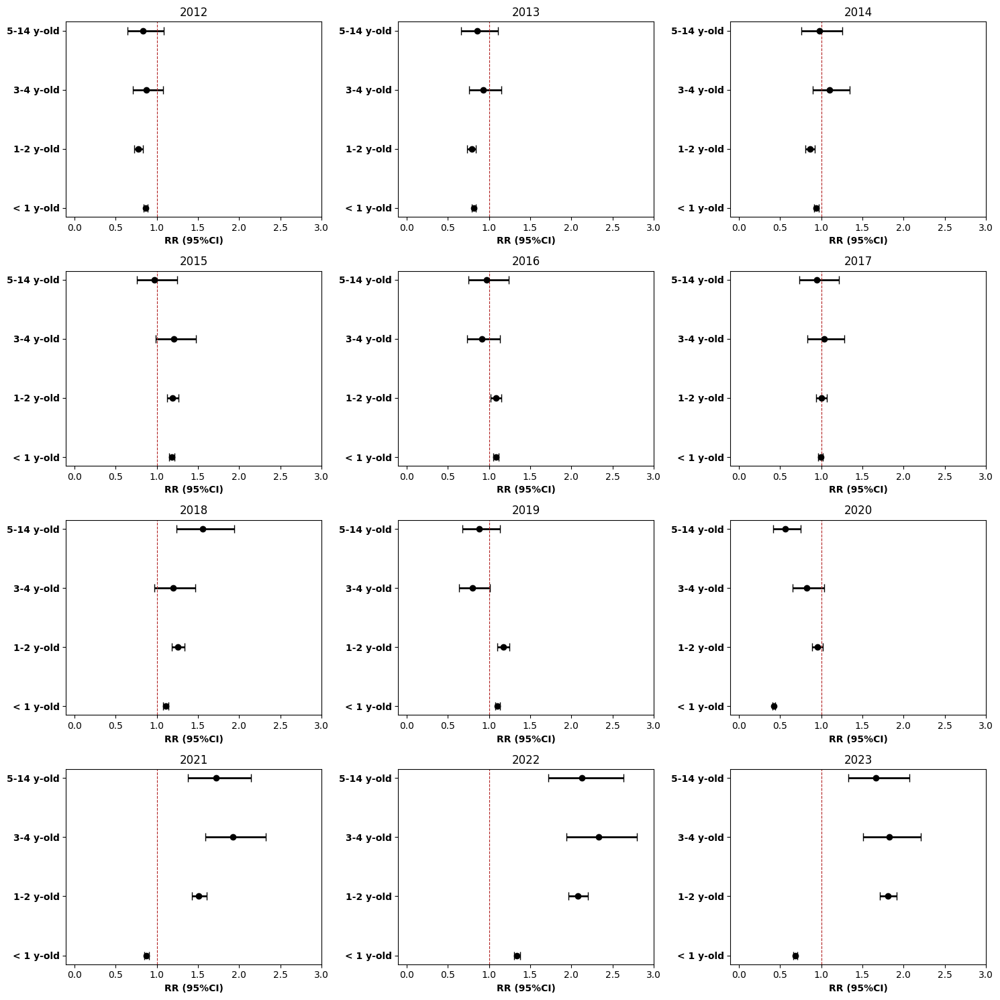

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
  row=i//3
  column=i%3
  ax[row,column].errorbar(x=data_plot_RR.iloc[[0, 3, 6, 9]][col], y=['< 1 y-old','1-2 y-old', '3-4 y-old','5-14 y-old'],
                   xerr=[list(data_plot_RR.iloc[[0, 3, 6, 9]][col].values - data_plot_RR.iloc[[1, 4, 7, 10]][col].values), list(data_plot_RR.iloc[[2, 5, 8, 11]][col].values- data_plot_RR.iloc[[0, 3, 6, 9]][col].values )],
                   color='black', capsize=4, linestyle='None', linewidth=2,
                   marker="o", markersize=6, mfc="black", mec="black")
  #ax[row,column].scatter(x=1, y=['1-2 y-old'], color='firebrick')
  ax[row,column].axvline(x=1, linewidth=0.8, linestyle='--', color='firebrick')
  ax[row,column].tick_params(axis='both', which='major', labelsize=10)
  ax[row,column].set_xlabel('RR (95%CI)', fontsize=10, weight='bold')
  ax[row,column].set_xlim((-0.1, 3))
  ax[row,column].set_title(col)  # Set title font

  # Set y-axis labels to bold
  for tick in ax[row,column].get_yticklabels():
    tick.set_fontweight('bold')

plt.tight_layout()
plt.show()

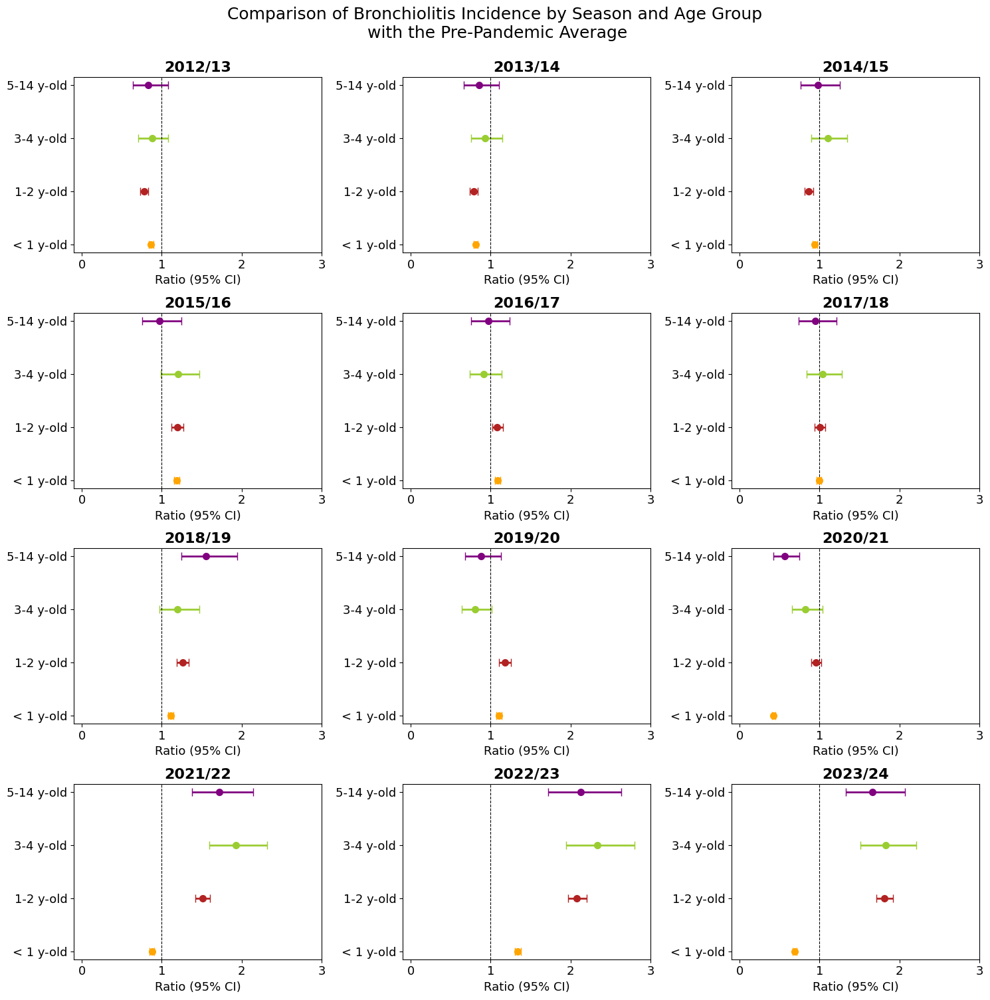

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Crear la matriz de subplots 4x3
fig, ax = plt.subplots(4, 3, figsize=(15, 15))
fig.suptitle('Comparison of Bronchiolitis Incidence by Season and Age Group\n with the Pre-Pandemic Average', fontsize=18, y=1)

# Colores para las barras de error
colors = ['orange', 'firebrick', 'yellowgreen', 'purple']

# Lista de títulos en formato 'YYYY/YY'
titles = [f'{year}/{str(year + 1)[-2:]}' for year in range(2012, 2024)]

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
    row = i // 3  # Modificado para acomodar 3x4 subplots
    column = i % 3  # Modificado para acomodar 3x4 subplots

    for j, y_label in enumerate(['< 1 y-old', '1-2 y-old', '3-4 y-old', '5-14 y-old']):
        x_value = data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j]
        x_err_low = data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j] - data_plot_RR.iloc[[1, 4, 7, 10]][col].values[j]
        x_err_high = data_plot_RR.iloc[[2, 5, 8, 11]][col].values[j] - data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j]

        ax[row, column].errorbar(
            x=x_value, y=y_label,
            xerr=[[np.abs(x_err_low)], [np.abs(x_err_high)]],
            color=colors[j], capsize=4, linestyle='None', linewidth=2,
            marker="o", markersize=7, mfc=colors[j], mec=colors[j]
        )

    ax[row, column].axvline(x=1, linewidth=0.8, linestyle='--', color='black')
    ax[row, column].tick_params(axis='both', which='major', labelsize=13)
    ax[row, column].set_xlabel('Ratio (95% CI)', fontsize=13)
    ax[row, column].set_xlim((-0.1, 3))
    ax[row, column].set_title(titles[i], fontsize=16, fontweight='bold')  # Usar el título modificado

plt.tight_layout()
plt.show()


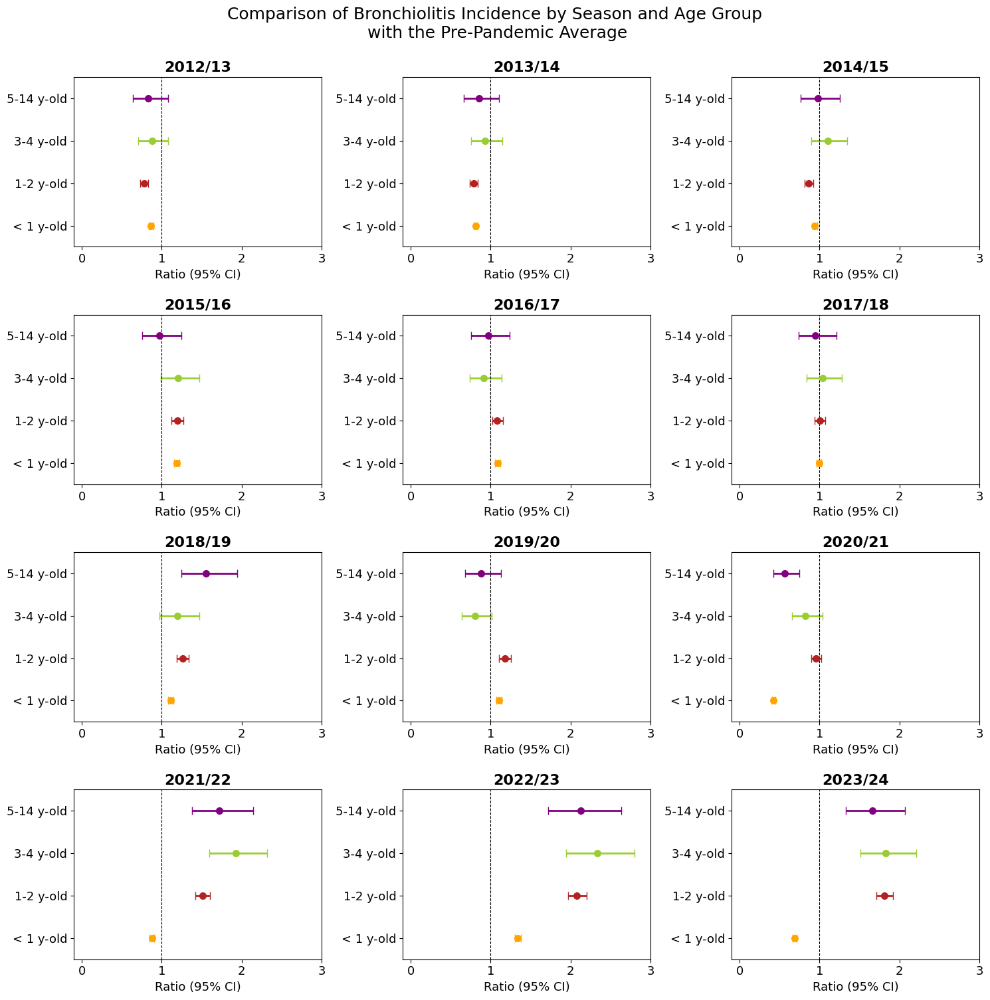

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Crear la matriz de subplots 4x3
fig, ax = plt.subplots(4, 3, figsize=(15, 15))
fig.suptitle('Comparison of Bronchiolitis Incidence by Season and Age Group\n with the Pre-Pandemic Average', fontsize=18, y=1)

# Colores para las barras de error
colors = ['orange', 'firebrick', 'yellowgreen', 'purple']

# Lista de títulos en formato 'YYYY/YY'
titles = [f'{year}/{str(year + 1)[-2:]}' for year in range(2012, 2024)]

for i, col in enumerate(['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']):
    row = i // 3  # Modificado para acomodar 3x4 subplots
    column = i % 3  # Modificado para acomodar 3x4 subplots

    for j, y_label in enumerate(['< 1 y-old', '1-2 y-old', '3-4 y-old', '5-14 y-old']):
        x_value = data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j]
        x_err_low = data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j] - data_plot_RR.iloc[[1, 4, 7, 10]][col].values[j]
        x_err_high = data_plot_RR.iloc[[2, 5, 8, 11]][col].values[j] - data_plot_RR.iloc[[0, 3, 6, 9]][col].values[j]

        ax[row, column].errorbar(
            x=x_value, y=y_label,
            xerr=[[np.abs(x_err_low)], [np.abs(x_err_high)]],
            color=colors[j], capsize=4, linestyle='None', linewidth=2,
            marker="o", markersize=7, mfc=colors[j], mec=colors[j]
        )

    ax[row, column].axvline(x=1, linewidth=0.8, linestyle='--', color='black')
    ax[row, column].tick_params(axis='both', which='major', labelsize=13)
    ax[row, column].set_xlabel('Ratio (95% CI)', fontsize=13)
    ax[row, column].set_xlim((-0.1, 3))
    ax[row, column].set_title(titles[i], fontsize=16, fontweight='bold')  # Usar el título modificado

    # Ajustar los márgenes internos para disminuir el espacio vertical
    ax[row, column].set_ylim(-0.5, 3.5)  # Ajustar límites del eje y
    ax[row, column].set_yticks([0, 1, 2, 3])  # Asegurarse de que las etiquetas estén en el rango adecuado

# Ajustar el espaciado entre subplots
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

plt.show()


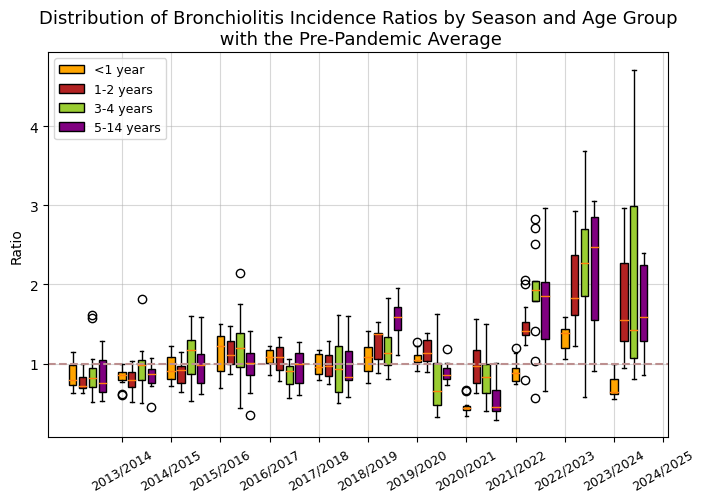

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(8, 5))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
          cohort_promig_prepand=pics_promig_prepand[cohort]
          dades_cohort.index=range(1,len(dades_cohort)+1)
          cohort_promig_prepand.index=range(1,len(cohort_promig_prepand)+1)
          ratio_temp_coh=dades_cohort.div(cohort_promig_prepand.squeeze(),axis=0)

          #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

          box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada+2}' for temporada in temporada_cohort.keys()], fontsize=9,rotation=30)
ax.set_ylabel('Ratio', fontsize=10)
#ax.set_xlabel('Season and Age Group')
ax.set_title('Distribution of Bronchiolitis Incidence Ratios by Season and Age Group\n with the Pre-Pandemic Average', fontsize=13)
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left', fontsize=9)

plt.grid(True, alpha=0.5)
plt.show()

In [ ]:
# Per anàlisi a Minitab
from scipy import stats

# Crear un diccionario anidado para almacenar los datos de ratio_temp_coh para cada cohorte y temporada
datos_por_cohorte_temporada = {}

# Iterar sobre los datos y almacenar los datos de ratio_temp_coh para cada cohorte y temporada
for temporada, dades_temp in temporada_cohort.items():
    datos_por_cohorte_temporada[temporada] = {}
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            cohort_promig_prepand = pics_promig_prepand[cohort]
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prepand.index = range(1, len(cohort_promig_prepand) + 1)
            ratio_temp_coh = dades_cohort.div(cohort_promig_prepand.squeeze(), axis=0)

            # Almacenar los datos de ratio_temp_coh para cada cohorte y temporada en el diccionario anidado
            if cohort not in datos_por_cohorte_temporada[temporada]:
                datos_por_cohorte_temporada[temporada][cohort] = []
            datos_por_cohorte_temporada[temporada][cohort].append(ratio_temp_coh)

#print(datos_por_cohorte_temporada)


In [ ]:
# ANOVA para los ratios
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np

# Recopilar los datos en un formato adecuado para el análisis de ANOVA
data = []
groups = []
for temporada, dades_temp in datos_por_cohorte_temporada.items():
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            cohort_promig_prepand = pics_promig_prepand[cohort]
            for dades in dades_cohort:
                ratio_temp_coh = dades.values.squeeze() / cohort_promig_prepand.squeeze()
                data.extend(ratio_temp_coh)
                groups.extend([cohort] * len(ratio_temp_coh))

# Convertir nombres de cohortes a índices numéricos
unique_groups = np.unique(groups)
group_indices = {group: i for i, group in enumerate(unique_groups)}
numeric_groups = [group_indices[group] for group in groups]

# Realizar ANOVA
anova_result = f_oneway(data, numeric_groups)
print("Resultados del ANOVA:")
print("Valor F:", anova_result.statistic)
print("Valor p:", anova_result.pvalue)

# Realizar pruebas post hoc si el ANOVA muestra diferencias significativas
if anova_result.pvalue < 0.05:
    # Realizar pruebas post hoc (usando Tukey HSD)
    posthoc = pairwise_tukeyhsd(data, numeric_groups)

    # Imprimir los resultados de las pruebas post hoc
    print("\nResultados de las pruebas post hoc:")
    print(posthoc)


Resultados del ANOVA:
Valor F: 603.5879655832094
Valor p: 5.20674923477119e-109

Resultados de las pruebas post hoc:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1   0.0122 0.9806 -0.0693 0.0937  False
     0      2   0.1621    0.0  0.0806 0.2436   True
     0      3   1.0015    0.0    0.92  1.083   True
     1      2   0.1499    0.0  0.0684 0.2314   True
     1      3   0.9894    0.0  0.9079 1.0709   True
     2      3   0.8395    0.0   0.758 0.9209   True
---------------------------------------------------


## Segona comparació: inter-franges d'edat

In [ ]:
# Obtindre les incidències relatives respecte la franja 1-2a
# Primer, obtenim un diccionari sense les dades de la franja 1-2a i sense la franja total
temporada_cohort_sense12a={}
cohorts_eliminats=['incid_1-2a','incid_total']
for temporada,dades_temp in temporada_cohort.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_sense12a[temporada]=noves_dades_temp

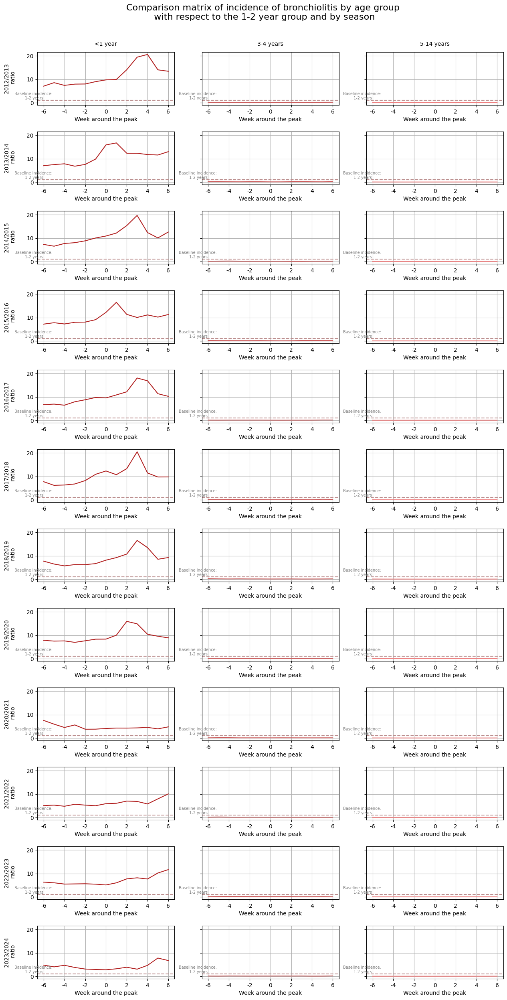

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort_sense12a)
num_columnes=len(next(iter(temporada_cohort_sense12a.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,30), sharey=True)
fig.suptitle('Comparison matrix of incidence of bronchiolitis by age group\n with respect to the 1-2 year group and by season', fontsize=16,y=0.92)
colors=['firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense12a.items()):
  cohort_baseline=temporada_cohort[temporada]['incid_1-2a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_temp_12a, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
    #axs[i,j].set_yticks([0,1,2,3,4])

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline incidence:\n 1-2 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

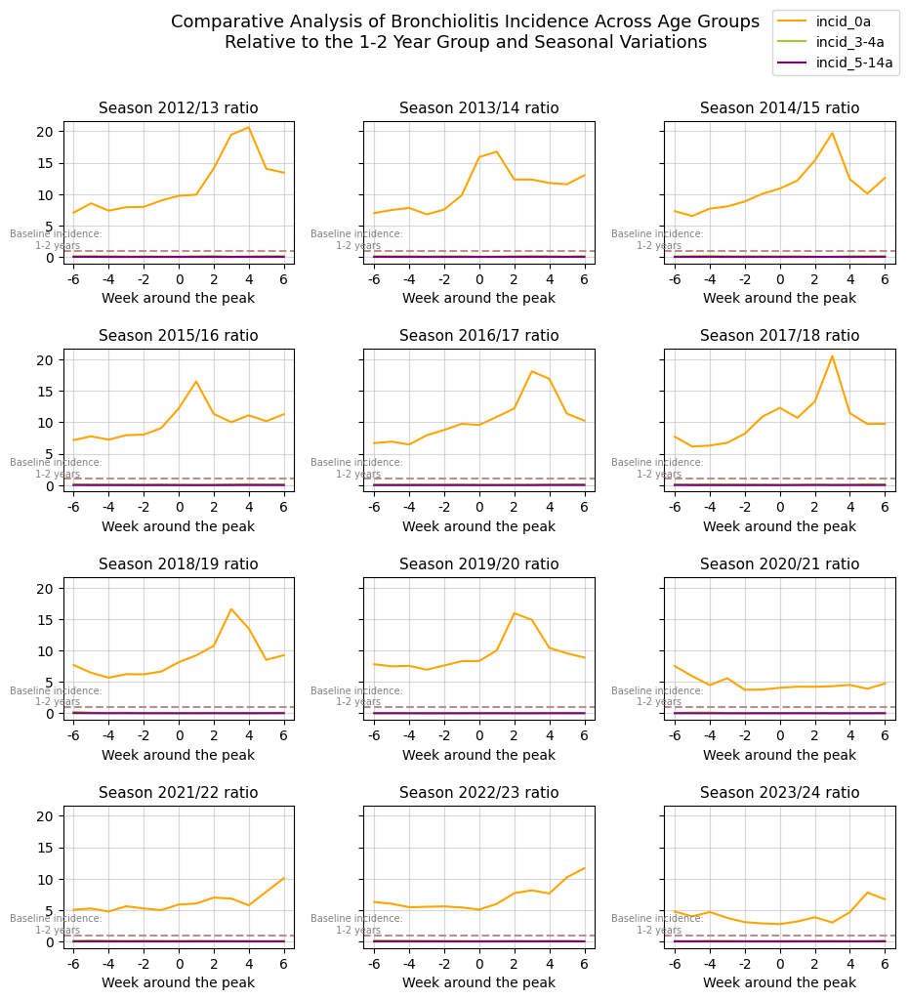

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

# Número de filas y columnas
num_filas = 4
num_columnas = 3

# Tamaño de la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(11,11), sharey=True)

# Título de la figura
fig.suptitle('Comparative Analysis of Bronchiolitis Incidence Across Age Groups\nRelative to the 1-2 Year Group and Seasonal Variations', fontsize=13, y=0.98)

colors=['orange','yellowgreen','purple']
line_labels = set()  # Conjunto para almacenar las etiquetas de las líneas

# Automatización cálculo y representación por temporada
for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense12a.items()):
    cohort_baseline = temporada_cohort[temporada]['incid_1-2a']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    fila = i // num_columnas  # Calcular la fila actual
    columna = i % num_columnas  # Calcular la columna actual
    ax = axs[fila, columna]  # Subplot para esta temporada

    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':  # Excluir la columna 'incid_total'
            # Ajustar index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            ratio_temp_12a = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

            # Ploteo en el mismo subplot
            ax.plot(ratio_temp_12a, label=f'{cohort}', color=colors[j % len(colors)])
            line_labels.add(f'{cohort}')  # Agregar la etiqueta de la línea al conjunto

    # Configuración de los ejes y etiquetas para el subplot actual
    ax.set_xlabel('Week around the peak', fontsize=10)
    ax.grid(True, alpha=0.5)
    ax.set_xticks([1, 3, 5, 7, 9, 11, 13])
    ax.xaxis.set_major_locator(FixedLocator([1, 3, 5, 7, 9, 11, 13]))
    ax.xaxis.set_major_formatter(FixedFormatter(['-6', '-4', '-2', '0', '2', '4', '6']))
    ax.axhline(y=1, color='rosybrown', linestyle='--')
    ax.text(0, 1, 'Baseline incidence:\n 1-2 years', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

    # Título de la temporada para el subplot actual
    ax.set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)

# Convertir el conjunto en una lista y agregar leyenda para toda la matriz
fig.legend(labels=list(line_labels), loc='upper right', bbox_to_anchor=(0.91, 0.99))


# Ajustar el espaciado entre subplots
plt.subplots_adjust(hspace=0.6, wspace=0.3)

plt.show()


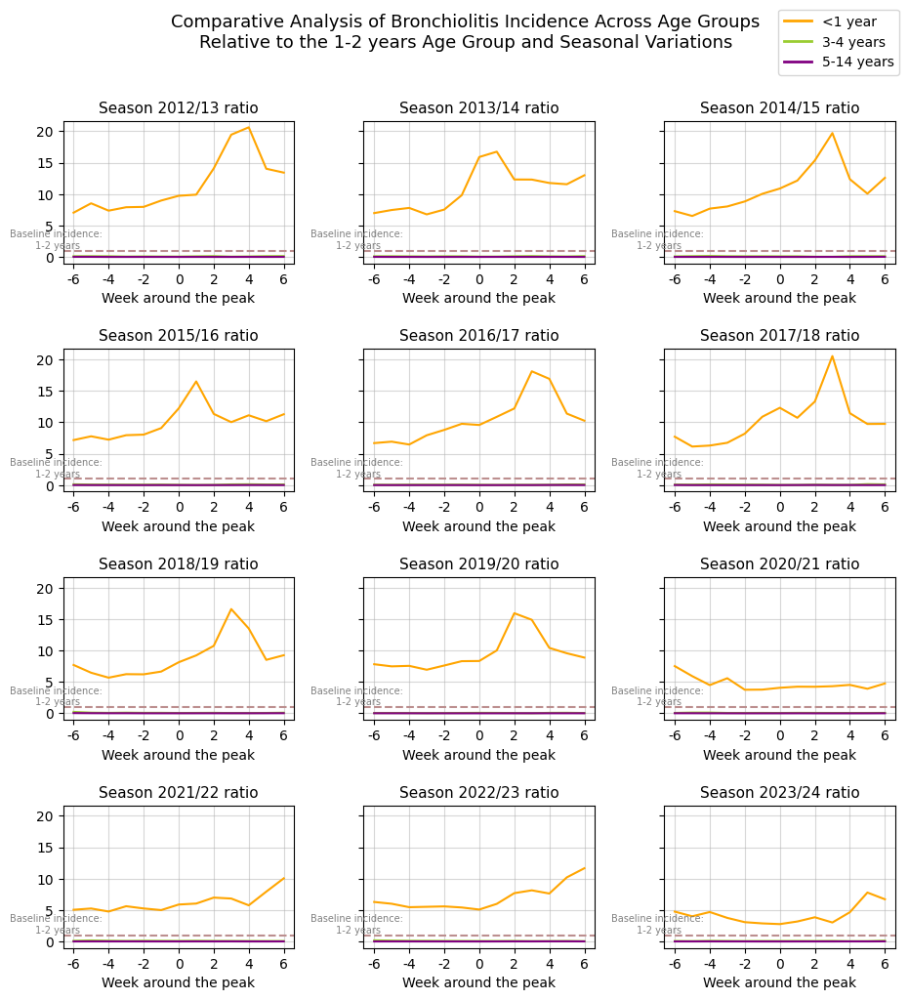

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

# Número de filas y columnas
num_filas = 4
num_columnas = 3

# Tamaño de la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(11,11), sharey=True)

# Título de la figura
fig.suptitle('Comparative Analysis of Bronchiolitis Incidence Across Age Groups\nRelative to the 1-2 years Age Group and Seasonal Variations', fontsize=13, y=0.98)

# Definir colores y etiquetas personalizadas
colors = ['orange', 'yellowgreen', 'purple']
label_mapping = {
    'incid_0a': '<1 year',
    'incid_3-4a': '3-4 years',
    'incid_5-14a': '5-14 years'
}

# Automatización cálculo y representación por temporada
for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense12a.items()):
    cohort_baseline = temporada_cohort[temporada]['incid_1-2a']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    fila = i // num_columnas  # Calcular la fila actual
    columna = i % num_columnas  # Calcular la columna actual
    ax = axs[fila, columna]  # Subplot para esta temporada

    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':  # Excluir la columna 'incid_total'
            # Ajustar index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            ratio_temp_12a = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

            # Obtener la etiqueta personalizada o usar la original si no está mapeada
            label = label_mapping.get(cohort, cohort)

            # Ploteo en el mismo subplot
            ax.plot(ratio_temp_12a, label=label, color=colors[j % len(colors)])

    # Configuración de los ejes y etiquetas para el subplot actual
    ax.set_xlabel('Week around the peak', fontsize=10)
    ax.grid(True, alpha=0.5)
    ax.set_xticks([1, 3, 5, 7, 9, 11, 13])
    ax.xaxis.set_major_locator(FixedLocator([1, 3, 5, 7, 9, 11, 13]))
    ax.xaxis.set_major_formatter(FixedFormatter(['-6', '-4', '-2', '0', '2', '4', '6']))
    ax.axhline(y=1, color='rosybrown', linestyle='--')
    ax.text(0, 1, 'Baseline incidence:\n 1-2 years', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

    # Título de la temporada para el subplot actual
    ax.set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)

# Crear leyenda global utilizando un proxy artist
proxy_artists = [plt.Line2D([0], [0], linestyle='-', linewidth=2, color=colors[i], label=label) for i, label in enumerate(label_mapping.values())]

# Añadir leyenda a la figura
fig.legend(handles=proxy_artists, loc='upper right', bbox_to_anchor=(0.91, 0.99))

# Ajustar el espaciado entre subplots
plt.subplots_adjust(hspace=0.6, wspace=0.3)

plt.show()


In [ ]:
# Per anàlisi a Minitab
from scipy import stats

# Crear un diccionario anidado para almacenar los datos de ratio_temp_coh para cada cohorte y temporada
datos_por_cohorte_temporada = {}

# Iterar sobre los datos y almacenar los datos de ratio_temp_coh para cada cohorte y temporada
for temporada, dades_temp in temporada_cohort_sense12a.items():
    datos_por_cohorte_temporada[temporada] = {}
    cohort_baseline=temporada_cohort[temporada]['incid_1-2a']
    cohort_baseline.index=range(1,len(cohort_baseline)+1)
    for cohort, dades_cohort in dades_temp.items():
      dades_cohort.index = range(1, len(dades_cohort) + 1)
      ratio_temp_12a = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

      # Almacenar los datos de ratio_temp_12a para cada cohorte y temporada en el diccionario anidado
      if cohort not in datos_por_cohorte_temporada[temporada]:
          datos_por_cohorte_temporada[temporada][cohort] = []
      datos_por_cohorte_temporada[temporada][cohort].append(ratio_temp_12a)

#print(datos_por_cohorte_temporada)

# Anàlisi incidència VRS

In [ ]:
vrs=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx",sheet_name=1)

In [ ]:
vrs['data']=pd.to_datetime(vrs['data'])
# Factor "població"
vrs['f0']=vrs['casos_setmanals_0a']/vrs['incid_0a']
vrs['f12']=vrs['casos_setmanals_1-2a']/vrs['incid_1-2a']
vrs['f34']=vrs['casos_setmanals_3-4a']/vrs['incid_3-4a']
vrs['f514']=vrs['casos_setmanals_5-14a']/vrs['incid_5-14a']

# Incidència total (menors de 14 anys)
vrs['incid_total']=(vrs[['casos_setmanals_0a','casos_setmanals_1-2a','casos_setmanals_3-4a','casos_setmanals_5-14a']].sum(axis=1))/(vrs[['f0','f12','f34','f514']].sum(axis=1))

# Substituir valors NaN per 0
vrs.fillna(0,inplace=True)
vrs.head()

,Unnamed: 0,data,casos_setmanals_0a,incid_0a,casos_setmanals_1-2a,incid_1-2a,casos_setmanals_3-4a,incid_3-4a,casos_setmanals_5-14a,incid_5-14a,f0,f12,f34,f514,incid_total
0,0,2020-12-20,0.0,0.0,2.083333,1.585731,0.0,0.0,0.0,0.0,0.0,1.3138,0.0,0.0,1.585731
1,1,2020-12-27,0.0,0.0,0.509524,0.387824,0.0,0.0,0.0,0.0,0.0,1.3138,0.0,0.0,0.387824
2,2,2021-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.000000
3,3,2021-01-10,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.000000
4,4,2021-01-17,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.000000


In [ ]:
# Preparar dataframe
vrs.drop('casos_setmanals_0a',axis=1,inplace=True)
vrs.drop('casos_setmanals_1-2a',axis=1,inplace=True)
vrs.drop('casos_setmanals_3-4a',axis=1,inplace=True)
vrs.drop('casos_setmanals_5-14a',axis=1,inplace=True)
vrs.drop('f0',axis=1,inplace=True)
vrs.drop('f12',axis=1,inplace=True)
vrs.drop('f34',axis=1,inplace=True)
vrs.drop('f514',axis=1,inplace=True)
vrs.head()

,Unnamed: 0,data,incid_0a,incid_1-2a,incid_3-4a,incid_5-14a,incid_total
0,0,2020-12-20,0.0,1.585731,0.0,0.0,1.585731
1,1,2020-12-27,0.0,0.387824,0.0,0.0,0.387824
2,2,2021-01-03,0.0,0.000000,0.0,0.0,0.000000
3,3,2021-01-10,0.0,0.000000,0.0,0.0,0.000000
4,4,2021-01-17,0.0,0.000000,0.0,0.0,0.000000


## Màxims de cada temporada

In [ ]:
# Dividir per temporades
def temporada (data):
  if data.month >= 9:
    return data.year
  else:
    return data.year - 1
vrs['temporada']=vrs['data'].apply(temporada)
vrs.head()

,Unnamed: 0,data,incid_0a,incid_1-2a,incid_3-4a,incid_5-14a,incid_total,temporada
0,0,2020-12-20,0.0,1.585731,0.0,0.0,1.585731,2020
1,1,2020-12-27,0.0,0.387824,0.0,0.0,0.387824,2020
2,2,2021-01-03,0.0,0.000000,0.0,0.0,0.000000,2020
3,3,2021-01-10,0.0,0.000000,0.0,0.0,0.000000,2020
4,4,2021-01-17,0.0,0.000000,0.0,0.0,0.000000,2020


In [ ]:
# Agrupar per temporades i trobar el màxim
max_temp=vrs.groupby('temporada')['incid_total'].max()
print(max_temp)

temporada
2020    35.869691
2021    12.016798
2022    11.999550
2023    21.958534
Name: incid_total, dtype: float64


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim de cada temporada
pic_temporada = []
for temporada, maxim in max_temp.items():
  data_max=vrs[(vrs['temporada']==temporada) & (vrs['incid_total']==maxim)].index[0]
  start_pic=max(0,data_max-6)
  end_pic=min(len(vrs),data_max+7)
  rang_pic=vrs.iloc[start_pic:end_pic]

  pic_temporada.append(rang_pic)

# Guardar tot en un dtframe nou
pic_temporades=pd.concat(pic_temporada)
pic_temporades.reset_index(drop=True,inplace=True)

# Enumerar les setmanes de la 1 a la 13 per cada temporada
pic_temporades['setmana']=pic_temporades.groupby('temporada').cumcount()+1
#print(pic_temporades)

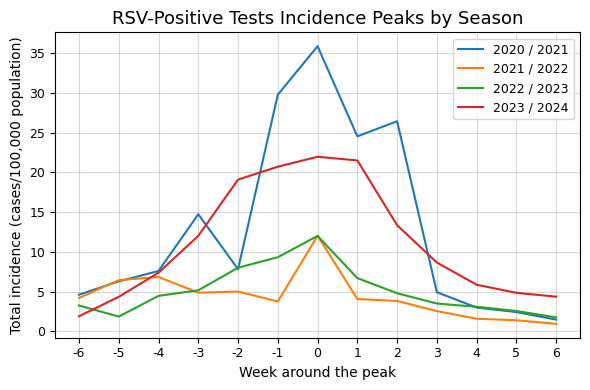

In [ ]:
# Representació dels pics superposats
plt.figure(figsize=(6,4))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
for i,(temporada,dades) in enumerate(pic_temporades.groupby('temporada')):
  plt.plot(dades['setmana'],dades['incid_total'],label=f'{temporada} / {temporada+1}')
  plt.xticks(dades['setmana'],etiquetes)

plt.title('Incidència promig prepandèmia')
plt.xlabel('Week around the peak',fontsize=10)
plt.ylabel('Total incidence (cases/100,000 population)',fontsize=10)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.title('RSV-Positive Tests Incidence Peaks by Season',fontsize=13)
plt.legend(fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

## Pic mitjà pre-nirse (per cada franja d'edat)

In [ ]:
# Filtre anys previs
pic_temporades_prenirse=pic_temporades[(pic_temporades['temporada']<=2022)]

In [ ]:
# Preparar dataframe
prom_pic_prenirse=pic_temporades_prenirse.groupby('setmana').mean()
prom_pic_prenirse.drop('Unnamed: 0',axis=1,inplace=True)
prom_pic_prenirse.drop('temporada',axis=1,inplace=True)
print(prom_pic_prenirse)

              data   incid_0a  incid_1-2a  incid_3-4a  incid_5-14a  \
setmana                                                              
1       2022-01-02  20.451313    8.776125    1.861324     0.029243   
2       2022-01-09  34.678998   11.661857    3.569531     0.105593   
3       2022-01-16  40.454691   18.848297    4.143800     0.140967   
4       2022-01-23  40.122993   20.828178    4.267411     0.164467   
5       2022-01-30  59.043881   30.055663    6.271853     0.328512   
6       2022-02-06  53.344403   37.214830    4.336858     0.211608   
7       2022-02-13  73.985515   39.818838    5.462349     0.170632   
8       2022-02-20  48.404721   26.805198    4.862551     0.229084   
9       2022-02-27  49.280754   23.745992    2.369252     0.323226   
10      2022-03-06  36.677068   14.899701    0.989021     0.205549   
11      2022-03-13  26.288388    8.602519    1.334514     0.276437   
12      2022-03-20  22.047297    6.414434    1.401973     0.358705   
13      2022-03-27  

In [ ]:
# Càlcul dels intervals de confiança del 90%
if 'data' in pic_temporades_prenirse.columns:
  pic_temporades_prenirse=pic_temporades_prenirse.drop('data',axis=1)

from scipy import stats
setmanes=pic_temporades_prenirse.groupby('setmana')
promitjos=setmanes.mean()

def conf_intervals(pic_temporades_prenirse):
  mean=pic_temporades_prenirse.mean()
  n=len(pic_temporades_prenirse)
  stderr=stats.sem(pic_temporades_prenirse)
  interval=stderr * stats.t.ppf((1+0.90)/2,n-1)
  return mean,mean-interval,mean+interval

intervals=setmanes.aggregate(lambda x: conf_intervals(x))
resultats=pd.concat([promitjos,intervals.rename(columns=lambda x: x+'_ci')],axis=1)
#print(resultats)

# Guardar dades en un dataframe
resultats_f=pd.DataFrame()
  # Separar tuples en columnes
for columna in resultats.columns:
   if not columna.endswith('_ci'):
     continue
   dades_sep=resultats[columna].apply(pd.Series)
   dades_sep.columns=[f'{columna}_{i}' for i in range(len(dades_sep.columns))]
   resultats_f=pd.concat([resultats_f,dades_sep],axis=1)
#print(resultats_f)
resultats_f.head()

,Unnamed: 0_ci_0,Unnamed: 0_ci_1,Unnamed: 0_ci_2,incid_0a_ci_0,incid_0a_ci_1,incid_0a_ci_2,incid_1-2a_ci_0,incid_1-2a_ci_1,incid_1-2a_ci_2,incid_3-4a_ci_0,...,incid_3-4a_ci_2,incid_5-14a_ci_0,incid_5-14a_ci_1,incid_5-14a_ci_2,incid_total_ci_0,incid_total_ci_1,incid_total_ci_2,temporada_ci_0,temporada_ci_1,temporada_ci_2
setmana,,,,,,,,,,,,,,,,,,,,,
1,54.0,-9.460721,117.460721,20.451313,-14.556560,55.459186,8.776125,-0.458047,18.010298,1.861324,...,5.105662,0.029243,-0.056147,0.114634,4.016008,2.837050,5.194965,2021.0,2019.314146,2022.685854
2,55.0,-8.460721,118.460721,34.678998,-6.090941,75.448937,11.661857,-5.138441,28.462156,3.569531,...,10.094701,0.105593,-0.048574,0.259760,4.853363,0.463743,9.242983,2021.0,2019.314146,2022.685854
3,56.0,-7.460721,119.460721,40.454691,-12.521031,93.430414,18.848297,8.157171,29.539424,4.143800,...,9.174029,0.140967,-0.113360,0.395294,6.293282,3.533049,9.053515,2021.0,2019.314146,2022.685854
4,57.0,-6.460721,120.460721,40.122993,20.338958,59.907029,20.828178,15.946683,25.709673,4.267411,...,5.588066,0.164467,-0.135186,0.464121,8.246462,-1.219116,17.712040,2021.0,2019.314146,2022.685854
5,58.0,-5.460721,121.460721,59.043881,28.964843,89.122920,30.055663,10.312026,49.799299,6.271853,...,10.515125,0.328512,0.010041,0.646983,6.936674,4.111418,9.761930,2021.0,2019.314146,2022.685854


In [ ]:
# Convertir a 0 els valors negatius
def conv_0(x):
  if x<0:
    return 0
  else:
    return x

resultats_f=resultats_f.applymap(conv_0)

# Arreglar valor 0 --> 0.0001. Da problemas en algún dato (semana -6, año 2023). Mejor no usarlo
#resultats_f['incid_5-14a_ci_0']=resultats_f['incid_5-14a_ci_0'].replace(0,0.000001)

# Ordenar dataframe
resultats_f.drop('Unnamed: 0_ci_0',axis=1,inplace=True)
resultats_f.drop('Unnamed: 0_ci_1',axis=1,inplace=True)
resultats_f.drop('Unnamed: 0_ci_2',axis=1,inplace=True)
resultats_f.drop('temporada_ci_0',axis=1,inplace=True)
resultats_f.drop('temporada_ci_1',axis=1,inplace=True)
resultats_f.drop('temporada_ci_2',axis=1,inplace=True)
resultats_f.columns=['incid_0a','incid_0a_icinf','incid_0a_icsup','incid_1-2a','incid_1-2a_icinf','incid_1-2a_icsup','incid_3-4a','incid_3-4a_icinf','incid_3-4a_icsup','incid_5-14a','incid_5-14a_icinf','incid_5-14a_icsup','incid_total','incid_total_icinf','incid_total_icsup',]
pics_promig_prenirse=resultats_f
pics_promig_prenirse.head()


,incid_0a,incid_0a_icinf,incid_0a_icsup,incid_1-2a,incid_1-2a_icinf,incid_1-2a_icsup,incid_3-4a,incid_3-4a_icinf,incid_3-4a_icsup,incid_5-14a,incid_5-14a_icinf,incid_5-14a_icsup,incid_total,incid_total_icinf,incid_total_icsup
setmana,,,,,,,,,,,,,,,
1,20.451313,0.000000,55.459186,8.776125,0.000000,18.010298,1.861324,0.000000,5.105662,0.029243,0.000000,0.114634,4.016008,2.837050,5.194965
2,34.678998,0.000000,75.448937,11.661857,0.000000,28.462156,3.569531,0.000000,10.094701,0.105593,0.000000,0.259760,4.853363,0.463743,9.242983
3,40.454691,0.000000,93.430414,18.848297,8.157171,29.539424,4.143800,0.000000,9.174029,0.140967,0.000000,0.395294,6.293282,3.533049,9.053515
4,40.122993,20.338958,59.907029,20.828178,15.946683,25.709673,4.267411,2.946757,5.588066,0.164467,0.000000,0.464121,8.246462,0.000000,17.712040
5,59.043881,28.964843,89.122920,30.055663,10.312026,49.799299,6.271853,2.028581,10.515125,0.328512,0.010041,0.646983,6.936674,4.111418,9.761930


### Representacions dels pics superposats

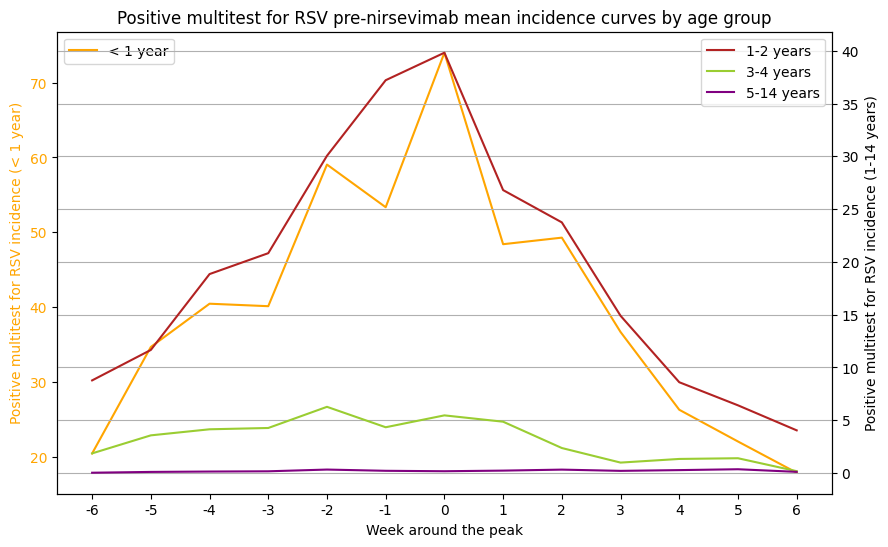

In [ ]:
# Representació dels pics superposats (mitjana 2020,2021,2022)
col1='orange'
col2='black'

fig,ax1=plt.subplots(figsize=(10,6))
ax1.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a'],label='< 1 year',color=col1)
ax1.set_xlabel('Week around the peak')
ax1.set_ylabel('Positive multitest for RSV incidence (< 1 year)',color=col1)
ax1.tick_params(axis='y',labelcolor=col1)

ax2=ax1.twinx()
ax2.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a'],label='5-14 years',color='purple')
ax2.set_ylabel('Positive multitest for RSV incidence (1-14 years)',color=col2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Positive multitest for RSV pre-nirsevimab mean incidence curves by age group')
#fig.legend()
plt.grid(True)
#plt.tight_layout()

plt.show()

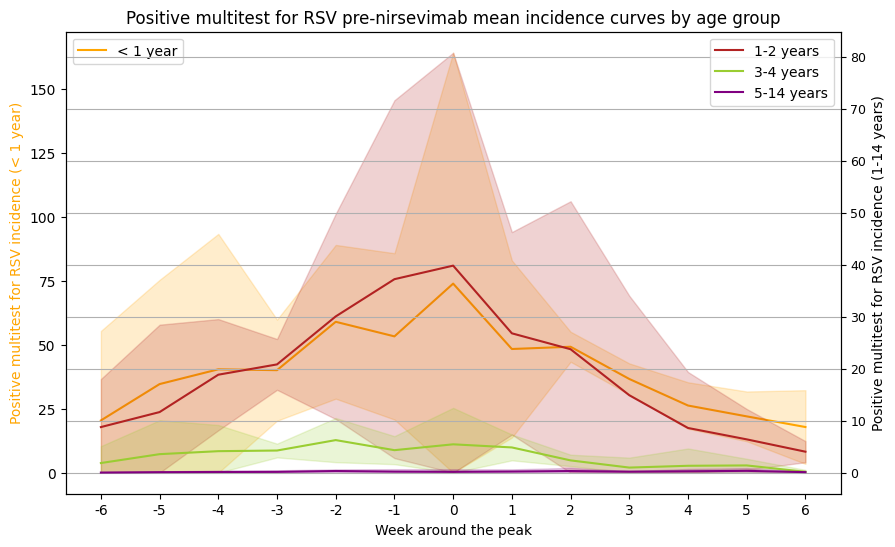

In [ ]:
# Representació dels pics superposats amb IC 90% (dos eixos) (mitjana 2020,2021,2022)
col1='orange'
col2='black'
fig,ax1=plt.subplots(figsize=(10,6))
ax1.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a'],label='< 1 year',color=col1)
ax1.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a_icinf'],pics_promig_prenirse['incid_0a_icsup'], color=col1,alpha=0.2)
ax1.set_xlabel('Week around the peak')
ax1.set_ylabel('Positive multitest for RSV incidence (< 1 year)',color=col1)

ax2=ax1.twinx()
ax2.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a'],label='5-14 years',color='purple')
ax2.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a_icinf'],pics_promig_prenirse['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
ax2.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a_icinf'],pics_promig_prenirse['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
ax2.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a_icinf'],pics_promig_prenirse['incid_5-14a_icsup'], color='purple',alpha=0.2)
ax2.set_ylabel('Positive multitest for RSV incidence (1-14 years)',color=col2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title('Positive multitest for RSV pre-nirsevimab mean incidence curves by age group')
#fig.legend()
plt.tick_params(axis='both', which='major', labelsize=9)
plt.grid(True)
#plt.tight_layout()

plt.show()

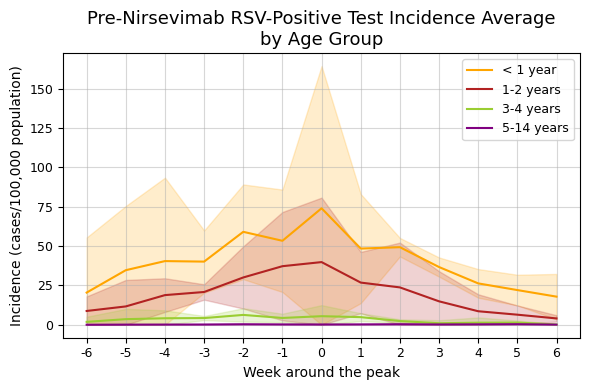

In [ ]:
# Representació dels pics superposats amb IC 90% (un eix) (mitjana 2020,2021,2022)
plt.figure(figsize=(6,4))
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a'],label='< 1 year',color='orange')
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a_icinf'],pics_promig_prenirse['incid_0a_icsup'], color='orange',alpha=0.2)
plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('Incidence (cases/100,000 population)', fontsize=10)

plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a'],label='5-14 years',color='purple')
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a_icinf'],pics_promig_prenirse['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a_icinf'],pics_promig_prenirse['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a_icinf'],pics_promig_prenirse['incid_5-14a_icsup'], color='purple',alpha=0.2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)
plt.tick_params(axis='both', which='major', labelsize=9)

plt.title('Pre-Nirsevimab RSV-Positive Test Incidence Average\nby Age Group', fontsize=13)
plt.legend(fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

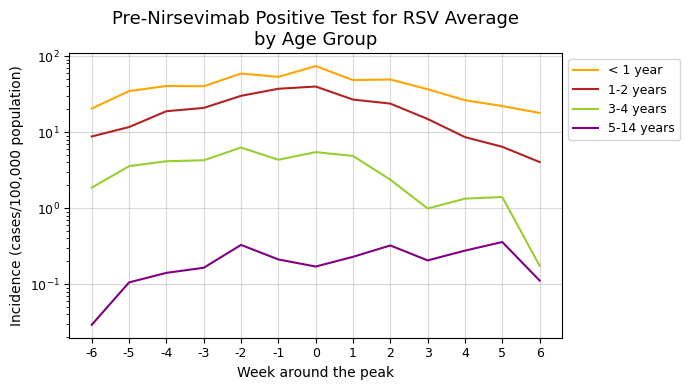

In [ ]:
# Representació dels pics superposats amb IC 90% (un eix) (mitjana 2020,2021,2022)
plt.figure(figsize=(7,4))
plt.semilogy(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a'],label='< 1 year',color='orange')
#plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a_icinf'],pics_promig_prenirse['incid_0a_icsup'], color='orange',alpha=0.2)
plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('Incidence (cases/100,000 population)', fontsize=10)

plt.semilogy(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a'],label='1-2 years',color='firebrick')
plt.semilogy(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a'],label='3-4 years',color='yellowgreen')
plt.semilogy(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a'],label='5-14 years',color='purple')
#plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a_icinf'],pics_promig_prenirse['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
#plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a_icinf'],pics_promig_prenirse['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
#plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a_icinf'],pics_promig_prenirse['incid_5-14a_icsup'], color='purple',alpha=0.2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)
plt.tick_params(axis='both', which='major', labelsize=9)

plt.title('Pre-Nirsevimab Positive Test for RSV Average\nby Age Group', fontsize=13)
plt.legend(loc='upper left', bbox_to_anchor=(1,1),fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

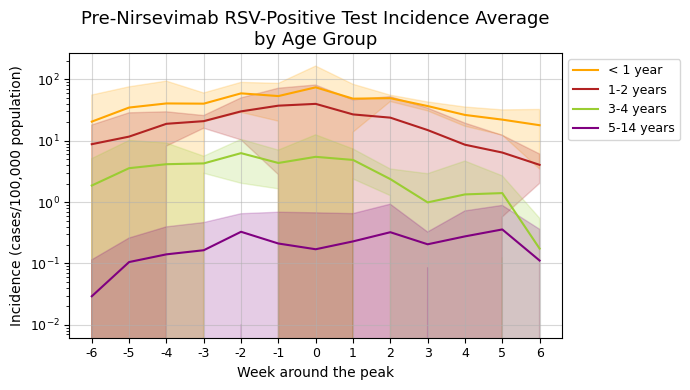

In [ ]:
plt.figure(figsize=(7,4))

# Trama de las series en escala logarítmica amb 90%
plt.semilogy(pics_promig_prenirse.index, pics_promig_prenirse['incid_0a'], label='< 1 year', color='orange')
plt.semilogy(pics_promig_prenirse.index, pics_promig_prenirse['incid_1-2a'], label='1-2 years', color='firebrick')
plt.semilogy(pics_promig_prenirse.index, pics_promig_prenirse['incid_3-4a'], label='3-4 years', color='yellowgreen')
plt.semilogy(pics_promig_prenirse.index, pics_promig_prenirse['incid_5-14a'], label='5-14 years', color='purple')
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_0a_icinf'],pics_promig_prenirse['incid_0a_icsup'], color='orange',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_1-2a_icinf'],pics_promig_prenirse['incid_1-2a_icsup'], color='firebrick',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_3-4a_icinf'],pics_promig_prenirse['incid_3-4a_icsup'], color='yellowgreen',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['incid_5-14a_icinf'],pics_promig_prenirse['incid_5-14a_icsup'], color='purple',alpha=0.2)

plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('Incidence (cases/100,000 population)', fontsize=10)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index, etiquetes)
plt.tick_params(axis='both', which='major', labelsize=9)

plt.legend(loc='upper left', bbox_to_anchor=(1,1), fontsize=9)
plt.title('Pre-Nirsevimab RSV-Positive Test Incidence Average\nby Age Group', fontsize=13)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

## Primera comparació

In [ ]:
temporades=pic_temporades['temporada'].unique()
# Diccionari dataframes
temporada_cohort={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=pic_temporades[pic_temporades['temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in pic_temporades.columns:
    if columna.startswith('incid_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort[temporada]=dades_cohort

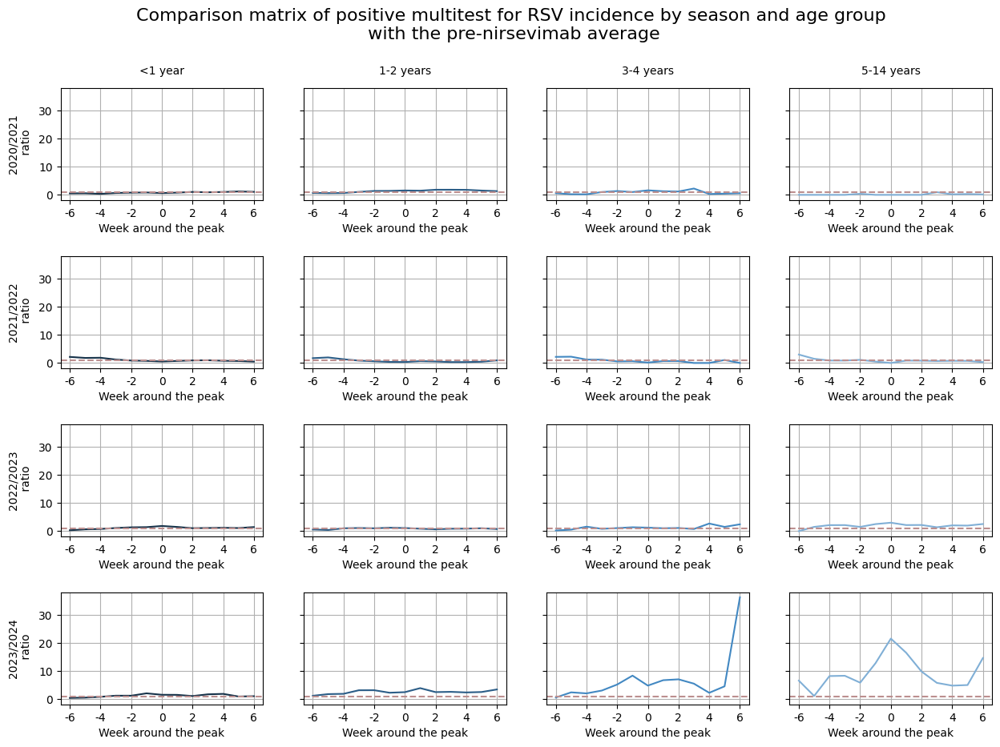

In [ ]:
# Matriu plots
num_files=len(temporada_cohort)
num_columnes=len(next(iter(temporada_cohort.values())))-1
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,10),sharey=True)
fig.suptitle('Comparison matrix of positive multitest for RSV incidence by season and age group\n with the pre-nirsevimab average', fontsize=16,y=0.98)
colors=['#17334a','#2b5d87','#4288c2','#80afd6']
etiquetes=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    if (cohort) != ('incid_total'):
      cohort_promig_prenirse=pics_promig_prenirse[cohort]
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)

      ratio_temp_coh=dades_cohort.div(cohort_promig_prenirse.squeeze(),axis=0)

      axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
      axs[i,j].set_xlabel('Week around the peak')
      axs[i,j].grid(True)
      axs[i,j].set_xticks([1,3,5,7,9,11,13])
      axs[i,j].set_xticklabels(etiquetes)
      axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

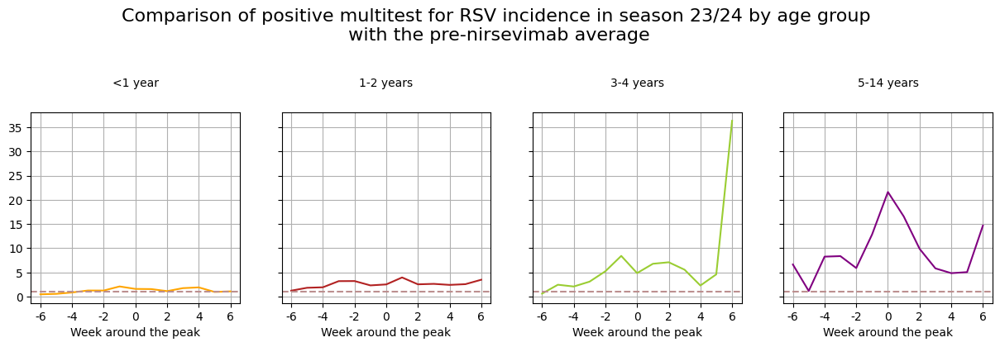

In [ ]:
# Comparació mitjana pre-nirse amb temporada 2023/2024
num_columnes= len(next(iter(temporada_cohort.values())))-1
fig,axs=plt.subplots(1,num_columnes,figsize=(15,3),sharey=True)
fig.suptitle('Comparison of positive multitest for RSV incidence in season 23/24 by age group\n with the pre-nirsevimab average', fontsize=16,y=1.3)
colors=['orange','firebrick','yellowgreen','purple']
etiquetes=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per cohort
temporada_2023=temporada_cohort[2023]
for j, (cohort,dades_cohort) in enumerate(temporada_2023.items()):
  if (cohort) != ('incid_total'):
    cohort_promig_prenirse=pics_promig_prenirse[cohort]
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)

    ratio_temp_coh=dades_cohort.div(cohort_promig_prenirse.squeeze(),axis=0)

    axs[j].plot(ratio_temp_coh, label=f'Cohort: {cohort}',color=colors[j % len(colors)])
    axs[j].set_xlabel('Week around the peak')
    axs[j].grid(True)
    axs[j].set_xticks([1,3,5,7,9,11,13])
    axs[j].set_xticklabels(etiquetes)
    axs[j].axhline(y=1,color='rosybrown',linestyle='--')

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

plt.subplots_adjust(hspace=0.5)

plt.show()

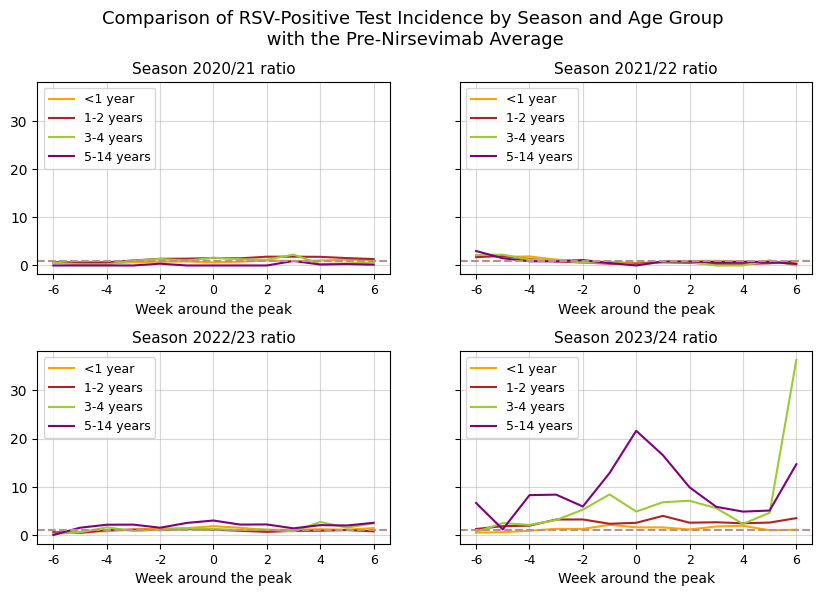

In [ ]:
# Matriu plots (1 per temporada)
fig, axs = plt.subplots(2, 2, figsize=(10, 6), gridspec_kw={'height_ratios': [2] * 2, 'width_ratios': [2] * 2}, sharey=True)
fig.suptitle('Comparison of RSV-Positive Test Incidence by Season and Age Group\n with the Pre-Nirsevimab Average', fontsize=13, y=1)

# Colores para las distintas cohortes
cohort_colors = {'incid_0a': 'orange', 'incid_1-2a': 'firebrick', 'incid_3-4a': 'yellowgreen', 'incid_5-14a': 'purple'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a': '1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    fila = i // 2
    columna = i % 2
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            cohort_promig_prenirse = pics_promig_prenirse[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prenirse.index = range(1, len(cohort_promig_prenirse) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prenirse.squeeze(), axis=0)
            # Agregar una línea para representar los datos en el subplot
            axs[fila, columna].plot(ratio_temp_coh, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

    axs[fila, columna].set_xlabel('Week around the peak', fontsize=10)
    axs[fila, columna].grid(True, alpha=0.5)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].set_xticklabels(etiquetas, fontsize=9)
    axs[fila, columna].legend(loc='upper left', fontsize='9')
    axs[fila, columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

# Agregar leyenda para toda la matriz con etiquetas personalizadas y colores correspondientes
#fig.legend(handles=line_labels, labels=custom_labels, loc='upper right', bbox_to_anchor=(1, 0.95))

plt.subplots_adjust(hspace=0.4)

plt.show()


In [ ]:
# Realitzar test estadístic de diferències significatives
# Importar las bibliotecas necesarias
from scipy import stats

# Definir tus datos
grupo1 = [10, 12, 14, 16, 18]  # Muestra 1
grupo2 = [13, 15, 17, 19, 21]  # Muestra 2

# Realizar la prueba t de Student
t_stat, p_valor = stats.ttest_ind(grupo1, grupo2)

# Imprimir el resultado
print("Estadística t:", t_stat)
print("Valor p:", p_valor)

# Interpretar el resultado
if p_valor < 0.05:
    print("Hay una diferencia significativa entre las dos muestras.")
else:
    print("No hay una diferencia significativa entre las dos muestras.")


Estadística t: -1.5
Valor p: 0.1720032919519113
No hay una diferencia significativa entre las dos muestras.


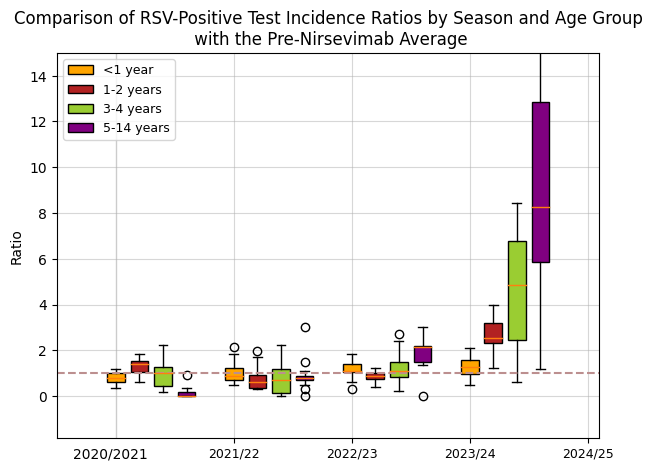

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(7, 5))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'incid_total':
          cohort_promig_prenirse=pics_promig_prenirse[cohort]
          dades_cohort.index=range(1,len(dades_cohort)+1)
          cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)
          ratio_temp_coh=dades_cohort.div(cohort_promig_prenirse.squeeze(),axis=0)

          #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

          box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada-1998}' for temporada in temporada_cohort.keys()], fontsize=9)
ax.set_ylabel('Ratio', fontsize=10)
#ax.set_xlabel('Season and Age Group')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020/2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.04  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -2.7))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of RSV-Positive Test Incidence Ratios by Season and Age Group\n with the Pre-Nirsevimab Average')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left', fontsize=9)
plt.ylim(bottom=None,top=15)
plt.grid(True, alpha=0.5)
plt.show()

In [ ]:
from scipy import stats

# Crear un diccionario anidado para almacenar los datos de ratio_temp_coh para cada cohorte y temporada
datos_por_cohorte_temporada = {}

# Iterar sobre los datos y almacenar los datos de ratio_temp_coh para cada cohorte y temporada
for temporada, dades_temp in temporada_cohort.items():
    datos_por_cohorte_temporada[temporada] = {}
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            cohort_promig_prenirse = pics_promig_prenirse[cohort]
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prenirse.index = range(1, len(cohort_promig_prenirse) + 1)
            ratio_temp_coh = dades_cohort.div(cohort_promig_prenirse.squeeze(), axis=0)

            # Almacenar los datos de ratio_temp_coh para cada cohorte y temporada en el diccionario anidado
            if cohort not in datos_por_cohorte_temporada[temporada]:
                datos_por_cohorte_temporada[temporada][cohort] = []
            datos_por_cohorte_temporada[temporada][cohort].append(ratio_temp_coh)

#print(datos_por_cohorte_temporada)


In [ ]:
# ANOVA pels ratis
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np

# Recopilar los datos en un formato adecuado para el análisis de ANOVA
data = []
groups = []
for temporada, dades_temp in datos_por_cohorte_temporada.items():
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            cohort_promig_prenirse = pics_promig_prenirse[cohort]
            for dades in dades_cohort:
                ratio_temp_coh = dades.values.squeeze() / cohort_promig_prenirse.squeeze()
                data.extend(ratio_temp_coh)
                groups.extend([cohort] * len(ratio_temp_coh))

# Convertir nombres de cohortes a índices numéricos
unique_groups = np.unique(groups)
group_indices = {group: i for i, group in enumerate(unique_groups)}
numeric_groups = [group_indices[group] for group in groups]

# Realizar ANOVA
anova_result = f_oneway(data, numeric_groups)

# Imprimir los resultados del ANOVA
print("Resultados del ANOVA:")
print("Valor F:", anova_result.statistic)
print("Valor p:", anova_result.pvalue)

# Realizar pruebas post hoc si el ANOVA muestra diferencias significativas
if anova_result.pvalue < 0.05:
    # Realizar pruebas post hoc (usando Tukey HSD)
    posthoc = pairwise_tukeyhsd(data, numeric_groups)

    # Imprimir los resultados de las pruebas post hoc
    print("\nResultados de las pruebas post hoc:")
    print(posthoc)


Resultados del ANOVA:
Valor F: 8.035000105677005
Valor p: 0.004812905571538966

Resultados de las pruebas post hoc:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     0      1    0.083    1.0 -12.8536 13.0195  False
     0      2    4.983 0.7508  -7.9536 17.9196  False
     0      3  21.9293 0.0001   8.9928 34.8659   True
     1      2      4.9 0.7604  -8.0366 17.8366  False
     1      3  21.8463 0.0001   8.9098 34.7829   True
     2      3  16.9463 0.0046   4.0098 29.8829   True
-----------------------------------------------------


## Segona comparació (franja d'edat de referència)

In [ ]:
# Creació diccionari que contingui les dades per temporada i cohort
temporades=pic_temporades['temporada'].unique()
# Diccionari dataframes
temporada_cohort={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=pic_temporades[pic_temporades['temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in pic_temporades.columns:
    if columna.startswith('incid_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort[temporada]=dades_cohort

### Prova 1-2 anys

In [ ]:
# Creació llista sense les dades de la franja de referència i altres sorolls
temporada_cohort_sense12a={}
cohorts_eliminats=['incid_1-2a','incid_total']
for temporada,dades_temp in temporada_cohort.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_sense12a[temporada]=noves_dades_temp

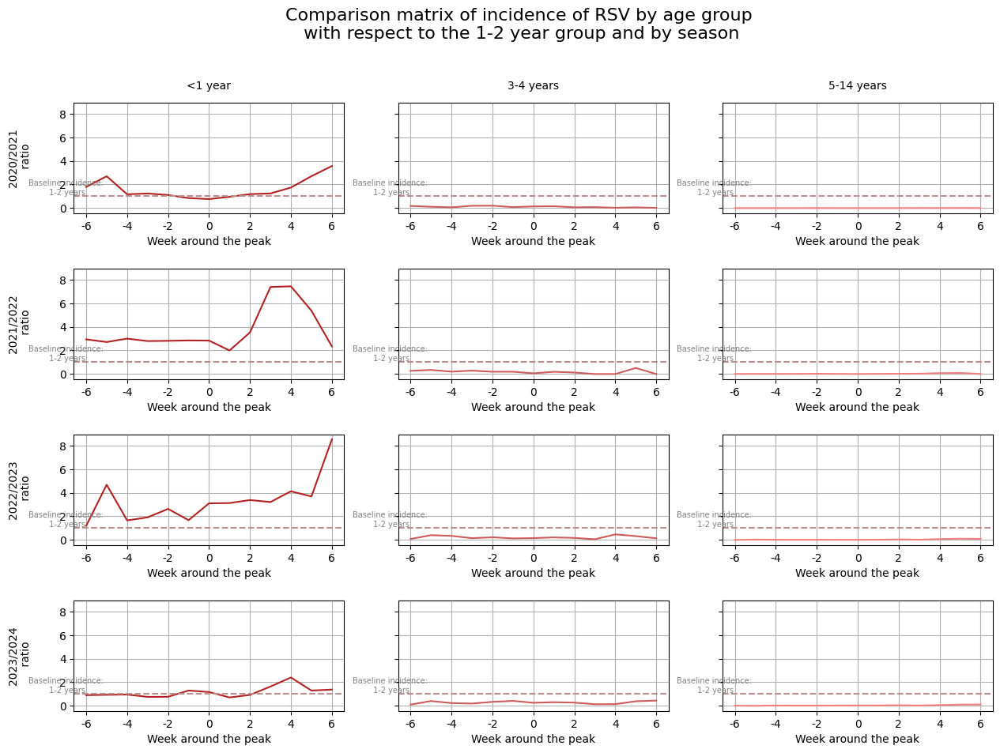

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort_sense12a)
num_columnes=len(next(iter(temporada_cohort_sense12a.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,10), sharey=True)
fig.suptitle('Comparison matrix of incidence of RSV by age group\n with respect to the 1-2 year group and by season', fontsize=16,y=1)
colors=['firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense12a.items()):
  cohort_baseline=temporada_cohort[temporada]['incid_1-2a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_temp_12a, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
    #axs[i,j].set_yticks([0,1,2,3,4])

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline incidence:\n 1-2 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

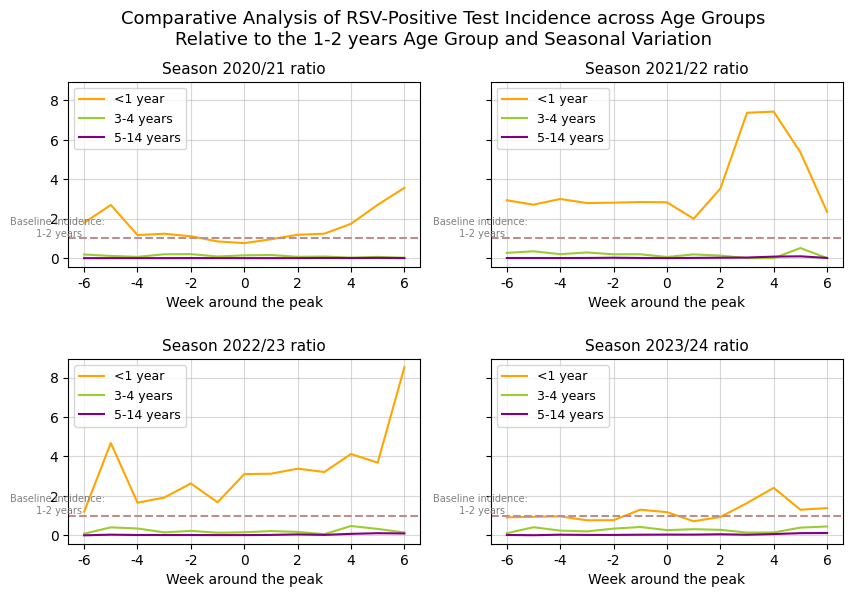

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparative Analysis of RSV-Positive Test Incidence across Age Groups\nRelative to the 1-2 years Age Group and Seasonal Variation', fontsize=13,y=1)
cohort_colors={'incid_0a':'orange','incid_3-4a':'yellowgreen','incid_5-14a':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense12a.items()):
  fila=i//2
  columna=i%2
  cohort_baseline=temporada_cohort[temporada]['incid_1-2a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for cohort,dades_cohort in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_temp_12a, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline incidence:\n 1-2 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)


plt.subplots_adjust(hspace=0.5)

plt.show()

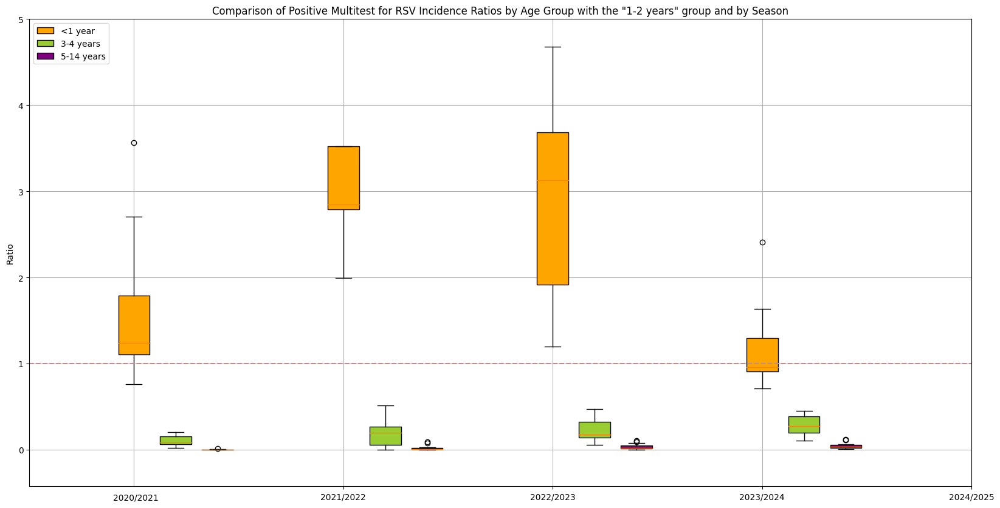

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense12a.items()):
  cohort_baseline=temporada_cohort[temporada]['incid_1-2a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)
  for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

    box = ax.boxplot(ratio_temp_12a, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
    labels.append(f'{temporada}-{cohort}')
    legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020/2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -0.585))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of Positive Multitest for RSV Incidence Ratios by Age Group with the "1-2 years" group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.ylim(bottom=None,top=5)
plt.show()

### Prova: >3 anys

In [ ]:
# Primer, s'ha de calcular la incidència en la població >3 anys
# Preparem el dataframe per a calcular els factors de les franjes 3-4 i 5-14
vrs3=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx",sheet_name=1)
vrs3['data']=pd.to_datetime(vrs3['data'])

# Factor població
vrs3['f0']=vrs3['casos_setmanals_0a']/vrs3['incid_0a']
vrs3['f12']=vrs3['casos_setmanals_1-2a']/vrs3['incid_1-2a']
vrs3['f34']=vrs3['casos_setmanals_3-4a']/vrs3['incid_3-4a']
vrs3['f514']=vrs3['casos_setmanals_5-14a']/vrs3['incid_5-14a']

# Incidència >3 anys
vrs3['incid_>3a']=(vrs3[['casos_setmanals_3-4a','casos_setmanals_5-14a']].sum(axis=1))/(vrs3[['f34','f514']].sum(axis=1))
# Incidència total (menors de 14 anys)
vrs3['incid_total']=(vrs3[['casos_setmanals_0a','casos_setmanals_1-2a','casos_setmanals_3-4a','casos_setmanals_5-14a']].sum(axis=1))/(vrs3[['f0','f12','f34','f514']].sum(axis=1))

# Substituir valors NaN per 0
vrs3.fillna(0,inplace=True)
vrs3.head()

# Preparar dataframe
vrs3.drop('casos_setmanals_0a',axis=1,inplace=True)
vrs3.drop('casos_setmanals_1-2a',axis=1,inplace=True)
vrs3.drop('casos_setmanals_3-4a',axis=1,inplace=True)
vrs3.drop('casos_setmanals_5-14a',axis=1,inplace=True)
vrs3.drop('f0',axis=1,inplace=True)
vrs3.drop('f12',axis=1,inplace=True)
vrs3.drop('f34',axis=1,inplace=True)
vrs3.drop('f514',axis=1,inplace=True)
vrs3.head()

,Unnamed: 0,data,incid_0a,incid_1-2a,incid_3-4a,incid_5-14a,incid_>3a,incid_total
0,0,2020-12-20,0.0,1.585731,0.0,0.0,0.0,1.585731
1,1,2020-12-27,0.0,0.387824,0.0,0.0,0.0,0.387824
2,2,2021-01-03,0.0,0.000000,0.0,0.0,0.0,0.000000
3,3,2021-01-10,0.0,0.000000,0.0,0.0,0.0,0.000000
4,4,2021-01-17,0.0,0.000000,0.0,0.0,0.0,0.000000


In [ ]:
# Dividir per temporades
def temporada (data):
  if data.month >= 9:
    return data.year
  else:
    return data.year - 1
vrs3['temporada']=vrs3['data'].apply(temporada)

# Agrupar per temporades i trobar el màxim
max_temp=vrs.groupby('temporada')['incid_total'].max()
print(max_temp)

temporada
2020    35.869691
2021    12.016798
2022    11.999550
2023    21.958534
Name: incid_total, dtype: float64


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim de cada temporada
pic_temporada3 = []
for temporada, maxim in max_temp.items():
  data_max=vrs3[(vrs3['temporada']==temporada) & (vrs3['incid_total']==maxim)].index[0]
  start_pic=max(0,data_max-6)
  end_pic=min(len(vrs3),data_max+7)
  rang_pic=vrs3.iloc[start_pic:end_pic]

  pic_temporada3.append(rang_pic)

# Guardar tot en un dtframe nou
pic_temporades3=pd.concat(pic_temporada3)
pic_temporades3.reset_index(drop=True,inplace=True)

# Enumerar les setmanes de la 1 a la 13 per cada temporada
pic_temporades3['setmana']=pic_temporades3.groupby('temporada').cumcount()+1
#print(pic_temporades)

In [ ]:
# Creació diccionari de referència (>3 anys)
# Creació diccionari que contingui les dades per temporada i cohort
temporades=pic_temporades3['temporada'].unique()
# Diccionari dataframes
temporada_cohort_ampli={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=pic_temporades3[pic_temporades3['temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in pic_temporades3.columns:
    if columna.startswith('incid_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort_ampli[temporada]=dades_cohort

# Netejar diccionari per només tenir franja de referència
temporada_cohort_mes3a={}
cohorts_eliminats=['incid_0a','incid_1-2a','incid_3-4a','incid_5-14a','incid_total',]
for temporada,dades_temp in temporada_cohort_ampli.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_mes3a[temporada]=noves_dades_temp

In [ ]:
# Creació llista sense les dades de la franja de referència i altres sorolls
temporada_cohort_sense_mes3a={}
cohorts_eliminats=['incid_total','incid_>3a']
for temporada,dades_temp in temporada_cohort_ampli.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_sense_mes3a[temporada]=noves_dades_temp

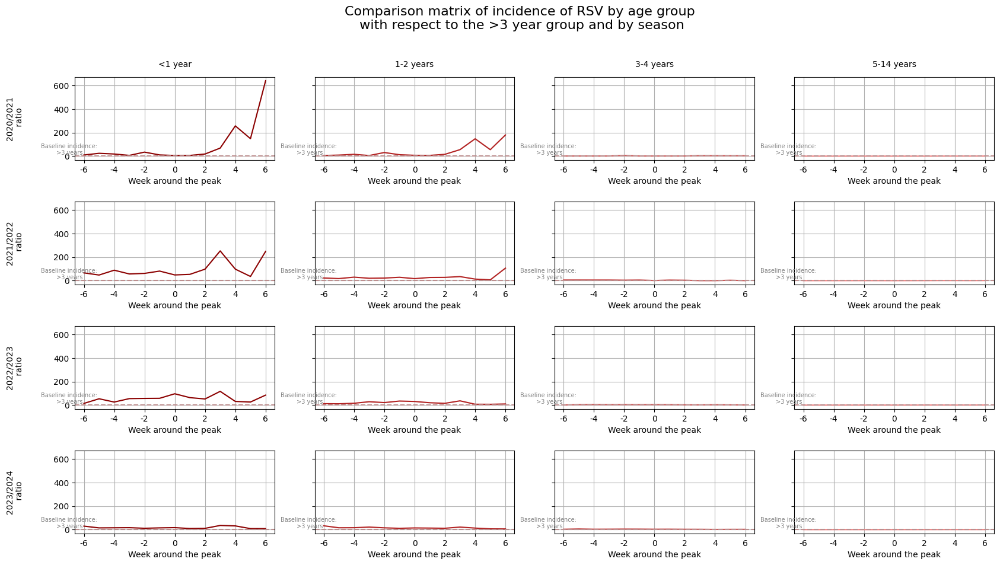

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort_sense_mes3a)
num_columnes=len(next(iter(temporada_cohort_sense_mes3a.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(20,10),sharey=True)
fig.suptitle('Comparison matrix of incidence of RSV by age group\n with respect to the >3 year group and by season', fontsize=16,y=1)
colors=['darkred','firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense_mes3a.items()):
  cohort_baseline=temporada_cohort_mes3a[temporada]['incid_>3a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_temp_12a, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
    #axs[i,j].set_yticks([0,1,2,3,4])

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline incidence:\n >3 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  etiq_column=etiquetes_column[j]
  axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort_ampli.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.3, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()


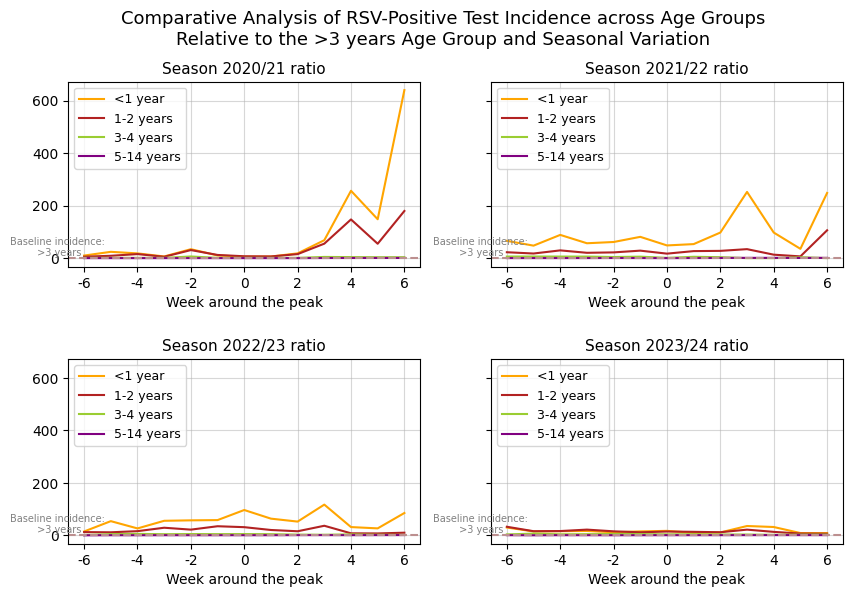

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparative Analysis of RSV-Positive Test Incidence across Age Groups\nRelative to the >3 years Age Group and Seasonal Variation', fontsize=13,y=1)
cohort_colors={'incid_0a':'orange','incid_1-2a':'firebrick','incid_3-4a':'yellowgreen','incid_5-14a':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a':'1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense_mes3a.items()):
  fila=i//2
  columna=i%2
  cohort_baseline=temporada_cohort_mes3a[temporada]['incid_>3a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for cohort,dades_cohort in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_3a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_temp_3a, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

  #axs[fila, columna].set_yscale('log')
  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  #plt.ylim(bottom=None,top=100)

  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline incidence:\n >3 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)


plt.subplots_adjust(hspace=0.5)

plt.show()

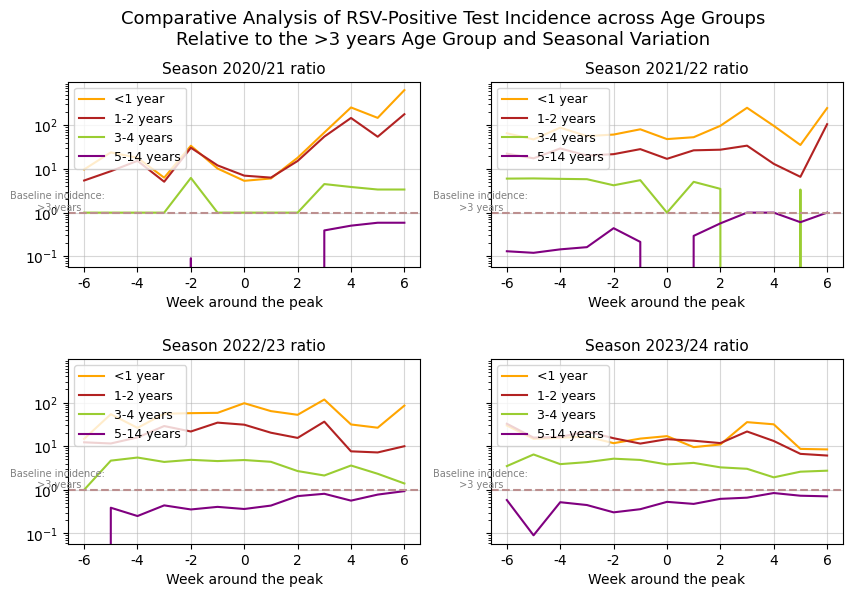

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparative Analysis of RSV-Positive Test Incidence across Age Groups\nRelative to the >3 years Age Group and Seasonal Variation', fontsize=13,y=1)
cohort_colors={'incid_0a':'orange','incid_1-2a':'firebrick','incid_3-4a':'yellowgreen','incid_5-14a':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a':'1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense_mes3a.items()):
  fila=i//2
  columna=i%2
  cohort_baseline=temporada_cohort_mes3a[temporada]['incid_>3a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for cohort,dades_cohort in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_3a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_temp_3a, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

  axs[fila, columna].set_yscale('log')
  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  #plt.ylim(bottom=None,top=100)

  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline incidence:\n >3 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)


plt.subplots_adjust(hspace=0.5)

plt.show()

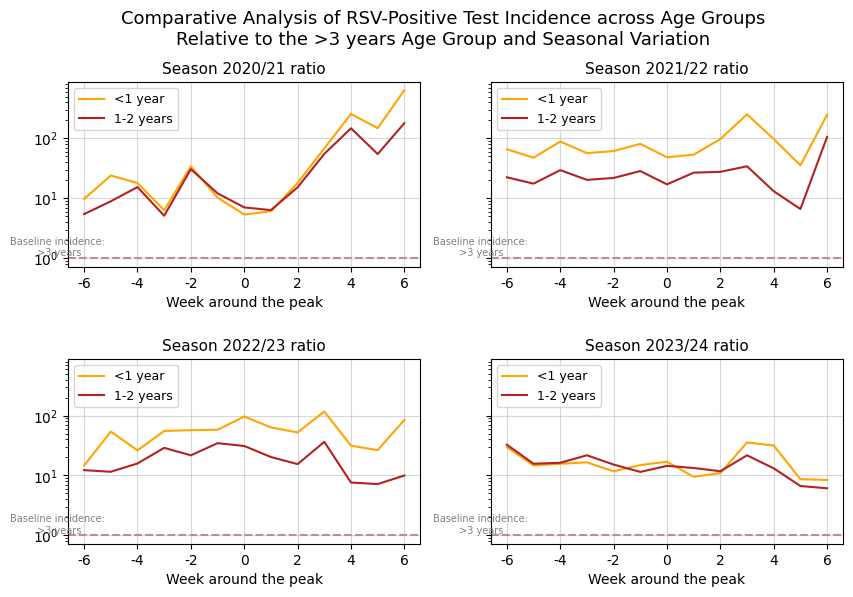

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.pyplot as plt

# Matriz de subplots
fig, axs = plt.subplots(2, 2, figsize=(10,6), gridspec_kw={'height_ratios': [2] * 2, 'width_ratios': [2] * 2}, sharey=True)
fig.suptitle('Comparative Analysis of RSV-Positive Test Incidence across Age Groups\nRelative to the >3 years Age Group and Seasonal Variation', fontsize=13, y=1)

# Colores y etiquetas de las series que queremos graficar
cohort_colors = {'incid_0a': 'orange', 'incid_1-2a': 'firebrick'}
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a': '1-2 years'}

# Automatización del cálculo y representación por temporada y cohorte
for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense_mes3a.items()):
    fila = i // 2
    columna = i % 2
    cohort_baseline = temporada_cohort_mes3a[temporada]['incid_>3a']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)

    for cohort, dades_cohort in dades_temp.items():
        if cohort in cohort_colors:  # Filtrar solo las series que queremos graficar
            # Ajustar índice
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            ratio_temp_3a = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

            axs[fila, columna].plot(ratio_temp_3a, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

    axs[fila, columna].set_yscale('log')
    axs[fila, columna].set_xlabel('Week around the peak', fontsize=10)
    axs[fila, columna].grid(True, alpha=0.5)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].xaxis.set_major_locator(FixedLocator([1, 3, 5, 7, 9, 11, 13]))
    axs[fila, columna].xaxis.set_major_formatter(FixedFormatter(['-6', '-4', '-2', '0', '2', '4', '6']))
    axs[fila, columna].legend(loc='upper left', fontsize=9)
    axs[fila, columna].set_title(f'Season {temporada}/{temporada - 1999} ratio', fontsize=11)
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')
    axs[fila, columna].text(0, 1, 'Baseline incidence:\n >3 years', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

plt.subplots_adjust(hspace=0.5)
plt.show()


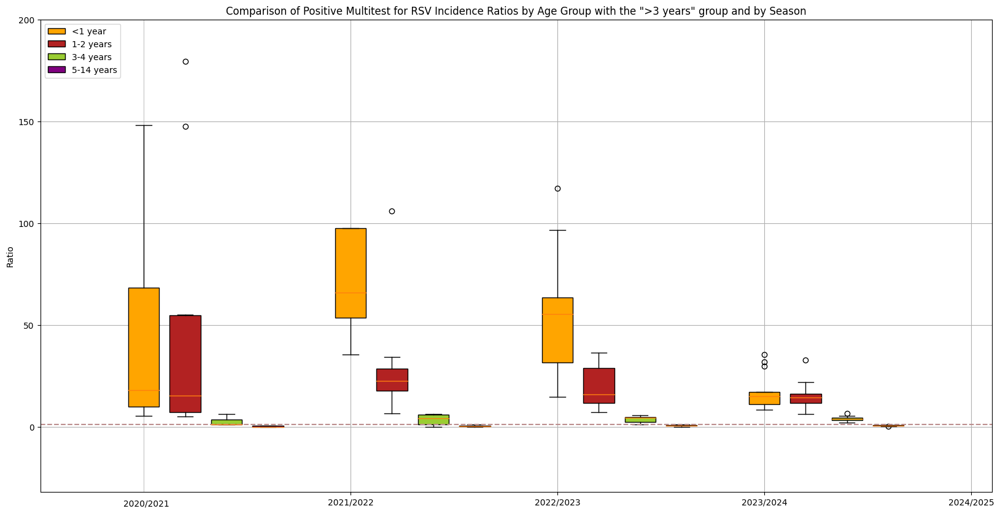

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense_mes3a.items()):
  cohort_baseline=temporada_cohort_mes3a[temporada]['incid_>3a']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

    box = ax.boxplot(ratio_temp_12a, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
    labels.append(f'{temporada}-{cohort}')
    legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020/2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -39))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of Positive Multitest for RSV Incidence Ratios by Age Group with the ">3 years" group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.ylim(bottom=None,top=200)
plt.grid(True)
plt.show()

### Prova: sistema sentinella d'adults > Taxa estimada

In [ ]:
vrs_sivic=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx",sheet_name=2)

In [ ]:
vrs_sivic['data']=pd.to_datetime(vrs_sivic['data'])
vrs_sivic.drop('mitjana mobil',axis=1,inplace=True)
vrs_sivic.drop('Unnamed: 4',axis=1,inplace=True)
vrs_sivic.drop('Unnamed: 5',axis=1,inplace=True)
vrs_sivic.head()

# A la fila d'index 12 no hi ha dada. Decideixo utilitzar una taxa estimada de 89 (mitjana punts)

,Unnamed: 0,data,taxa_estimada_sivic
0,0,2023-10-02,2.0
1,1,2023-10-09,1.0
2,2,2023-10-16,NaN
3,3,2023-10-23,7.0
4,4,2023-10-30,4.0


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim
pic_sivic = []
data_max=vrs_sivic['taxa_estimada_sivic'].idxmax()
start_pic=max(0,data_max-6)
end_pic=min(len(vrs),data_max+7)
rang_pic=vrs_sivic.iloc[start_pic:end_pic]

pic_sivic.append(rang_pic)

# Guardar en un dtframe nou
pic_sivic=pd.concat(pic_sivic)
pic_sivic.reset_index(drop=True,inplace=True)

# Enumerar les setmanes de la 1 a la 13
pic_sivic['setmana']=pic_sivic['Unnamed: 0']-4
#print(pic_sivic)

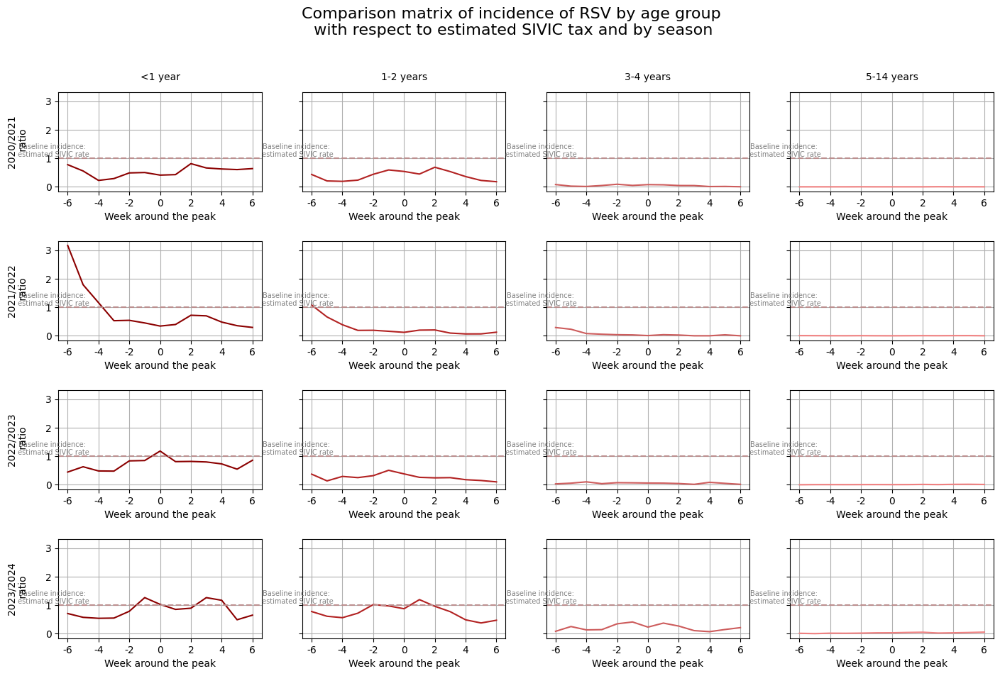

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort)
num_columnes=len(next(iter(temporada_cohort.values())))-1
fig,axs=plt.subplots(num_files,num_columnes,figsize=(17,10),sharey=True)
fig.suptitle('Comparison matrix of incidence of RSV by age group\n with respect to estimated SIVIC tax and by season', fontsize=16,y=1)
colors=['darkred','firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    if (cohort) != ('incid_total'):
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_baseline=pic_sivic['taxa_estimada_sivic']
      cohort_baseline.index=range(1,len(cohort_baseline)+1)

      ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

      axs[i,j].plot(ratio_sivic, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
      axs[i,j].set_xlabel('Week around the peak')
      axs[i,j].grid(True)
      axs[i,j].set_xticks([1,3,5,7,9,11,13])
      axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
      axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
      #axs[i,j].set_yticks([0,1,2,3,4])

      axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
      axs[i,j].text(0,1,'Baseline incidence:\n estimated SIVIC rate',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

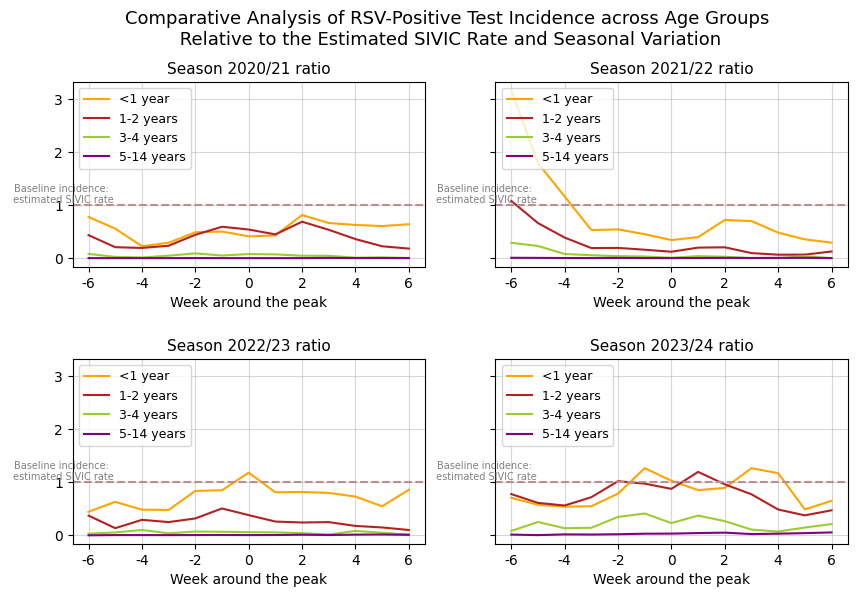

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparative Analysis of RSV-Positive Test Incidence across Age Groups\n Relative to the Estimated SIVIC Rate and Seasonal Variation', fontsize=13,y=1)
cohort_colors={'incid_0a':'orange','incid_1-2a':'firebrick','incid_3-4a':'yellowgreen','incid_5-14a':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a': '1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  fila=i//2
  columna=i%2
  for (cohort,dades_cohort) in dades_temp.items():
    if (cohort) != ('incid_total'):
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_baseline=pic_sivic['taxa_estimada_sivic']
      cohort_baseline.index=range(1,len(cohort_baseline)+1)

      ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

      axs[fila,columna].plot(ratio_sivic, label=cohort_legend_labels[cohort],color=cohort_colors[cohort])

  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)

  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline incidence:\n estimated SIVIC rate',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

plt.subplots_adjust(hspace=0.5)

plt.show()

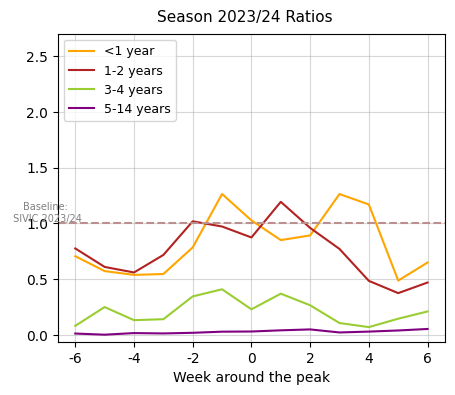

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

# Crear la figura y los subplots
fig, ax = plt.subplots(1, 1, figsize=(5,4))
fig.suptitle('Season 2023/24 Ratios', fontsize=11, y=0.94)

cohort_colors = {'incid_0a': 'orange', 'incid_1-2a': 'firebrick', 'incid_3-4a': 'yellowgreen', 'incid_5-14a': 'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a': '1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Acceder a los datos de la temporada 2023
temporada_to_plot = 2023

# Verificar si la temporada está en el diccionario
if temporada_to_plot in temporada_cohort:
    dades_temp = temporada_cohort[temporada_to_plot]

    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            # Ajustar index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_baseline = pic_sivic['taxa_estimada_sivic']
            cohort_baseline.index = range(1, len(cohort_baseline) + 1)

            ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

            ax.plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

   # ax.set_yscale('log')
    ax.set_xlabel('Week around the peak', fontsize=10)
    ax.grid(True, alpha=0.5)
    ax.set_xticks([1, 3, 5, 7, 9, 11, 13])
    ax.xaxis.set_major_locator(FixedLocator([1, 3, 5, 7, 9, 11, 13]))
    ax.xaxis.set_major_formatter(FixedFormatter(['-6', '-4', '-2', '0', '2', '4', '6']))

    ax.legend(loc='upper left', fontsize=9)
    #ax.set_title(f'Season {temporada_to_plot}/{temporada_to_plot-1999} ratio', fontsize=11)
    ax.axhline(y=1, color='rosybrown', linestyle='--')
    ax.text(0, 1, 'Baseline:\n SIVIC 2023/24', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

    plt.subplots_adjust(hspace=0.5)
    plt.ylim(bottom=None,top=2.7)
    plt.show()
else:
    print(f"La temporada {temporada_to_plot} no está presente en el diccionario temporada_cohort.")


#### Per la temp 2022/23

In [ ]:
vrs_sivic_2223=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx",sheet_name=3)

In [ ]:
vrs_sivic_2223['data']=pd.to_datetime(vrs_sivic_2223['data'])
vrs_sivic_2223.drop('mitjana mobil',axis=1,inplace=True)
vrs_sivic_2223.head()

,Unnamed: 0,data,taxa_estimada_sivic
0,0,2022-10-03,9
1,1,2022-10-10,13
2,2,2022-10-17,19
3,3,2022-10-24,33
4,4,2022-10-31,77


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim
pic_sivic_2223 = []
data_max=vrs_sivic_2223['taxa_estimada_sivic'].idxmax()
start_pic=max(0,data_max-6)
end_pic=min(len(vrs),data_max+7)
rang_pic=vrs_sivic_2223.iloc[start_pic:end_pic]

pic_sivic_2223.append(rang_pic)

# Guardar en un dtframe nou
pic_sivic_2223=pd.concat(pic_sivic_2223)
pic_sivic_2223.reset_index(drop=True,inplace=True)

# Enumerar les setmanes de la 1 a la 13
pic_sivic_2223['setmana']=pic_sivic_2223['Unnamed: 0']+1
print(pic_sivic_2223)

    Unnamed: 0       data  taxa_estimada_sivic  setmana
0            0 2022-10-03                    9        1
1            1 2022-10-10                   13        2
2            2 2022-10-17                   19        3
3            3 2022-10-24                   33        4
4            4 2022-10-31                   77        5
5            5 2022-11-07                   70        6
6            6 2022-11-14                   97        7
7            7 2022-11-21                   28        8
8            8 2022-11-28                   46        9
9            9 2022-12-05                   97       10
10          10 2022-12-12                   93       11
11          11 2022-12-19                   87       12
12          12 2022-12-26                   83       13


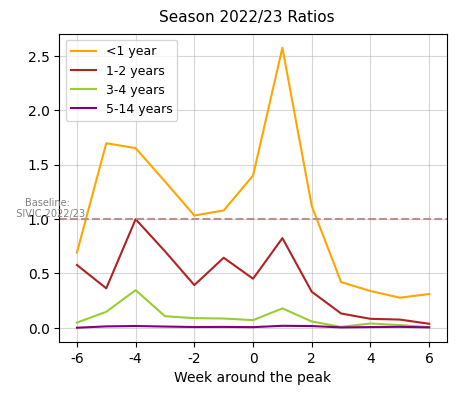

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

# Crear la figura y los subplots
fig, ax = plt.subplots(1, 1, figsize=(5,4))
fig.suptitle('Season 2022/23 Ratios', fontsize=11, y=0.94)

cohort_colors = {'incid_0a': 'orange', 'incid_1-2a': 'firebrick', 'incid_3-4a': 'yellowgreen', 'incid_5-14a': 'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'incid_0a': '<1 year', 'incid_1-2a': '1-2 years', 'incid_3-4a': '3-4 years', 'incid_5-14a': '5-14 years'}

# Acceder a los datos de la temporada 2023
temporada_to_plot = 2022

# Verificar si la temporada está en el diccionario
if temporada_to_plot in temporada_cohort:
    dades_temp = temporada_cohort[temporada_to_plot]

    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'incid_total':
            # Ajustar index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_baseline = pic_sivic_2223['taxa_estimada_sivic']
            cohort_baseline.index = range(1, len(cohort_baseline) + 1)

            ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)

            ax.plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

   # ax.set_yscale('log')
    ax.set_xlabel('Week around the peak', fontsize=10)
    ax.grid(True, alpha=0.5)
    ax.set_xticks([1, 3, 5, 7, 9, 11, 13])
    ax.xaxis.set_major_locator(FixedLocator([1, 3, 5, 7, 9, 11, 13]))
    ax.xaxis.set_major_formatter(FixedFormatter(['-6', '-4', '-2', '0', '2', '4', '6']))

    ax.legend(loc='upper left', fontsize=9)
    #ax.set_title(f'Season {temporada_to_plot}/{temporada_to_plot-1999} ratio', fontsize=11)
    ax.axhline(y=1, color='rosybrown', linestyle='--')
    ax.text(0, 1, 'Baseline:\n  SIVIC 2022/23', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

    plt.subplots_adjust(hspace=0.8)

    plt.show()
else:
    print(f"La temporada {temporada_to_plot} no está presente en el diccionario temporada_cohort.")


NameError: name 'temp_cohort_2223' is not defined

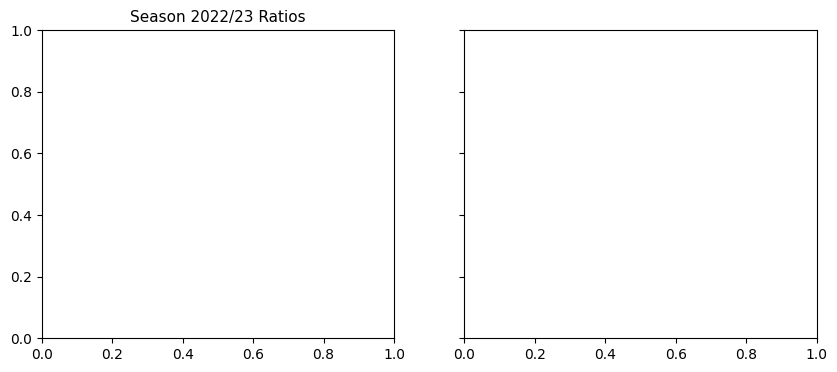

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

fig, axs = plt.subplots(1, 2, figsize=(10,4), sharey=True)

# Plot para temporada 2022/23
axs[0].set_title('Season 2022/23 Ratios', fontsize=11)
for cohort, dades_cohort in temp_cohort_2223.items():
    dades_cohort.index = range(1, len(dades_cohort) + 1)
    cohort_baseline = vrs_pic_2223['% positivitat']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)
    axs[0].plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
axs[0].set_xlabel('Week around the peak', fontsize=10)
axs[0].grid(True, alpha=0.5)
axs[0].set_xticks([1, 3, 5, 7, 9, 11, 13])
axs[0].set_xticklabels(['-6', '-4', '-2', '0', '2', '4', '6'])
axs[0].legend(loc='upper left', fontsize=9)
axs[0].axhline(y=1, color='rosybrown', linestyle='--')
axs[0].text(0, 1, 'Baseline:\n SIVIC rate 2022/23', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

# Plot para temporada 2023/24
axs[1].set_title('Season 2023/24 Ratios', fontsize=11)
for cohort, dades_cohort in temp_cohort_2324.items():
    dades_cohort.index = range(1, len(dades_cohort) + 1)
    cohort_baseline = vrs_pic_2324['% positivitat']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)
    axs[1].plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
axs[1].set_xlabel('Week around the peak', fontsize=10)
axs[1].grid(True, alpha=0.5)
axs[1].set_xticks([1, 3, 5, 7, 9, 11, 13])
axs[1].set_xticklabels(['-6', '-4', '-2', '0', '2', '4', '6'])
axs[1].legend(loc='upper right', fontsize=9)
axs[1].axhline(y=1, color='rosybrown', linestyle='--')
axs[1].text(0, 1, 'Baseline:\n SIVIC rate 2023/24', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

plt.subplots_adjust(wspace=0.2)  # Ajusta el espacio horizontal entre las gráficas
plt.show()


# Anàlisi % positivitat VRS

In [ ]:
vrs_plus=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_multitest.xlsx")
vrs_plus['Data']=pd.to_datetime(vrs_plus['Data'])

## % Màxims de cada temporada

In [ ]:
# Els pics de les temporades venen definits pels trobats anteriorment amb la incidència dels multitest.

In [ ]:
print(pic_temporades.columns)

Index(['Unnamed: 0', 'data', 'incid_0a', 'incid_1-2a', 'incid_3-4a',
       'incid_5-14a', 'incid_total', 'temporada', 'setmana'],
      dtype='object')


In [ ]:
# Trobar setmanes coincidents de cada temporada definida a l'anàlisi d'incidències VRS
  # Les dates coincideixen! Podem fer servir-les directament.
# Intent de merge (filtrar pics)
merged_df=pd.merge(vrs_plus,pic_temporades[['data']],left_on='Data',right_on='data',how='inner')
merged_df.drop(columns=['data'],inplace=True)
vrs_plus_pics=merged_df.copy()
vrs_plus_pics.head()

,Data,Incidencia_VRS_0,Incidencia_tests_0,Casos_VRS_0,Tests_fets_0,Positivitat_VRS_0,Incidencia_VRS_12,Incidencia_tests_12,Casos_VRS_12,Tests_fets_12,...,Incidencia_VRS_514,Incidencia_tests_514,Casos_VRS_514,Tests_fets_514,Positivitat_VRS_514,Incidencia_VRS,Incidencia_tests,Casos_VRS,Tests_fets,Positivitat_VRS
0,2021-05-16,10.855623,75.418013,5.428571,37.714286,14.393939,6.055350,46.729025,7.571429,58.428571,...,0.000000,0.754481,0.0,6.142857,0.00,2.072490,16.803424,14.571429,118.142857,12.333736
1,2021-05-23,19.425852,75.989361,9.714286,38.000000,25.563910,7.197869,37.703126,9.000000,47.142857,...,0.000000,0.666751,0.0,5.428571,0.00,2.824276,14.527749,19.857143,102.142857,19.440559
2,2021-05-30,14.569389,71.704247,7.285714,35.857143,20.318725,12.453457,45.472254,15.571429,56.857143,...,0.000000,0.614113,0.0,5.000000,0.00,3.413513,15.340490,24.000000,107.857143,22.251656
3,2021-06-06,26.853383,95.986562,13.428571,48.000000,27.976190,21.707860,80.547586,27.142857,100.714286,...,0.000000,1.596693,0.0,13.000000,0.00,6.623841,25.946762,46.571429,182.428571,25.528583
4,2021-06-13,46.279235,136.837986,23.142857,68.428571,33.820459,41.701942,106.825523,52.142857,133.571429,...,0.122823,1.965160,1.0,16.000000,6.25,12.556851,36.959405,88.285714,259.857143,33.974711


In [ ]:
# Atribuir temporada a cada fila
def temporada (Data):
  if Data.month >= 9:
    return Data.year
  else:
    return Data.year-1

vrs_plus_pics['Temporada']=vrs_plus_pics['Data'].apply(temporada)

In [ ]:
# Enumerar les setmanes de la 1 a la 13 per cada temporada
vrs_plus_pics['Setmana']=vrs_plus_pics.groupby('Temporada').cumcount()+1
#print(vrs_plus_pics)

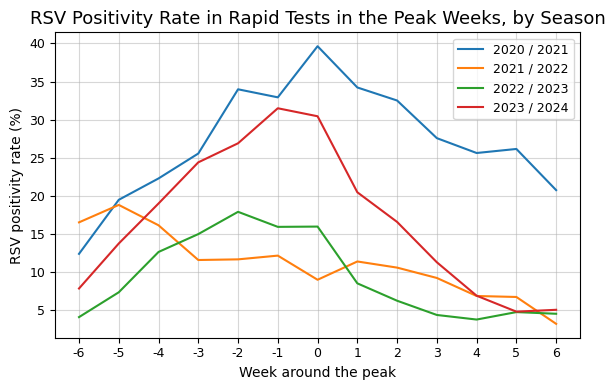

In [ ]:
# Representació pics superposats
plt.figure(figsize=(6,4))
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
for i, (temporada,dades) in enumerate(vrs_plus_pics.groupby('Temporada')):
  plt.plot(dades['Setmana'],dades['Positivitat_VRS'],label=f'{temporada} / {temporada+1}')
  plt.xticks(dades['Setmana'],etiquetes)

plt.tick_params(axis='both', which='major', labelsize=9)
plt.title('RSV Positivity Rate in Rapid Tests in the Peak Weeks, by Season', fontsize=13)
plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('RSV positivity rate (%)', fontsize=10)
plt.legend(fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()
plt.show()

## % Pic mitjà pre-nirse (per cada franja d'edat)

In [ ]:
# Filtre anys previs
plus_pic_prenirse=vrs_plus_pics[(vrs_plus_pics['Temporada']<=2022)]

In [ ]:
# Preparar dataframe
prom_plus_pic_prenirse=plus_pic_prenirse.groupby('Setmana').mean()
prom_plus_pic_prenirse.drop('Incidencia_VRS_0',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_tests_0',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Casos_VRS_0',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Tests_fets_0',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_VRS_12',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_tests_12',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Casos_VRS_12',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Tests_fets_12',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_VRS_34',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_tests_34',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Casos_VRS_34',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Tests_fets_34',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_VRS_514',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_tests_514',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Casos_VRS_514',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Tests_fets_514',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_VRS',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Incidencia_tests',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Casos_VRS',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Tests_fets',axis=1,inplace=True)
prom_plus_pic_prenirse.drop('Temporada',axis=1,inplace=True)
print(prom_plus_pic_prenirse)

              Data  Positivitat_VRS_0  Positivitat_VRS_12  Positivitat_VRS_34  \
Setmana                                                                         
1       2022-01-02          16.292770           12.841482            7.489450   
2       2022-01-09          24.822102           15.193112           10.607372   
3       2022-01-16          22.625552           21.717818           10.259208   
4       2022-01-23          24.579770           20.944342           14.543821   
5       2022-01-30          29.889436           25.484054           15.388102   
6       2022-02-06          26.530808           27.387822            9.015677   
7       2022-02-13          28.891692           27.979038           11.883743   
8       2022-02-20          25.006098           21.658182           14.366938   
9       2022-02-27          25.687460           18.565989            9.140489   
10      2022-03-06          20.584476           15.699781            5.124104   
11      2022-03-13          

In [ ]:
# Càlcul dels intervals de confiança del 90%
if 'Data' in plus_pic_prenirse.columns:
  plus_pic_prenirse=plus_pic_prenirse.drop('Data',axis=1)

from scipy import stats
setmanes=plus_pic_prenirse.groupby('Setmana')
promitjos=setmanes.mean()

def conf_intervals(plus_pic_prenirse):
  mean=plus_pic_prenirse.mean()
  n=len(plus_pic_prenirse)
  stderr=stats.sem(plus_pic_prenirse)
  interval=stderr * stats.t.ppf((1+0.90)/2,n-1)
  return mean,mean-interval,mean+interval

intervals=setmanes.aggregate(lambda x: conf_intervals(x))
resultats=pd.concat([promitjos,intervals.rename(columns=lambda x: x+'_ci')],axis=1)
#print(resultats)

# Guardar dades en un dataframe
resultats_f=pd.DataFrame()
  # Separar tuples en columnes
for columna in resultats.columns:
   if not columna.endswith('_ci'):
     continue
   dades_sep=resultats[columna].apply(pd.Series)
   dades_sep.columns=[f'{columna}_{i}' for i in range(len(dades_sep.columns))]
   resultats_f=pd.concat([resultats_f,dades_sep],axis=1)

resultats_f.head()

,Incidencia_VRS_0_ci_0,Incidencia_VRS_0_ci_1,Incidencia_VRS_0_ci_2,Incidencia_tests_0_ci_0,Incidencia_tests_0_ci_1,Incidencia_tests_0_ci_2,Casos_VRS_0_ci_0,Casos_VRS_0_ci_1,Casos_VRS_0_ci_2,Tests_fets_0_ci_0,...,Casos_VRS_ci_2,Tests_fets_ci_0,Tests_fets_ci_1,Tests_fets_ci_2,Positivitat_VRS_ci_0,Positivitat_VRS_ci_1,Positivitat_VRS_ci_2,Temporada_ci_0,Temporada_ci_1,Temporada_ci_2
Setmana,,,,,,,,,,,,,,,,,,,,,
1,20.451313,-14.556560,55.459186,106.034713,3.658434,208.410992,10.238095,-7.249233,27.725424,53.142857,...,58.457039,217.190476,68.253621,366.127332,10.941375,0.241542,21.641208,2021.0,2019.314146,2022.685854
2,34.678998,-6.090941,75.448937,137.928181,-15.272798,291.129159,17.380952,-2.955583,37.717487,69.142857,...,88.817580,257.380952,14.109731,500.652174,15.163026,3.640047,26.686004,2021.0,2019.314146,2022.685854
3,40.454691,-12.521031,93.430414,171.201995,-30.502184,372.906173,20.285714,-6.165749,46.737178,85.857143,...,95.213799,327.380952,-1.271319,656.033224,16.974950,8.722386,25.227513,2021.0,2019.314146,2022.685854
4,40.122993,20.338958,59.907029,179.139843,14.996812,343.282874,20.142857,10.175025,30.110689,89.857143,...,62.517355,347.666667,94.409369,600.923964,17.328776,5.017174,29.640378,2021.0,2019.314146,2022.685854
5,59.043881,28.964843,89.122920,211.229938,84.050849,338.409028,29.666667,14.218684,45.114649,106.000000,...,109.174223,415.142857,188.237307,642.048408,21.148483,1.694923,40.602043,2021.0,2019.314146,2022.685854


In [ ]:
# Convertir a 0 els valors negatius
def conv_0(x):
  if x<0:
    return 0
  else:
    return x

resultats_f=resultats_f.applymap(conv_0)

# Ordenar dataframe
resultats_f.drop('Temporada_ci_0',axis=1,inplace=True)
resultats_f.drop('Temporada_ci_1',axis=1,inplace=True)
resultats_f.drop('Temporada_ci_2',axis=1,inplace=True)
pics_promig_prenirse=resultats_f

### % Representacions dels pics superposats

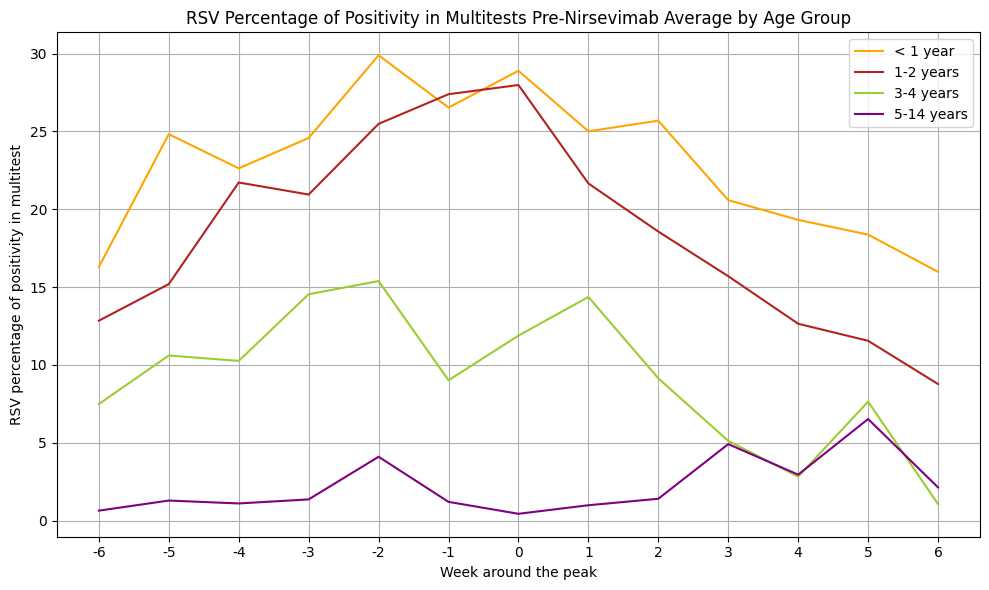

In [ ]:
# Representació dels pics superposats (un eix) (mitjana 2020,2021,2022)
plt.figure(figsize=(10,6))
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_0_ci_0'],label='< 1 year',color='orange')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_12_ci_0'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_34_ci_0'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_514_ci_0'],label='5-14 years',color='purple')

plt.xlabel('Week around the peak')
plt.ylabel('RSV percentage of positivity in multitest')
etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)

plt.title('RSV Percentage of Positivity in Multitests Pre-Nirsevimab Average by Age Group')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

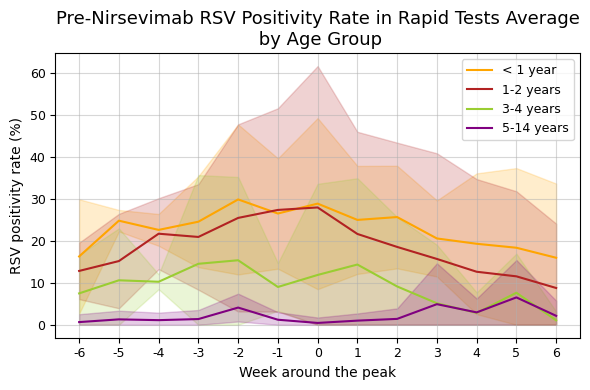

In [ ]:
# Representació dels pics superposats amb IC 90% (un eix) (mitjana 2020,2021,2022)
plt.figure(figsize=(6,4))
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_0_ci_0'],label='< 1 year',color='orange')
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_0_ci_1'],pics_promig_prenirse['Positivitat_VRS_0_ci_2'], color='orange',alpha=0.2)
plt.xlabel('Week around the peak', fontsize=10)
plt.ylabel('RSV positivity rate (%)', fontsize=10)

plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_12_ci_0'],label='1-2 years',color='firebrick')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_34_ci_0'],label='3-4 years',color='yellowgreen')
plt.plot(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_514_ci_0'],label='5-14 years',color='purple')
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_12_ci_1'],pics_promig_prenirse['Positivitat_VRS_12_ci_2'], color='firebrick',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_34_ci_1'],pics_promig_prenirse['Positivitat_VRS_34_ci_2'], color='yellowgreen',alpha=0.2)
plt.fill_between(pics_promig_prenirse.index,pics_promig_prenirse['Positivitat_VRS_514_ci_1'],pics_promig_prenirse['Positivitat_VRS_514_ci_2'], color='purple',alpha=0.2)

etiquetes=['-6','-5','-4','-3','-2','-1','0','1','2','3','4','5','6']
plt.xticks(pics_promig_prenirse.index,etiquetes)
plt.tick_params(axis='both', which='major', labelsize=9)

plt.title('Pre-Nirsevimab RSV Positivity Rate in Rapid Tests Average\n by Age Group', fontsize=13)
plt.legend(fontsize=9)
plt.grid(True, alpha=0.5)
plt.tight_layout()

plt.show()

## % Primera comparació (amb la mitjana pre-nirse)

In [ ]:
temporades=vrs_plus_pics['Temporada'].unique()
# Diccionari dataframes
temporada_cohort={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=vrs_plus_pics[vrs_plus_pics['Temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in vrs_plus_pics.columns:
    if columna.startswith('Positivitat_VRS_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort[temporada]=dades_cohort

In [ ]:
pics_promig_prenirse.head()

,Incidencia_VRS_0_ci_0,Incidencia_VRS_0_ci_1,Incidencia_VRS_0_ci_2,Incidencia_tests_0_ci_0,Incidencia_tests_0_ci_1,Incidencia_tests_0_ci_2,Casos_VRS_0_ci_0,Casos_VRS_0_ci_1,Casos_VRS_0_ci_2,Tests_fets_0_ci_0,...,Incidencia_tests_ci_2,Casos_VRS_ci_0,Casos_VRS_ci_1,Casos_VRS_ci_2,Tests_fets_ci_0,Tests_fets_ci_1,Tests_fets_ci_2,Positivitat_VRS_ci_0,Positivitat_VRS_ci_1,Positivitat_VRS_ci_2
Setmana,,,,,,,,,,,,,,,,,,,,,
1,20.451313,0.000000,55.459186,106.034713,3.658434,208.410992,10.238095,0.000000,27.725424,53.142857,...,52.667094,23.952381,0.000000,58.457039,217.190476,68.253621,366.127332,10.941375,0.241542,21.641208
2,34.678998,0.000000,75.448937,137.928181,0.000000,291.129159,17.380952,0.000000,37.717487,69.142857,...,71.749303,37.714286,0.000000,88.817580,257.380952,14.109731,500.652174,15.163026,3.640047,26.686004
3,40.454691,0.000000,93.430414,171.201995,0.000000,372.906173,20.285714,0.000000,46.737178,85.857143,...,94.276786,50.285714,5.357630,95.213799,327.380952,0.000000,656.033224,16.974950,8.722386,25.227513
4,40.122993,20.338958,59.907029,179.139843,14.996812,343.282874,20.142857,10.175025,30.110689,89.857143,...,86.301614,52.952381,43.387407,62.517355,347.666667,94.409369,600.923964,17.328776,5.017174,29.640378
5,59.043881,28.964843,89.122920,211.229938,84.050849,338.409028,29.666667,14.218684,45.114649,106.000000,...,93.004064,77.952381,46.730539,109.174223,415.142857,188.237307,642.048408,21.148483,1.694923,40.602043


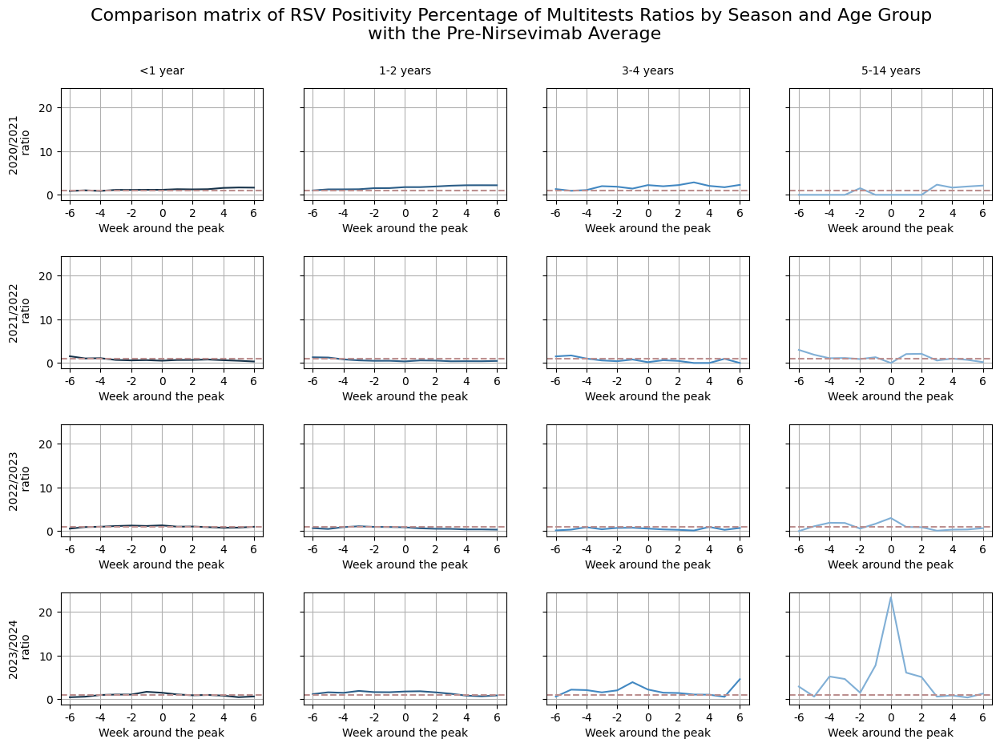

In [ ]:
# Matriu plots
num_files=len(temporada_cohort)
num_columnes=4
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,10),sharey=True)
fig.suptitle('Comparison matrix of RSV Positivity Percentage of Multitests Ratios by Season and Age Group\n with the Pre-Nirsevimab Average', fontsize=16,y=0.98)
colors=['#17334a','#2b5d87','#4288c2','#80afd6']
etiquetes=['-6','-4','-2','0','2','4','6']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    if (cohort) != ('Positivitat_VRS'):
      cohort_promig_prenirse=prom_plus_pic_prenirse[cohort]
      # Ajust index
      dades_cohort.index=range(1,len(dades_cohort)+1)
      cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)

      ratio_temp_coh=dades_cohort.div(cohort_promig_prenirse.squeeze(),axis=0)

      axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
      axs[i,j].set_xlabel('Week around the peak')
      axs[i,j].grid(True)
      axs[i,j].set_xticks([1,3,5,7,9,11,13])
      axs[i,j].set_xticklabels(etiquetes)
      axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

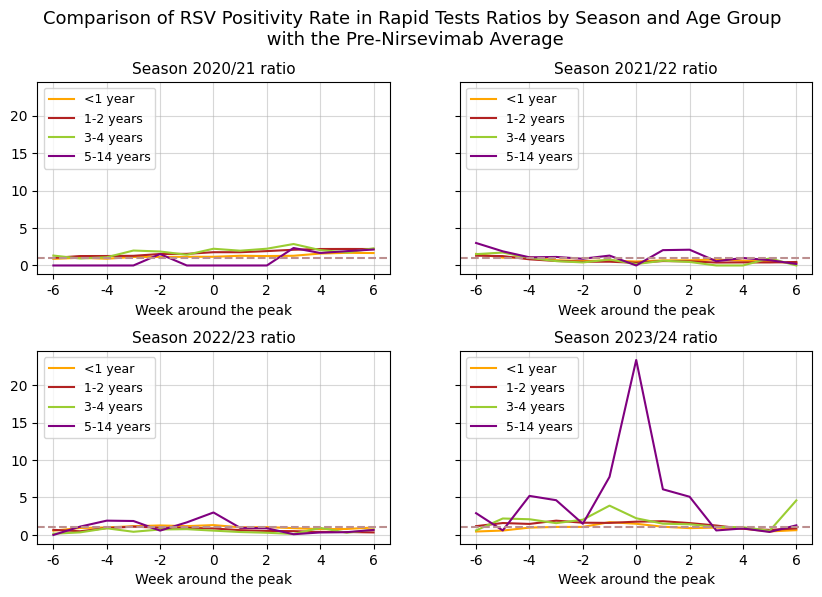

In [ ]:
# Matriu plots (1 per temporada)
fig, axs = plt.subplots(2, 2, figsize=(10, 6), gridspec_kw={'height_ratios': [2] * 2, 'width_ratios': [2] * 2}, sharey=True)
fig.suptitle('Comparison of RSV Positivity Rate in Rapid Tests Ratios by Season and Age Group\n with the Pre-Nirsevimab Average', fontsize=13, y=1)

# Colores para las distintas cohortes
cohort_colors = {'Positivitat_VRS_0': 'orange', 'Positivitat_VRS_12': 'firebrick', 'Positivitat_VRS_34': 'yellowgreen', 'Positivitat_VRS_514': 'purple'}
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    fila = i // 2
    columna = i % 2
    for cohort, dades_cohort in dades_temp.items():
        if cohort != ('Positivitat_VRS'):
            cohort_promig_prenirse = prom_plus_pic_prenirse[cohort]
            # Ajust index
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prenirse.index = range(1, len(cohort_promig_prenirse) + 1)

            ratio_temp_coh = dades_cohort.div(cohort_promig_prenirse.squeeze(), axis=0)
            # Agregar una línea para representar los datos en el subplot
            axs[fila, columna].plot(ratio_temp_coh, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])

    axs[fila, columna].set_xlabel('Week around the peak', fontsize=10)
    axs[fila, columna].grid(True,alpha=0.5)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].set_xticklabels(etiquetas, fontsize=10)
    axs[fila, columna].legend(loc='upper left', fontsize=9)
    axs[fila, columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

# Agregar leyenda para toda la matriz con etiquetas personalizadas y colores correspondientes
#fig.legend(handles=line_labels, labels=custom_labels, loc='upper right', bbox_to_anchor=(1, 0.95))

plt.subplots_adjust(hspace=0.4)

plt.show()

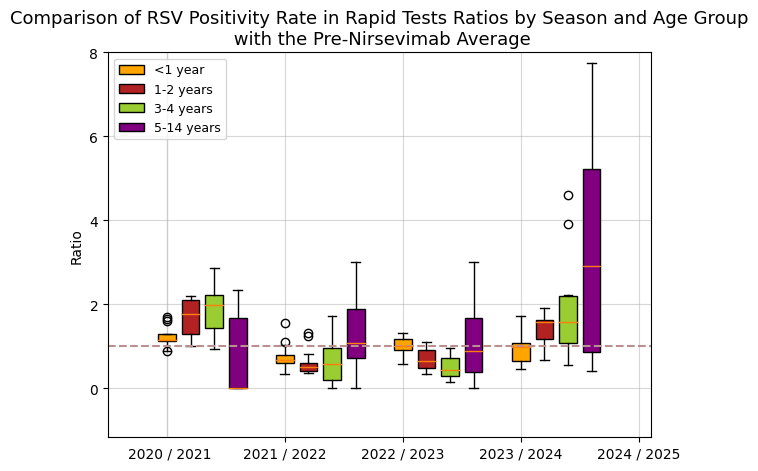

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(7,5))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
    for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
        if cohort != 'Positivitat_VRS':
          cohort_promig_prenirse=prom_plus_pic_prenirse[cohort]
          dades_cohort.index=range(1,len(dades_cohort)+1)
          cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)
          ratio_temp_coh=dades_cohort.div(cohort_promig_prenirse.squeeze(),axis=0)

          #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

          box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1} / {temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio', fontsize=10)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020 / 2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.03  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -1.65))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Rate in Rapid Tests Ratios by Season and Age Group\n with the Pre-Nirsevimab Average', fontsize=13)
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left', fontsize=9)
plt.grid(True, alpha=0.5)
plt.ylim(bottom=None,top=8)
plt.show()

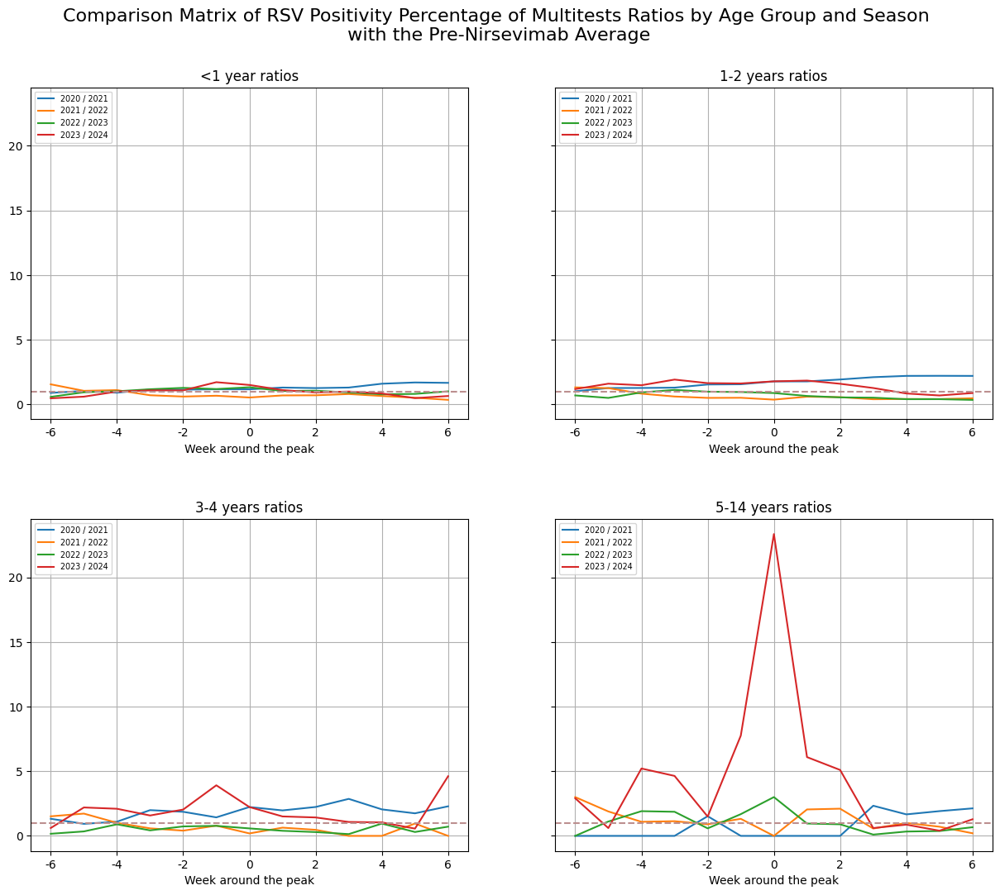

In [ ]:
# Matriu plots (1 per cohort)
fig, axs = plt.subplots(2, 2, figsize=(15, 12), gridspec_kw={'height_ratios': [3.5] * 2, 'width_ratios': [3.5] * 2},sharey=True)
fig.suptitle('Comparison Matrix of RSV Positivity Percentage of Multitests Ratios by Age Group and Season\n with the Pre-Nirsevimab Average', fontsize=16, y=0.96)
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())  # Usamos 2020 como ejemplo, pero podríamos usar cualquier año

# Automatització càlcul i representació per cohort i temp
for i, cohorte in enumerate(cohortes):
    fila = i // 2
    columna = i % 2
    if cohorte != 'Positivitat_VRS':
        for temporada, dades_temp in temporada_cohort.items():
            cohort_promig_prenirse = prom_plus_pic_prenirse[cohorte]
            # Ajustar el índice del DataFrame de la temporada actual
            dades_temp[cohorte].index = range(1, len(dades_temp[cohorte]) + 1)
            cohort_promig_prenirse.index = range(1, len(cohort_promig_prenirse) + 1)

            ratio_temp_coh = dades_temp[cohorte].div(cohort_promig_prenirse.squeeze(), axis=0)
            # Agregar una línea para representar los datos en el subplot
            axs[fila, columna].plot(ratio_temp_coh, label=f'{temporada} / {temporada+1}')

        axs[fila, columna].set_xlabel('Week around the peak')
        axs[fila, columna].grid(True)
        axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
        axs[fila, columna].set_xticklabels(etiquetas)
        axs[fila, columna].legend(loc='upper left', fontsize='x-small')
        axs[fila, columna].set_title(f'{cohort_legend_labels[cohorte]} ratios')
        axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

plt.subplots_adjust(hspace=0.3)

plt.show()


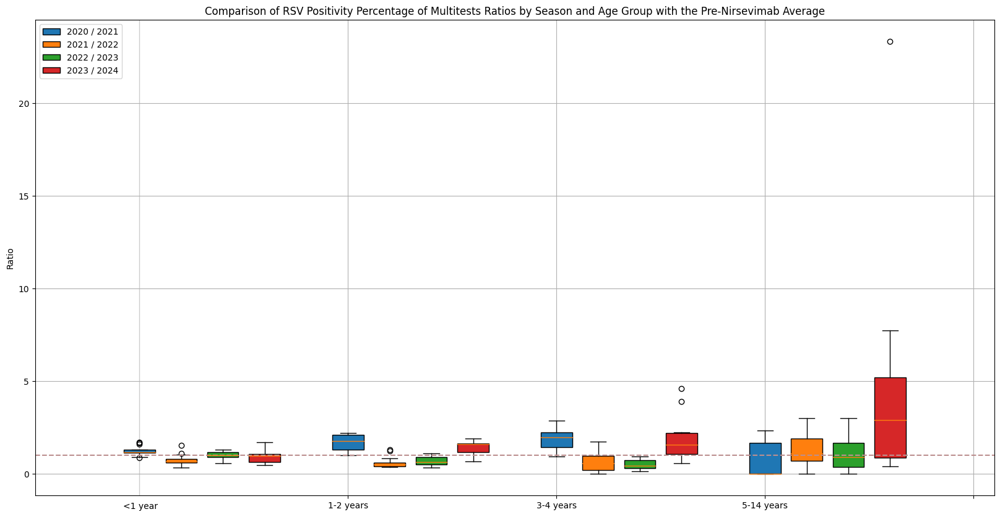

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#1f77b4','#ff7f0e','#2ca02c','#d62728']
legend_labels=[]
xlabels=['1-2 years','3-4 years','5-14 years','']

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())

for i, cohorte in enumerate(cohortes):
    for j,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
        if cohort != 'Positivitat_VRS':
          cohort_promig_prenirse=prom_plus_pic_prenirse[cohorte]
          dades_temp[cohorte].index=range(1,len(dades_temp[cohorte])+1)
          cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)
          ratio_temp_coh=dades_temp[cohorte].div(cohort_promig_prenirse.squeeze(),axis=0)

          box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True,boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels(xlabels)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '<1 year'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -1.9))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Season and Age Group with the Pre-Nirsevimab Average')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['2020 / 2021', '2021 / 2022', '2022 / 2023', '2023 / 2024']

ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.show()

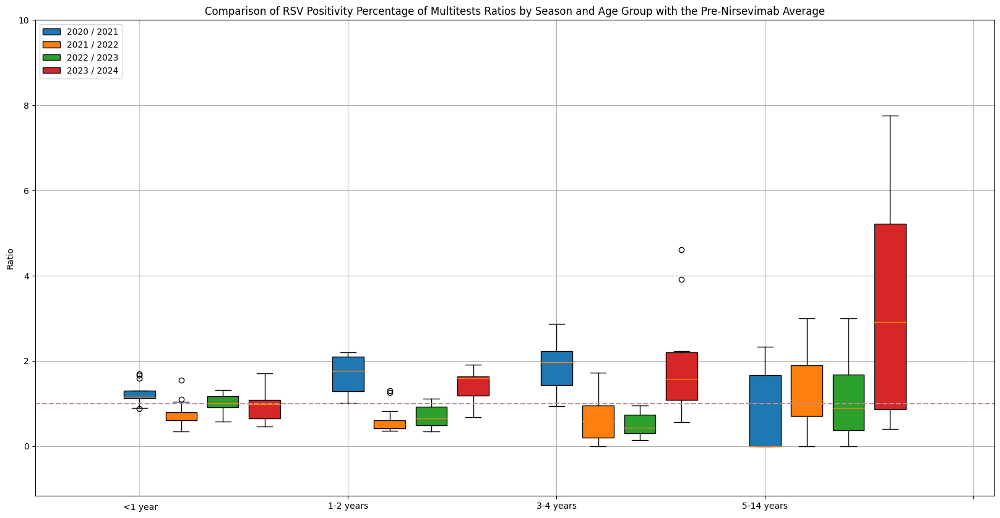

In [ ]:
# Mateix diagrama però sense el outlier més extrem

import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#1f77b4','#ff7f0e','#2ca02c','#d62728']
legend_labels=[]
xlabels=['1-2 years','3-4 years','5-14 years','']

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())

for i, cohorte in enumerate(cohortes):
    for j,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
        if cohort != 'Positivitat_VRS':
          cohort_promig_prenirse=prom_plus_pic_prenirse[cohorte]
          dades_temp[cohorte].index=range(1,len(dades_temp[cohorte])+1)
          cohort_promig_prenirse.index=range(1,len(cohort_promig_prenirse)+1)
          ratio_temp_coh=dades_temp[cohorte].div(cohort_promig_prenirse.squeeze(),axis=0)

          box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True,boxprops=dict(facecolor=colors[j]))
          labels.append(f'{temporada}-{cohort}')
          legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels(xlabels)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '<1 year'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -1.5))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Season and Age Group with the Pre-Nirsevimab Average')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['2020 / 2021', '2021 / 2022', '2022 / 2023', '2023 / 2024']

ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.ylim(bottom=None,top=10)
plt.show()

In [ ]:
from scipy import stats

# Crear un diccionario anidado para almacenar los datos de ratio_temp_coh para cada cohorte y temporada
datos_por_cohorte_temporada = {}

# Iterar sobre los datos y almacenar los datos de ratio_temp_coh para cada cohorte y temporada
for temporada, dades_temp in temporada_cohort.items():
    datos_por_cohorte_temporada[temporada] = {}
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'Positivitat_VRS':
            cohort_promig_prenirse = prom_plus_pic_prenirse[cohort]
            dades_cohort.index = range(1, len(dades_cohort) + 1)
            cohort_promig_prenirse.index = range(1, len(cohort_promig_prenirse) + 1)
            ratio_temp_coh = dades_cohort.div(cohort_promig_prenirse.squeeze(), axis=0)

            # Almacenar los datos de ratio_temp_coh para cada cohorte y temporada en el diccionario anidado
            if cohort not in datos_por_cohorte_temporada[temporada]:
                datos_por_cohorte_temporada[temporada][cohort] = []
            datos_por_cohorte_temporada[temporada][cohort].append(ratio_temp_coh)

#print(datos_por_cohorte_temporada)

In [ ]:
# ANOVA pels ratis
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np

# Recopilar los datos en un formato adecuado para el análisis de ANOVA
data = []
groups = []
for temporada, dades_temp in datos_por_cohorte_temporada.items():
    for cohort, dades_cohort in dades_temp.items():
        if cohort != 'Positivitat_VRS':
            cohort_promig_prenirse = prom_plus_pic_prenirse[cohort]
            for dades in dades_cohort:
                ratio_temp_coh = dades.values.squeeze() / cohort_promig_prenirse.squeeze()
                data.extend(ratio_temp_coh)
                groups.extend([cohort] * len(ratio_temp_coh))

# Convertir nombres de cohortes a índices numéricos
unique_groups = np.unique(groups)
group_indices = {group: i for i, group in enumerate(unique_groups)}
numeric_groups = [group_indices[group] for group in groups]

# Realizar ANOVA
anova_result = f_oneway(data, numeric_groups)

# Imprimir los resultados del ANOVA
print("Resultados del ANOVA:")
print("Valor F:", anova_result.statistic)
print("Valor p:", anova_result.pvalue)

# Realizar pruebas post hoc si el ANOVA muestra diferencias significativas
if anova_result.pvalue < 0.05:
    # Realizar pruebas post hoc (usando Tukey HSD)
    posthoc = pairwise_tukeyhsd(data, numeric_groups)

    # Imprimir los resultados de las pruebas post hoc
    print("\nResultados de las pruebas post hoc:")
    print(posthoc)


Resultados del ANOVA:
Valor F: 9.743208725127557
Valor p: 0.0019260337913931424

Resultados de las pruebas post hoc:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1   0.0211    1.0 -1.8647  1.907  False
     0      2    0.224 0.9899 -1.6618 2.1099  False
     0      3   2.1532 0.0181  0.2673  4.039   True
     1      2   0.2029 0.9924  -1.683 2.0888  False
     1      3    2.132 0.0197  0.2462 4.0179   True
     2      3   1.9291 0.0428  0.0433  3.815   True
---------------------------------------------------


## % Segona comparació (franja de referència)

In [ ]:
#print(temporada_cohort)

### % Prova 1-2 anys

In [ ]:
# Creació llista sense les dades de la franja de referència (1-2)
# Queda un diccionari amb les dades dels cohorts (% positivitat) no referència, i per temporada
temporada_cohort_sense12={}
cohorts_eliminats=['Positivitat_VRS_12']
for temporada,dades_temp in temporada_cohort.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_sense12[temporada]=noves_dades_temp

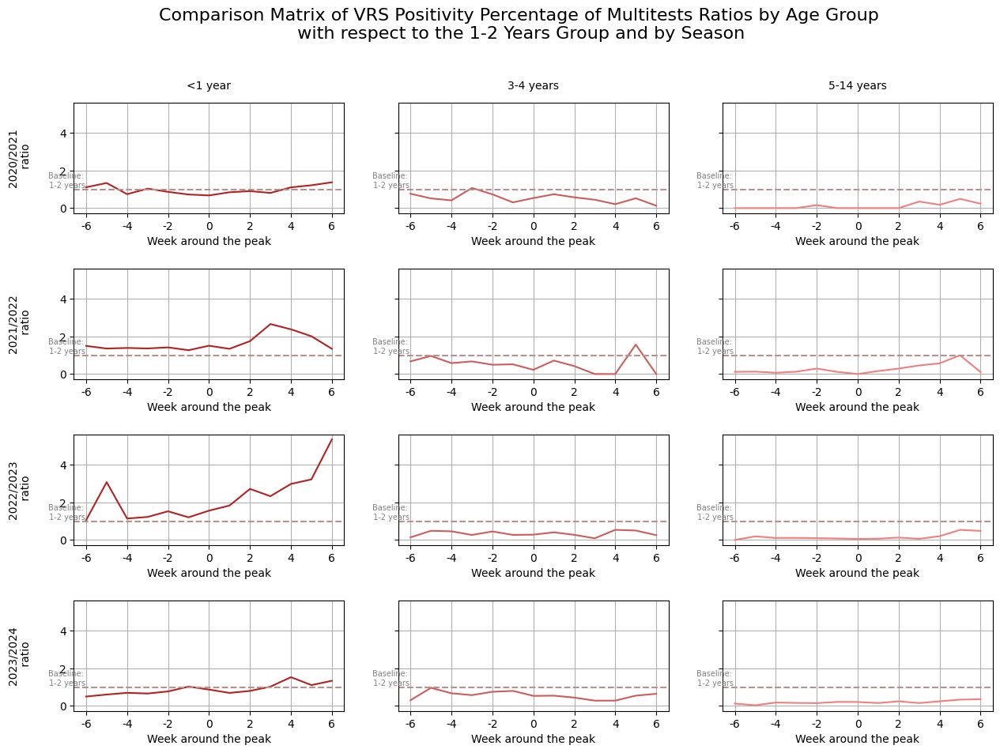

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort_sense12)
num_columnes=len(next(iter(temporada_cohort_sense12.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(15,10), sharey=True)
fig.suptitle('Comparison Matrix of VRS Positivity Percentage of Multitests Ratios by Age Group\n with respect to the 1-2 Years Group and by Season', fontsize=16,y=1)
colors=['firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense12.items()):
  cohort_baseline=temporada_cohort[temporada]['Positivitat_VRS_12']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_temp_12a,color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline:\n 1-2 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  etiq_column=etiquetes_column[j]
  axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

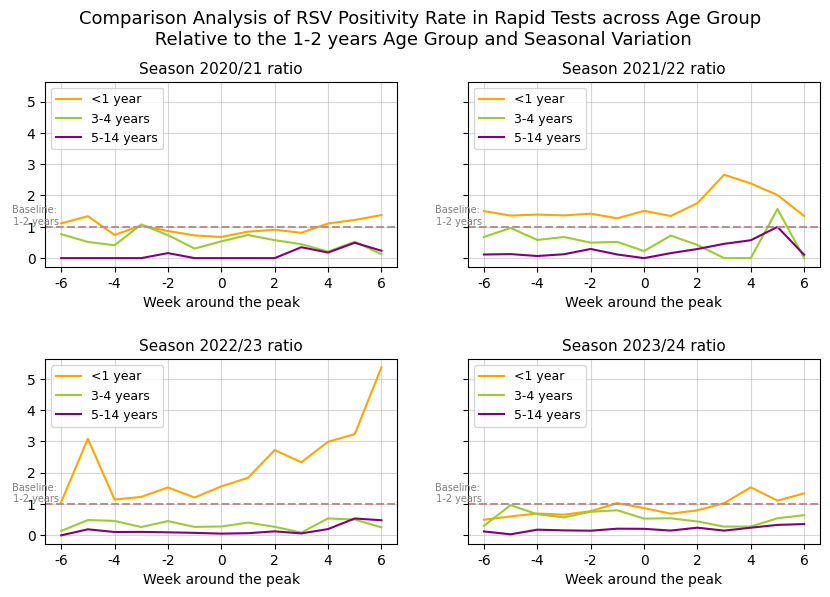

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparison Analysis of RSV Positivity Rate in Rapid Tests across Age Group\n Relative to the 1-2 years Age Group and Seasonal Variation', fontsize=13,y=1)

cohort_colors={'Positivitat_VRS_0':'orange','Positivitat_VRS_34':'yellowgreen','Positivitat_VRS_514':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense12.items()):
  fila=i//2
  columna=i%2
  cohort_baseline=temporada_cohort[temporada]['Positivitat_VRS_12']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for cohort,dades_cohort in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_temp_12a, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline:\n 1-2 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)


plt.subplots_adjust(hspace=0.5)

plt.show()

Barres d'error amb intervals de confiança

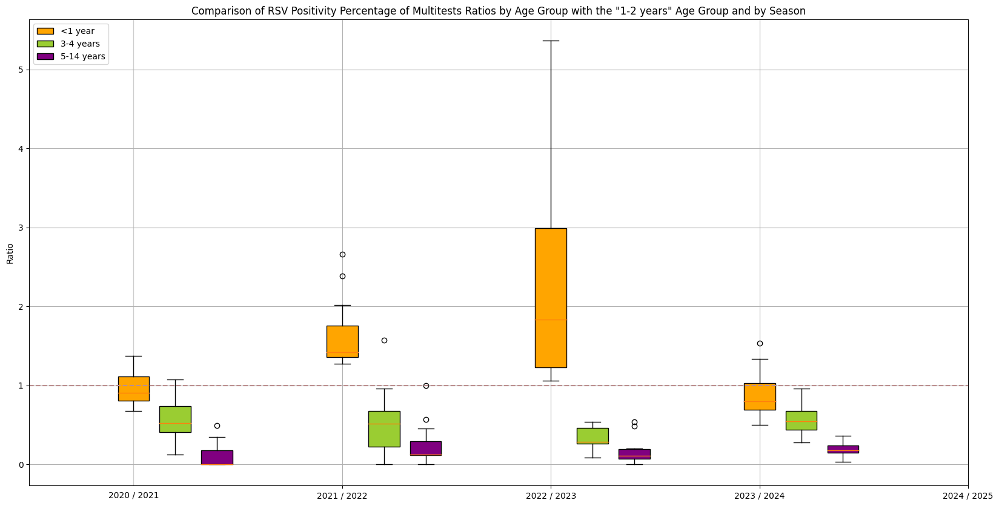

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense12.items()):
  cohort_baseline=temporada_cohort[temporada]['Positivitat_VRS_12']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)
  for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    box = ax.boxplot(ratio_temp_12a, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
    labels.append(f'{temporada}-{cohort}')
    legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1} / {temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020 / 2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -0.42))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "1-2 years" Age Group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.show()

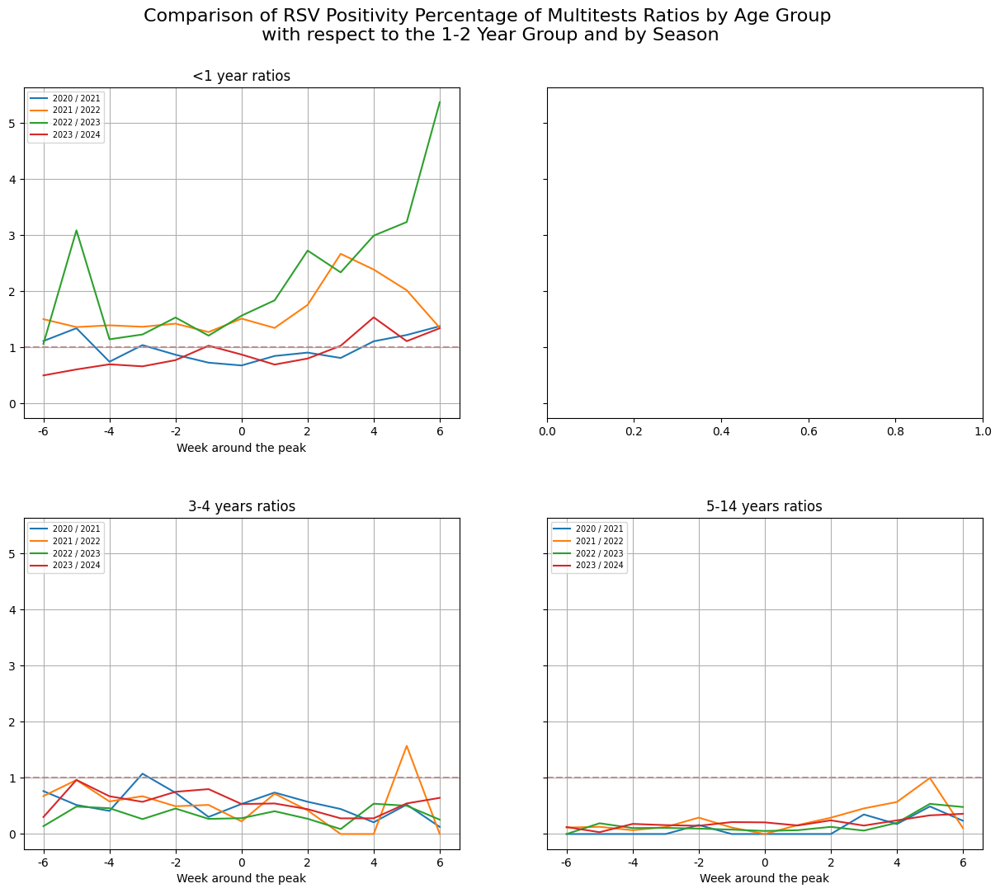

In [ ]:
# Matriu plots (1 per cohort)
fig, axs = plt.subplots(2, 2, figsize=(15, 12), gridspec_kw={'height_ratios': [3.5] * 2, 'width_ratios': [3.5] * 2},sharey=True)
fig.suptitle('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group\n with respect to the 1-2 Year Group and by Season', fontsize=16, y=0.96)
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())  # Usamos 2020 como ejemplo, pero podríamos usar cualquier año

# Automatització càlcul i representació per cohort i temp
for i, cohorte in enumerate(cohortes):
  if (cohorte)!=('Positivitat_VRS_12'):
    fila = i // 2
    columna = i % 2
    for temporada, dades_temp in temporada_cohort_sense12.items():
      cohort_baseline = temporada_cohort[temporada]['Positivitat_VRS_12']
      # Ajustar el índice del DataFrame de la temporada actual
      dades_temp[cohorte].index = range(1, len(dades_temp[cohorte]) + 1)
      cohort_baseline.index = range(1, len(cohort_baseline) + 1)

      ratio_temp_12a = dades_temp[cohorte].div(cohort_baseline.squeeze(), axis=0)
      # Agregar una línea para representar los datos en el subplot
      axs[fila, columna].plot(ratio_temp_12a, label=f'{temporada} / {temporada+1}')

    axs[fila, columna].set_xlabel('Week around the peak')
    axs[fila, columna].grid(True)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].set_xticklabels(etiquetas)
    axs[fila, columna].legend(loc='upper left', fontsize='x-small')
    axs[fila, columna].set_title(f'{cohort_legend_labels[cohorte]} ratios')
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

plt.subplots_adjust(hspace=0.3)

plt.show()

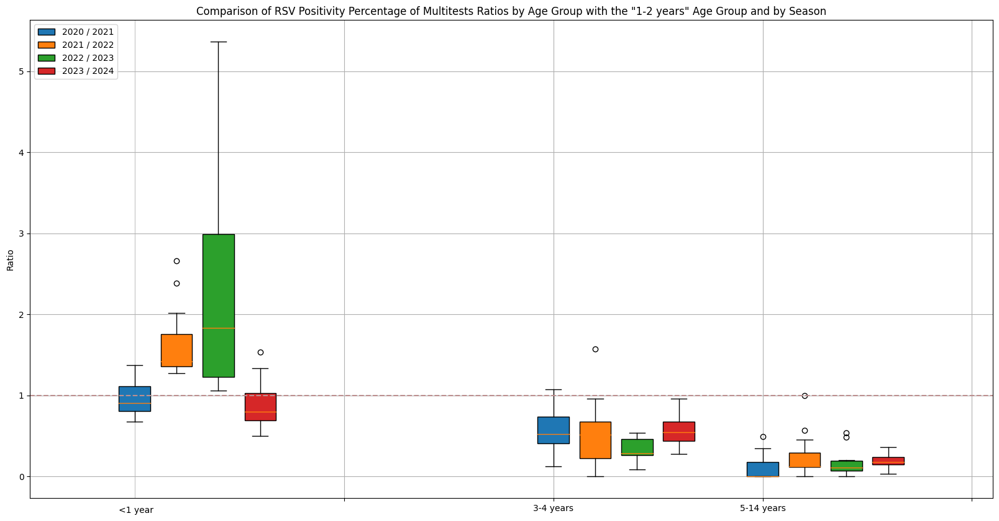

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#1f77b4','#ff7f0e','#2ca02c','#d62728']
legend_labels=[]
xlabels=['','3-4 years','5-14 years','']

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())

for i, cohorte in enumerate(cohortes):
    if (cohorte)!=('Positivitat_VRS_12'):
      for j,(temporada,dades_temp) in enumerate(temporada_cohort_sense12.items()):
        cohort_baseline=temporada_cohort[temporada]['Positivitat_VRS_12']
        dades_temp[cohorte].index=range(1,len(dades_temp[cohorte])+1)
        cohort_baseline.index=range(1,len(cohort_baseline)+1)
        ratio_temp_12a=dades_temp[cohorte].div(cohort_baseline.squeeze(),axis=0)

        box = ax.boxplot(ratio_temp_12a, positions=[i + (j * 0.2)], vert=True, patch_artist=True,boxprops=dict(facecolor=colors[j]))
        labels.append(f'{temporada}-{cohort}')
        legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels(xlabels)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '<1 year'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -0.45))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "1-2 years" Age Group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['2020 / 2021', '2021 / 2022', '2022 / 2023', '2023 / 2024']

ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.show()

### % Prova >3 anys

In [ ]:
vrs_plus_pics.head()

,Data,Incidencia_VRS_0,Incidencia_tests_0,Casos_VRS_0,Tests_fets_0,Positivitat_VRS_0,Incidencia_VRS_12,Incidencia_tests_12,Casos_VRS_12,Tests_fets_12,...,Casos_VRS_514,Tests_fets_514,Positivitat_VRS_514,Incidencia_VRS,Incidencia_tests,Casos_VRS,Tests_fets,Positivitat_VRS,Temporada,Setmana
0,2021-05-16,10.855623,75.418013,5.428571,37.714286,14.393939,6.055350,46.729025,7.571429,58.428571,...,0.0,6.142857,0.00,2.072490,16.803424,14.571429,118.142857,12.333736,2020,1
1,2021-05-23,19.425852,75.989361,9.714286,38.000000,25.563910,7.197869,37.703126,9.000000,47.142857,...,0.0,5.428571,0.00,2.824276,14.527749,19.857143,102.142857,19.440559,2020,2
2,2021-05-30,14.569389,71.704247,7.285714,35.857143,20.318725,12.453457,45.472254,15.571429,56.857143,...,0.0,5.000000,0.00,3.413513,15.340490,24.000000,107.857143,22.251656,2020,3
3,2021-06-06,26.853383,95.986562,13.428571,48.000000,27.976190,21.707860,80.547586,27.142857,100.714286,...,0.0,13.000000,0.00,6.623841,25.946762,46.571429,182.428571,25.528583,2020,4
4,2021-06-13,46.279235,136.837986,23.142857,68.428571,33.820459,41.701942,106.825523,52.142857,133.571429,...,1.0,16.000000,6.25,12.556851,36.959405,88.285714,259.857143,33.974711,2020,5


In [ ]:
# He de calcular la positivitat per el grup > 3 anys
# Positivitat = casos VRS / tests fets
vrs_plus_pics['Casos_VRS_mes3']=vrs_plus_pics['Casos_VRS_34']+vrs_plus_pics['Casos_VRS_514']
vrs_plus_pics['Tests_fets_mes3']=vrs_plus_pics['Tests_fets_34']+vrs_plus_pics['Tests_fets_514']
vrs_plus_pics['Positivitat_VRS_mes3']=vrs_plus_pics['Casos_VRS_mes3']/vrs_plus_pics['Tests_fets_mes3']*100

vrs_plus_pics.head()

,Data,Incidencia_VRS_0,Incidencia_tests_0,Casos_VRS_0,Tests_fets_0,Positivitat_VRS_0,Incidencia_VRS_12,Incidencia_tests_12,Casos_VRS_12,Tests_fets_12,...,Incidencia_VRS,Incidencia_tests,Casos_VRS,Tests_fets,Positivitat_VRS,Temporada,Setmana,Casos_VRS_mes3,Tests_fets_mes3,Positivitat_VRS_mes3
0,2021-05-16,10.855623,75.418013,5.428571,37.714286,14.393939,6.055350,46.729025,7.571429,58.428571,...,2.072490,16.803424,14.571429,118.142857,12.333736,2020,1,1.571429,22.000000,7.142857
1,2021-05-23,19.425852,75.989361,9.714286,38.000000,25.563910,7.197869,37.703126,9.000000,47.142857,...,2.824276,14.527749,19.857143,102.142857,19.440559,2020,2,1.142857,17.000000,6.722689
2,2021-05-30,14.569389,71.704247,7.285714,35.857143,20.318725,12.453457,45.472254,15.571429,56.857143,...,3.413513,15.340490,24.000000,107.857143,22.251656,2020,3,1.142857,15.142857,7.547170
3,2021-06-06,26.853383,95.986562,13.428571,48.000000,27.976190,21.707860,80.547586,27.142857,100.714286,...,6.623841,25.946762,46.571429,182.428571,25.528583,2020,4,6.000000,33.714286,17.796610
4,2021-06-13,46.279235,136.837986,23.142857,68.428571,33.820459,41.701942,106.825523,52.142857,133.571429,...,12.556851,36.959405,88.285714,259.857143,33.974711,2020,5,13.000000,57.857143,22.469136


In [ ]:
# Preparació dataframe
vrs_plus_pics3=vrs_plus_pics.copy()
vrs_plus_pics3.drop('Incidencia_VRS_0',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_tests_0',axis=1,inplace=True)
vrs_plus_pics3.drop('Casos_VRS_0',axis=1,inplace=True)
vrs_plus_pics3.drop('Tests_fets_0',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_VRS_12',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_tests_12',axis=1,inplace=True)
vrs_plus_pics3.drop('Casos_VRS_12',axis=1,inplace=True)
vrs_plus_pics3.drop('Tests_fets_12',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_VRS_34',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_tests_34',axis=1,inplace=True)
vrs_plus_pics3.drop('Casos_VRS_34',axis=1,inplace=True)
vrs_plus_pics3.drop('Tests_fets_34',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_VRS_514',axis=1,inplace=True)
vrs_plus_pics3.drop('Incidencia_tests_514',axis=1,inplace=True)
vrs_plus_pics3.drop('Casos_VRS_514',axis=1,inplace=True)
vrs_plus_pics3.drop('Tests_fets_514',axis=1,inplace=True)

In [ ]:
# Creació diccionari de referència (>3 anys)
# Creació diccionari que contingui les dades per temporada i cohort
temporades=vrs_plus_pics3['Temporada'].unique()
# Diccionari dataframes
temporada_cohort_ampli={}
# Iterar cada temp
for temporada in temporades:
  dades_temp_actual=vrs_plus_pics3[vrs_plus_pics3['Temporada']==temporada]
  dades_cohort={}
  # Iterar cada cohort
  for columna in vrs_plus_pics3.columns:
    if columna.startswith('Positivitat_'):
      cohort=columna
      dades_cohort_actual=dades_temp_actual[[cohort]]
      dades_cohort[cohort]=dades_cohort_actual
  temporada_cohort_ampli[temporada]=dades_cohort

# Netejar diccionari per només tenir franja de referència
temporada_cohort_mes3={}
cohorts_eliminats=['Positivitat_VRS_0','Positivitat_VRS_12','Positivitat_VRS_34','Positivitat_VRS_514','Positivitat_VRS',]
for temporada,dades_temp in temporada_cohort_ampli.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_mes3[temporada]=noves_dades_temp

In [ ]:
# Creació llista sense les dades de la franja de referència i altres sorolls
temporada_cohort_sense_mes3={}
cohorts_eliminats=['Positivitat_VRS','Positivitat_VRS_mes3']
for temporada,dades_temp in temporada_cohort_ampli.items():
  noves_dades_temp={}
  for cohort,dades_cohort in dades_temp.items():
    if cohort not in cohorts_eliminats:
      noves_dades_temp[cohort]=dades_cohort
  temporada_cohort_sense_mes3[temporada]=noves_dades_temp

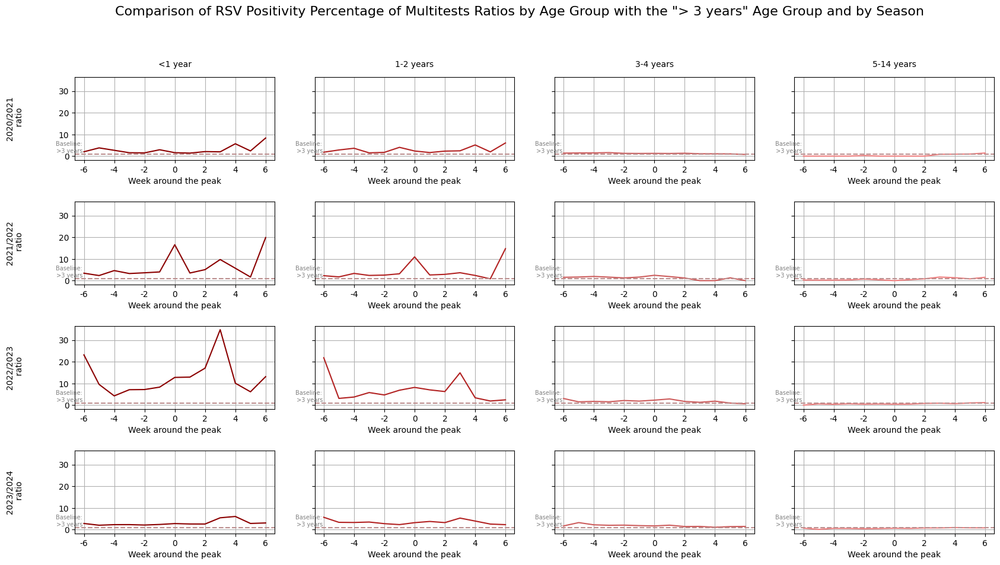

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort_sense_mes3)
num_columnes=len(next(iter(temporada_cohort_sense_mes3.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(20,10),sharey=True)
fig.suptitle('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "> 3 years" Age Group and by Season', fontsize=16,y=1)
colors=['darkred','firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense_mes3.items()):
  cohort_baseline=temporada_cohort_mes3[temporada]['Positivitat_VRS_mes3']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_12a=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_temp_12a, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
    #axs[i,j].set_yticks([0,1,2,3,4])

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline:\n >3 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  etiq_column=etiquetes_column[j]
  axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort_ampli.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.3, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

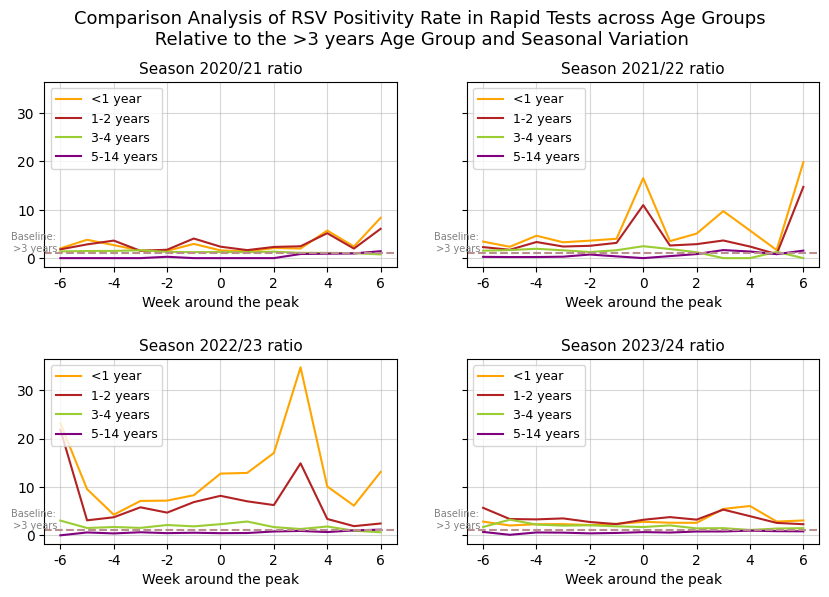

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(10,6),gridspec_kw={'height_ratios':[2]*2,'width_ratios':[2]*2},sharey=True)
fig.suptitle('Comparison Analysis of RSV Positivity Rate in Rapid Tests across Age Groups\n Relative to the >3 years Age Group and Seasonal Variation', fontsize=13,y=1)
cohort_colors={'Positivitat_VRS_0':'orange','Positivitat_VRS_12':'firebrick','Positivitat_VRS_34':'yellowgreen','Positivitat_VRS_514':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12':'1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort_sense_mes3.items()):
  fila=i//2
  columna=i%2
  cohort_baseline=temporada_cohort_mes3[temporada]['Positivitat_VRS_mes3']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for cohort,dades_cohort in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_3=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_temp_3, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
  axs[fila,columna].set_xlabel('Week around the peak', fontsize=10)
  axs[fila,columna].grid(True, alpha=0.5)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  #axs[i,j].set_yticks([0,1,2,3,4])
  axs[fila,columna].legend(loc='upper left',fontsize=9)
  axs[fila,columna].set_title(f'Season {temporada}/{temporada-1999} ratio', fontsize=11)
  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline:\n >3 years',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)


plt.subplots_adjust(hspace=0.5)

plt.show()

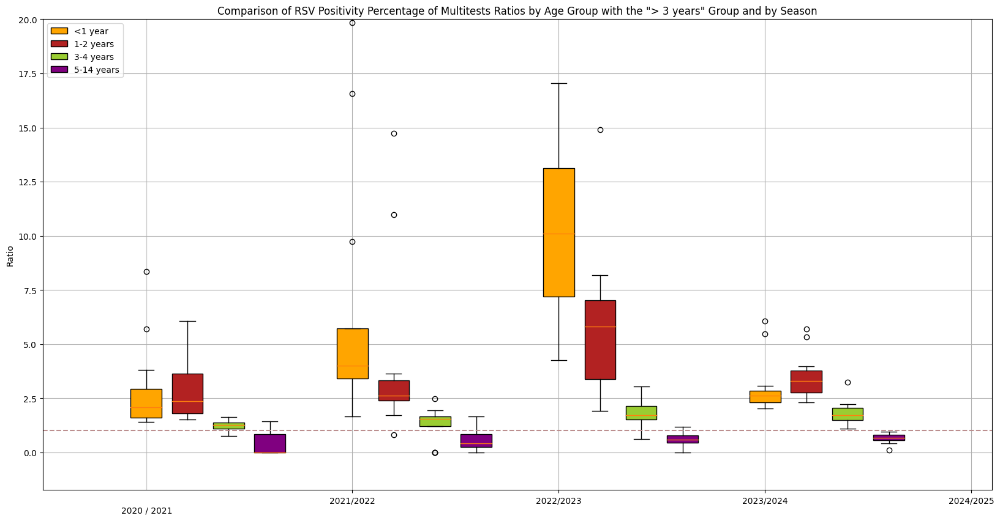

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort_sense_mes3.items()):
  cohort_baseline=temporada_cohort_mes3[temporada]['Positivitat_VRS_mes3']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
    dades_cohort.index=range(1,len(dades_cohort)+1)
    ratio_temp_3=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    #axs[i,j].plot(ratio_temp_coh, label=f'Temporada: {temporada}, Cohort: {cohort}',color=colors[j % len(colors)])

    box = ax.boxplot(ratio_temp_3, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
    labels.append(f'{temporada}-{cohort}')
    legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1}/{temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020 / 2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -2.8))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "> 3 years" Group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year', '1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.ylim(bottom=None,top=20)
plt.show()

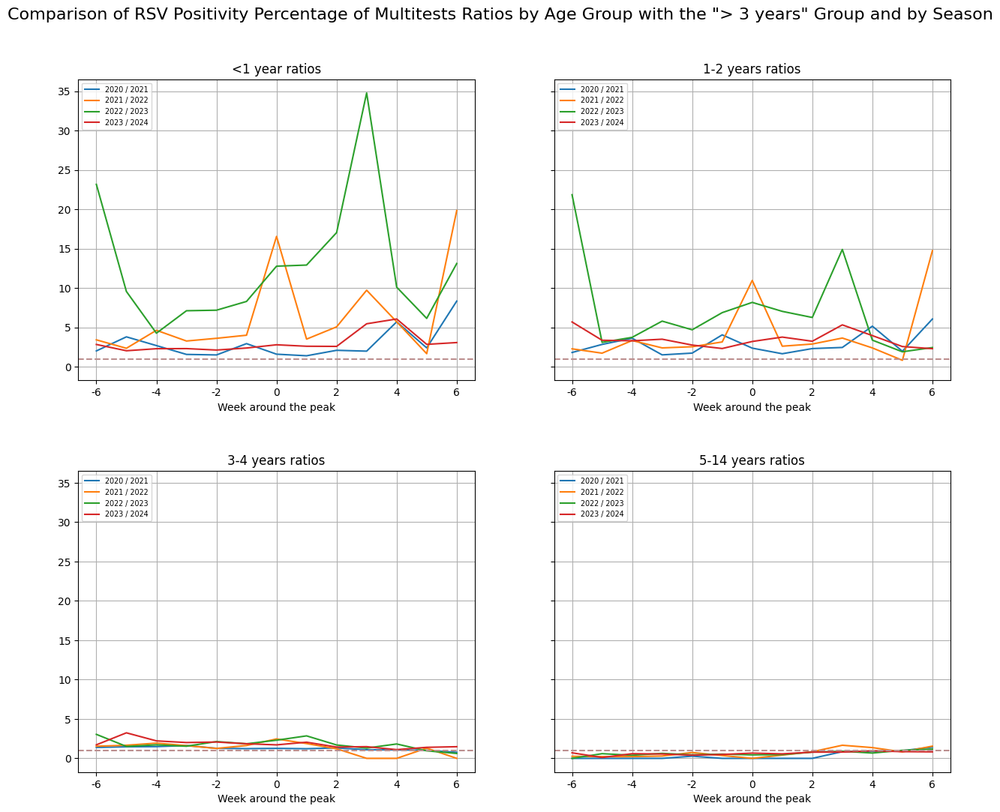

In [ ]:
# Matriu plots (1 per cohort)
fig, axs = plt.subplots(2, 2, figsize=(15, 12), gridspec_kw={'height_ratios': [3.5] * 2, 'width_ratios': [3.5] * 2},sharey=True)
fig.suptitle('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "> 3 years" Group and by Season', fontsize=16, y=0.96)
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())  # Usamos 2020 como ejemplo, pero podríamos usar cualquier año

# Automatització càlcul i representació per cohort i temp
for i, cohorte in enumerate(cohortes):
    fila = i // 2
    columna = i % 2
    for temporada, dades_temp in temporada_cohort.items():
      cohort_baseline = temporada_cohort_mes3[temporada]['Positivitat_VRS_mes3']
      # Ajustar el índice del DataFrame de la temporada actual
      dades_temp[cohorte].index = range(1, len(dades_temp[cohorte]) + 1)
      cohort_baseline.index = range(1, len(cohort_baseline) + 1)

      ratio_temp_3 = dades_temp[cohorte].div(cohort_baseline.squeeze(), axis=0)
      # Agregar una línea para representar los datos en el subplot
      axs[fila, columna].plot(ratio_temp_3, label=f'{temporada} / {temporada+1}')

    axs[fila, columna].set_xlabel('Week around the peak')
    axs[fila, columna].grid(True)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].set_xticklabels(etiquetas)
    axs[fila, columna].legend(loc='upper left', fontsize='x-small')
    axs[fila, columna].set_title(f'{cohort_legend_labels[cohorte]} ratios')
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

plt.subplots_adjust(hspace=0.3)

plt.show()

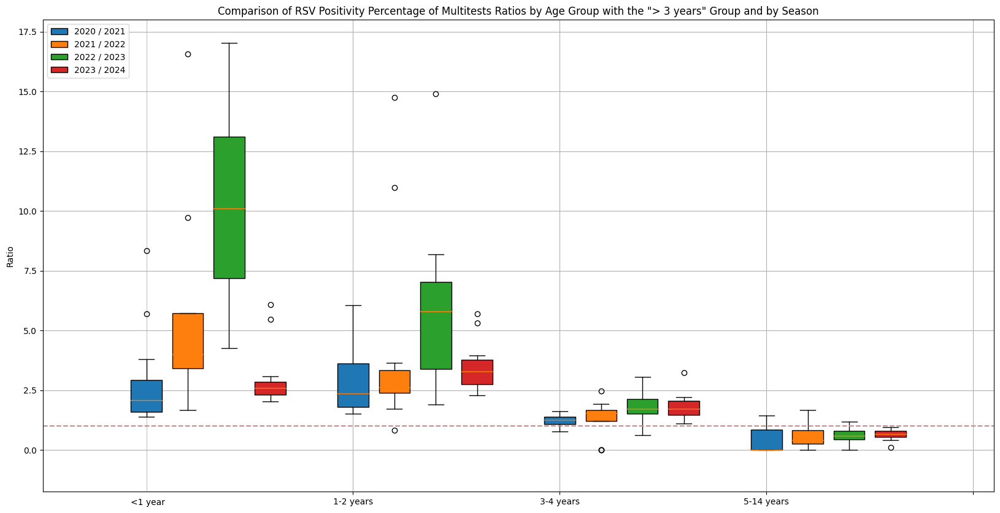

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#1f77b4','#ff7f0e','#2ca02c','#d62728']
legend_labels=[]
xlabels=['1-2 years','3-4 years','5-14 years','']

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())

for i, cohorte in enumerate(cohortes):
    for j,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
      cohort_baseline=temporada_cohort_mes3[temporada]['Positivitat_VRS_mes3']
      dades_temp[cohorte].index=range(1,len(dades_temp[cohorte])+1)
      cohort_baseline.index=range(1,len(cohort_baseline)+1)
      ratio_temp_3=dades_temp[cohorte].div(cohort_baseline.squeeze(),axis=0)

      box = ax.boxplot(ratio_temp_3, positions=[i + (j * 0.2)], vert=True, patch_artist=True,boxprops=dict(facecolor=colors[j]))
      labels.append(f'{temporada}-{cohort}')
      legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels(xlabels)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '<1 year'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -2.3))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the "> 3 years" Group and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['2020 / 2021', '2021 / 2022', '2022 / 2023', '2023 / 2024']

ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.ylim(bottom=None,top=18)
plt.show()

### % Prova: sistema sentinella d'adults -> mostres positives (%) temporada 2023/2024

In [ ]:
vrs_sivic=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/BV_dades_prob1.xlsx",sheet_name=4)

In [ ]:
vrs_sivic['data']=pd.to_datetime(vrs_sivic['data'])
vrs_sivic.drop('mitjana',axis=1,inplace=True)
vrs_sivic.head()

,Unnamed: 0,data,mostres analitzades,mostres positives (%),taxa estimada
0,0,2023-10-02,293,0.34,2.0
1,1,2023-10-09,275,0.36,1.0
2,2,2023-10-16,234,NaN,NaN
3,3,2023-10-23,290,1.38,7.0
4,4,2023-10-30,255,0.78,4.0


In [ ]:
# Seleccionar 6 setmanes prèvies i 6 setmanes posteriors al màxim
pic_sivic = []
data_max=vrs_sivic['taxa estimada'].idxmax()
start_pic=max(0,data_max-6)
end_pic=min(len(vrs),data_max+7)
rang_pic=vrs_sivic.iloc[start_pic:end_pic]

pic_sivic.append(rang_pic)

# Guardar en un dtframe nou
pic_sivic=pd.concat(pic_sivic)
pic_sivic.reset_index(drop=True,inplace=True)

# Enumerar les setmanes de la 1 a la 13
pic_sivic['setmana']=pic_sivic['Unnamed: 0']-4
pic_sivic.drop('Unnamed: 0',axis=1,inplace=True)

#print(pic_sivic)

In [ ]:
vrs_100_sivic=pic_sivic[['data','mostres positives (%)','setmana']]
vrs_100_sivic.head()
# A la fila d'index 16 no hi ha dada. Decideixo utilitzar la mitjana entre la setmana anterior i següent: 9.75

,data,mostres positives (%),setmana
0,2023-11-06,2.28,1
1,2023-11-13,5.49,2
2,2023-11-20,9.65,3
3,2023-11-27,12.32,4
4,2023-12-04,15.52,5


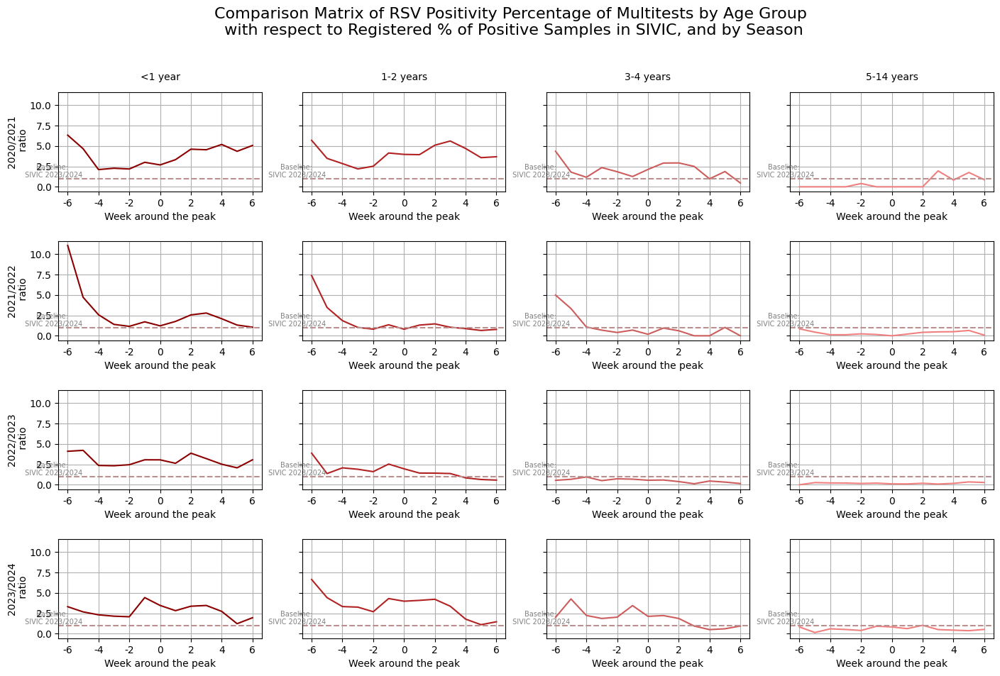

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
num_files=len(temporada_cohort)
num_columnes=len(next(iter(temporada_cohort.values())))
fig,axs=plt.subplots(num_files,num_columnes,figsize=(17,10),sharey=True)
fig.suptitle('Comparison Matrix of RSV Positivity Percentage of Multitests by Age Group\n with respect to Registered % of Positive Samples in SIVIC, and by Season', fontsize=16,y=1)
colors=['darkred','firebrick','indianred','lightcoral']

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  for j,(cohort,dades_cohort) in enumerate(dades_temp.items()):
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    cohort_baseline=vrs_100_sivic['mostres positives (%)']
    cohort_baseline.index=range(1,len(cohort_baseline)+1)

    ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[i,j].plot(ratio_sivic,color=colors[j % len(colors)])
    axs[i,j].set_xlabel('Week around the peak')
    axs[i,j].grid(True)
    axs[i,j].set_xticks([1,3,5,7,9,11,13])
    axs[i,j].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
    axs[i,j].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))

    axs[i,j].axhline(y=1,color='rosybrown',linestyle='--')
    axs[i,j].text(0,1,'Baseline:\n SIVIC 2023/2024',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

# Agregar encabezados para cada columna (títulos de cohortes)
etiquetes_column=['<1 year','1-2 years','3-4 years','5-14 years']
for j, cohort in enumerate(dades_temp.keys()):
  if (cohort) != ('incid_total'):
    etiq_column=etiquetes_column[j]
    axs[0, j].annotate(etiq_column, (0.5, 1.15), xycoords='axes fraction', ha='center', va='center')

# Agregar encabezados para cada fila (títulos de temporadas)
for i, temporada in enumerate(temporada_cohort.keys()):
    axs[i, 0].annotate(f'{temporada}/{temporada+1}\n ratio', (-0.2, 0.5), xycoords='axes fraction', ha='center', va='center', rotation=90)

plt.subplots_adjust(hspace=0.5)

plt.show()

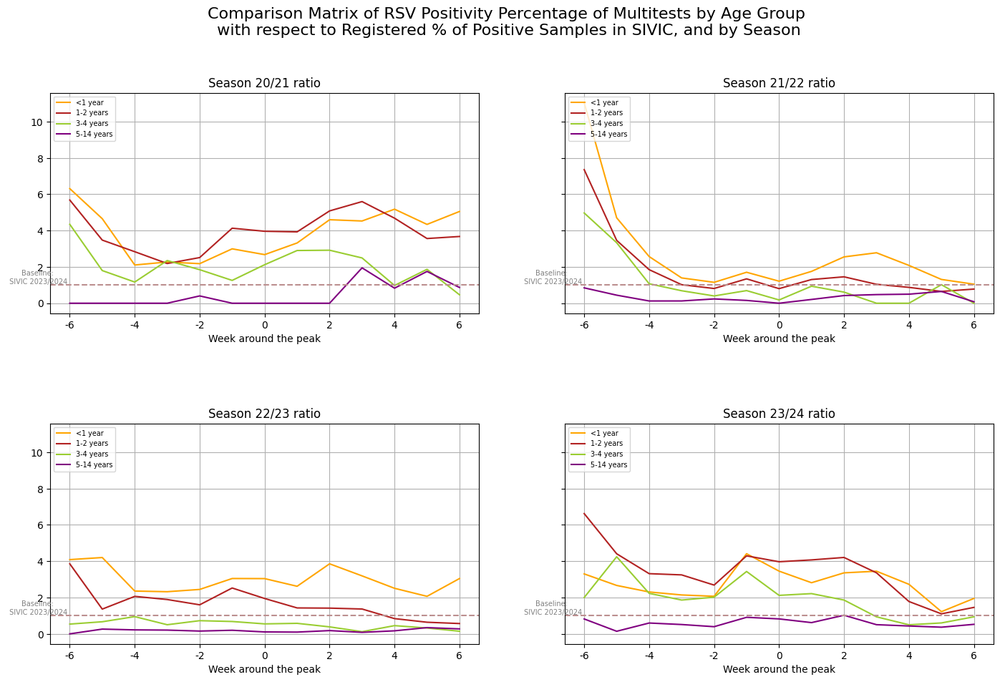

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Matriu plots
fig,axs=plt.subplots(2,2,figsize=(17,10),gridspec_kw={'height_ratios':[3.5]*2,'width_ratios':[3.5]*2},sharey=True)
fig.suptitle('Comparison Matrix of RSV Positivity Percentage of Multitests by Age Group\n with respect to Registered % of Positive Samples in SIVIC, and by Season', fontsize=16,y=1)
cohort_colors={'Positivitat_VRS_0':'orange','Positivitat_VRS_12':'firebrick','Positivitat_VRS_34':'yellowgreen','Positivitat_VRS_514':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year','Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for i,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
  fila=i//2
  columna=i%2
  for (cohort,dades_cohort) in dades_temp.items():
    # Ajust index
    dades_cohort.index=range(1,len(dades_cohort)+1)
    cohort_baseline=vrs_100_sivic['mostres positives (%)']
    cohort_baseline.index=range(1,len(cohort_baseline)+1)

    ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    axs[fila,columna].plot(ratio_sivic, label=cohort_legend_labels[cohort],color=cohort_colors[cohort])

  axs[fila,columna].set_xlabel('Week around the peak')
  axs[fila,columna].grid(True)
  axs[fila,columna].set_xticks([1,3,5,7,9,11,13])
  axs[fila,columna].xaxis.set_major_locator(FixedLocator([1,3,5,7,9,11,13]))
  axs[fila,columna].xaxis.set_major_formatter(FixedFormatter(['-6','-4','-2','0','2','4','6']))
  axs[fila,columna].legend(loc='upper left',fontsize='x-small')
  axs[fila,columna].set_title(f'Season {temporada-2000}/{temporada-1999} ratio')

  axs[fila,columna].axhline(y=1,color='rosybrown',linestyle='--')
  axs[fila,columna].text(0,1,'Baseline:\n SIVIC 2023/2024',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

plt.subplots_adjust(hspace=0.5)

plt.show()

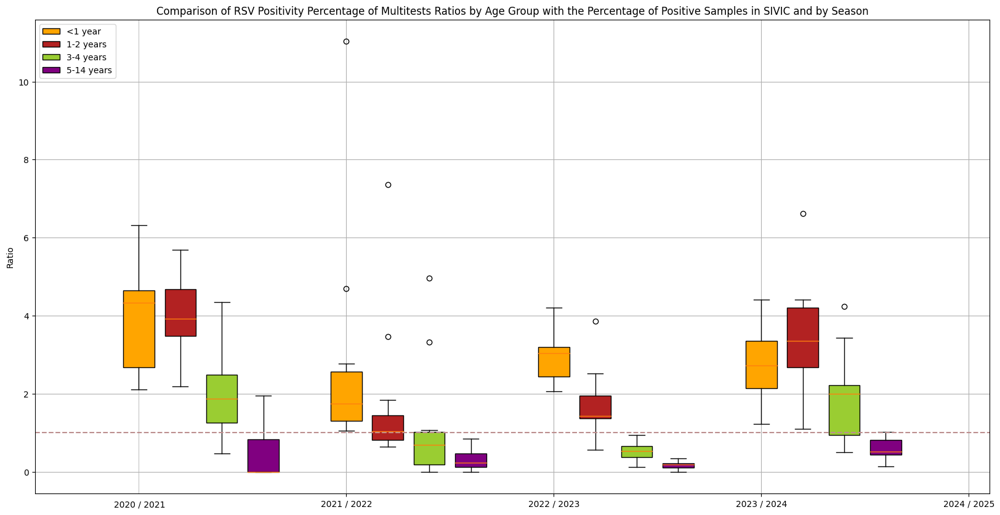

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['orange','firebrick','yellowgreen','purple']
legend_labels=[]

for i, (temporada, dades_temp) in enumerate(temporada_cohort.items()):
  for j, (cohort, dades_cohort) in enumerate(dades_temp.items()):
    dades_cohort.index=range(1,len(dades_cohort)+1)
    cohort_baseline=vrs_100_sivic['mostres positives (%)']
    cohort_baseline.index=range(1,len(cohort_baseline)+1)
    ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

    box = ax.boxplot(ratio_sivic, positions=[i + (j * 0.2)], vert=True, patch_artist=True, boxprops=dict(facecolor=colors[j]))
    labels.append(f'{temporada}-{cohort}')
    legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels([f'{temporada+1} / {temporada+2}' for temporada in temporada_cohort.keys()])
ax.set_ylabel('Ratio')
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '2020 / 2021'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -0.9))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the Percentage of Positive Samples in SIVIC and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['<1 year','1-2 years', '3-4 years', '5-14 years']
ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.show()

##### Extres (no tenen massa sentit pq comparem amb la temporada actual, no es rellevant veure les altres temporades)

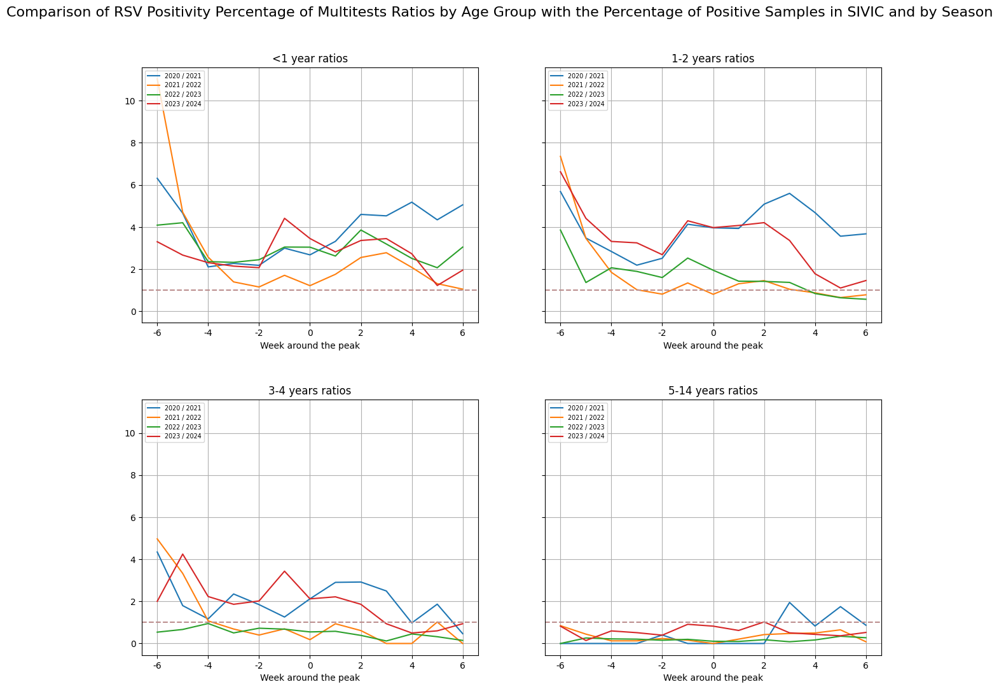

In [ ]:
# Matriu plots (1 per cohort)
fig, axs = plt.subplots(2, 2, figsize=(15, 12), gridspec_kw={'height_ratios': [3.5] * 2, 'width_ratios': [3.5] * 2},sharey=True)
fig.suptitle('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the Percentage of Positive Samples in SIVIC and by Season', fontsize=16, y=0.96)
etiquetas = ['-6', '-4', '-2', '0', '2', '4', '6']

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year', 'Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())  # Usamos 2020 como ejemplo, pero podríamos usar cualquier año

# Automatització càlcul i representació per cohort i temp
for i, cohorte in enumerate(cohortes):
    fila = i // 2
    columna = i % 2
    for temporada, dades_temp in temporada_cohort.items():
      cohort_baseline = vrs_100_sivic['mostres positives (%)']
      # Ajustar el índice del DataFrame de la temporada actual
      dades_temp[cohorte].index = range(1, len(dades_temp[cohorte]) + 1)
      cohort_baseline.index = range(1, len(cohort_baseline) + 1)

      ratio_temp_coh = dades_temp[cohorte].div(cohort_baseline.squeeze(), axis=0)
      # Agregar una línea para representar los datos en el subplot
      axs[fila, columna].plot(ratio_temp_coh, label=f'{temporada} / {temporada+1}')

    axs[fila, columna].set_xlabel('Week around the peak')
    axs[fila, columna].grid(True)
    axs[fila, columna].set_xticks([1, 3, 5, 7, 9, 11, 13])
    axs[fila, columna].set_xticklabels(etiquetas)
    axs[fila, columna].legend(loc='upper left', fontsize='x-small')
    axs[fila, columna].set_title(f'{cohort_legend_labels[cohorte]} ratios')
    axs[fila, columna].axhline(y=1, color='rosybrown', linestyle='--')

plt.subplots_adjust(hspace=0.3)

plt.show()

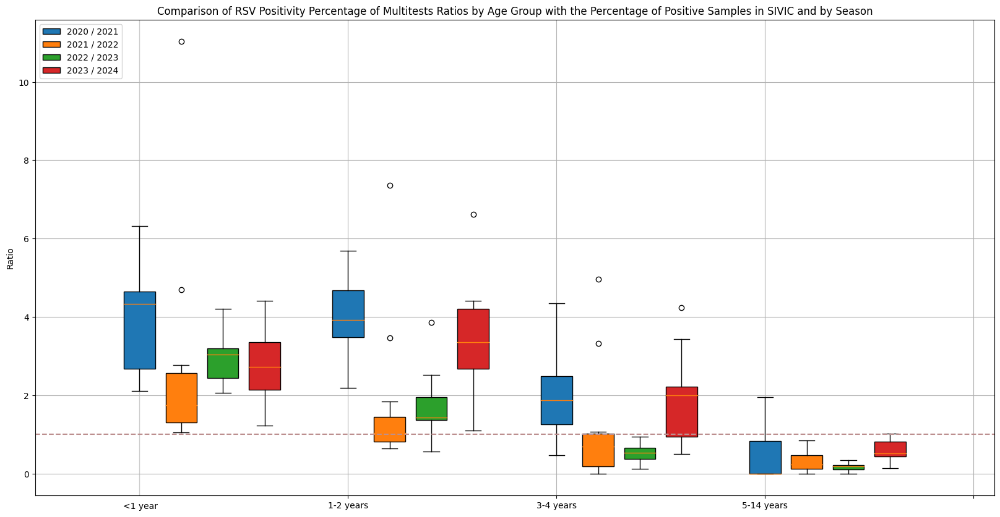

In [ ]:
import matplotlib.pyplot as plt

# Crear el diagrama de cajas para todos los grupos de edad y temporadas
fig, ax = plt.subplots(figsize=(20, 10))

# Preparar datos y etiquetas
labels = []
positions = []
all_data = []
colors=['#1f77b4','#ff7f0e','#2ca02c','#d62728']
legend_labels=[]
xlabels=['1-2 years','3-4 years','5-14 years','']

# Obtener las claves inferiores (cohortes)
cohortes = list(temporada_cohort[2020].keys())

for i, cohorte in enumerate(cohortes):
    for j,(temporada,dades_temp) in enumerate(temporada_cohort.items()):
      cohort_baseline=vrs_100_sivic['mostres positives (%)']
      dades_temp[cohorte].index=range(1,len(dades_temp[cohorte])+1)
      cohort_baseline.index=range(1,len(cohort_baseline)+1)
      ratio_temp_coh=dades_temp[cohorte].div(cohort_baseline.squeeze(),axis=0)

      box = ax.boxplot(ratio_temp_coh, positions=[i + (j * 0.2)], vert=True, patch_artist=True,boxprops=dict(facecolor=colors[j]))
      labels.append(f'{temporada}-{cohort}')
      legend_labels.append(box['boxes'][0])  # Añadir el elemento del boxplot para la leyenda

# Configurar ejes y etiquetas
ax.set_xticks(range(1, len(temporada_cohort) + 1))
ax.set_xticklabels(xlabels)
# Agrega una marca con etiqueta en el eje x
posicion = 0  # Ubicación en el eje x donde quieres colocar la marca
etiqueta = '<1 year'
# Calcula la posición del texto para que esté centrado
longitud_texto = len(etiqueta)
ancho_texto = longitud_texto * 0.011  # Ajustar valor
plt.annotate(etiqueta, xy=(posicion, 0.5), xytext=(posicion - ancho_texto, -0.9))
plt.axvline(x=posicion, color='#CCCCCC',linewidth=1,zorder=0)

ax.set_ylabel('Ratio')
#ax.set_xlabel('Season and Age Group')
ax.set_title('Comparison of RSV Positivity Percentage of Multitests Ratios by Age Group with the Percentage of Positive Samples in SIVIC and by Season')
ax.axhline(y=1,color='rosybrown',linestyle='--')

legend_labels_txt=['2020 / 2021', '2021 / 2022', '2022 / 2023', '2023 / 2024']

ax.legend(legend_labels,legend_labels_txt, loc='upper left')
plt.grid(True)
plt.show()

### % Prova: sistema sentinella d'adults -> mostres positives (%) 2022/2023

In [ ]:
vrs_sivic=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/Vigilancia_micro_sentinella_AP_SIVIC.xlsx",sheet_name=5)

In [ ]:
vrs_sivic['Data inicial']=pd.to_datetime(vrs_sivic['Data inicial'])
vrs_sivic.drop('Tests fets',axis=1,inplace=True)
vrs_sivic.drop('Tests positius',axis=1,inplace=True)
vrs_sivic.drop('RSV positiu',axis=1,inplace=True)
vrs_sivic.drop('% positivitat de VRS respecte als multitests positius',axis=1,inplace=True)
vrs_sivic.rename(columns={'Data inicial': 'data'}, inplace=True)
vrs_sivic

,data,% positivitat
0,2022-05-09,1.282051
1,2022-05-16,0.595238
2,2022-05-23,2.005731
3,2022-05-30,1.337793
4,2022-06-06,1.176471
...,...,...
98,2024-03-25,1.324503
99,2024-04-01,0.641026
100,2024-04-08,1.102941
101,2024-04-15,0.727273


In [ ]:
pic_temporades['data']=pd.to_datetime(pic_temporades['data'])
pic_2223=pic_temporades[pic_temporades['temporada']==2022]
pic_2324=pic_temporades[pic_temporades['temporada']==2023]


In [ ]:
# Fer coincidir dates
vrs_sivic['data']=vrs_sivic['data'] - pd.DateOffset(days=1)

In [ ]:
# Pics definits per la incidència dels multitests
vrs_pic_2223 = vrs_sivic[vrs_sivic['data'].isin(pic_2223['data'])]
vrs_pic_2324 = vrs_sivic[vrs_sivic['data'].isin(pic_2324['data'])]

In [ ]:
vrs_pic_2223

,data,% positivitat
23,2022-10-16,3.475936
24,2022-10-23,6.117021
25,2022-10-30,14.230769
26,2022-11-06,9.953704
27,2022-11-13,11.930586
28,2022-11-20,14.439655
29,2022-11-27,15.384615
30,2022-12-04,12.383901
31,2022-12-11,9.815951
32,2022-12-18,10.373444


In [ ]:
# Atribuir temporada a cada fila
def temporada (Data):
  if Data.month >= 9:
    return Data.year
  else:
    return Data.year-1

vrs_pic_2223.loc[:,'Temporada']=vrs_pic_2223['data'].apply(temporada)
# Enumerar les setmanes de la 1 a la 13 per cada temporada
vrs_pic_2223.loc[:,'Setmana']=vrs_pic_2223.groupby('Temporada').cumcount()+1

vrs_pic_2324.loc[:,'Temporada']=vrs_pic_2324['data'].apply(temporada)
# Enumerar les setmanes de la 1 a la 13 per cada temporada
vrs_pic_2324.loc[:,'Setmana']=vrs_pic_2324.groupby('Temporada').cumcount()+1

<ipython-input-180-5e5b69730e3a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vrs_pic_2223.loc[:,'Temporada']=vrs_pic_2223['data'].apply(temporada)
<ipython-input-180-5e5b69730e3a>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vrs_pic_2223.loc[:,'Setmana']=vrs_pic_2223.groupby('Temporada').cumcount()+1
<ipython-input-180-5e5b69730e3a>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

In [ ]:
vrs_pic_2223.head()

,data,% positivitat,Temporada,Setmana
23,2022-10-16,3.475936,2022,1
24,2022-10-23,6.117021,2022,2
25,2022-10-30,14.230769,2022,3
26,2022-11-06,9.953704,2022,4
27,2022-11-13,11.930586,2022,5


In [ ]:
vrs_pic_2324.head()

,data,% positivitat,Temporada,Setmana
78,2023-11-05,2.279202,2023,1
79,2023-11-12,5.494505,2023,2
80,2023-11-19,9.649123,2023,3
81,2023-11-26,12.324930,2023,4
82,2023-12-03,15.517241,2023,5


### % SIVIC per temp 2022/23

In [ ]:
# Crear diccionari de la temporada 2022/23
temporada_cohort_2223={key:temporada_cohort[key] for key in [2022]}
temp_cohort_2223={}
for key,value in temporada_cohort_2223[2022].items():
  temp_cohort_2223[key]=value

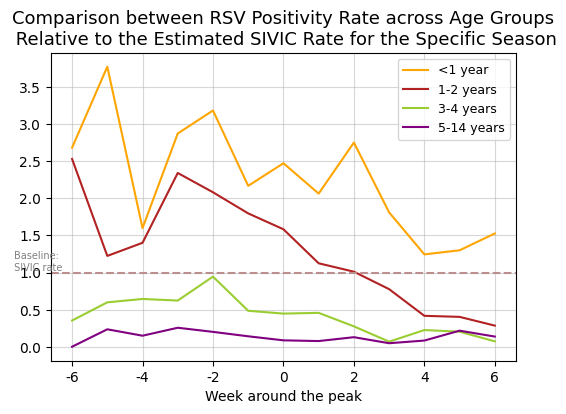

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Plot per temporada
plt.figure(figsize=(6,4))
cohort_colors={'Positivitat_VRS_0':'orange','Positivitat_VRS_12':'firebrick','Positivitat_VRS_34':'yellowgreen','Positivitat_VRS_514':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year','Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for cohort,dades_cohort in temp_cohort_2223.items():
  dades_cohort.index=range(1,len(dades_cohort)+1)
  cohort_baseline=vrs_pic_2223['% positivitat']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

  plt.plot(ratio_sivic, label=cohort_legend_labels[cohort],color=cohort_colors[cohort])

plt.xlabel('Week around the peak', fontsize=10)
plt.grid(True, alpha=0.5)
plt.xticks([1,3,5,7,9,11,13],['-6','-4','-2','0','2','4','6'])
plt.legend(loc='upper right',fontsize=9)
plt.title(f'Comparison between RSV Positivity Rate across Age Groups\n Relative to the Estimated SIVIC Rate for the Specific Season', fontsize=13)

plt.axhline(y=1,color='rosybrown',linestyle='--')
plt.text(0,1,'Baseline:\n SIVIC rate',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

plt.subplots_adjust(hspace=0.5)

plt.show()

### % SIVIC per temp 2023/24

In [ ]:
# Crear diccionari de la temporada 2023/24
temporada_cohort_2324={key:temporada_cohort[key] for key in [2023]}
temp_cohort_2324={}
for key,value in temporada_cohort_2324[2023].items():
  temp_cohort_2324[key]=value

In [ ]:
# Afegir dada a la setmana 8, que no hi ha --> faig la mitja: 9.75
vrs_pic_2324.iloc[7,1]=9.75
vrs_pic_2324

,data,% positivitat,Temporada,Setmana
78,2023-11-05,2.279202,2023,1
79,2023-11-12,5.494505,2023,2
80,2023-11-19,9.649123,2023,3
81,2023-11-26,12.324930,2023,4
82,2023-12-03,15.517241,2023,5
83,2023-12-10,10.266160,2023,6
84,2023-12-17,12.500000,2023,7
85,2023-12-24,9.750000,2023,8
86,2023-12-31,6.995885,2023,9
87,2024-01-07,5.882353,2023,10


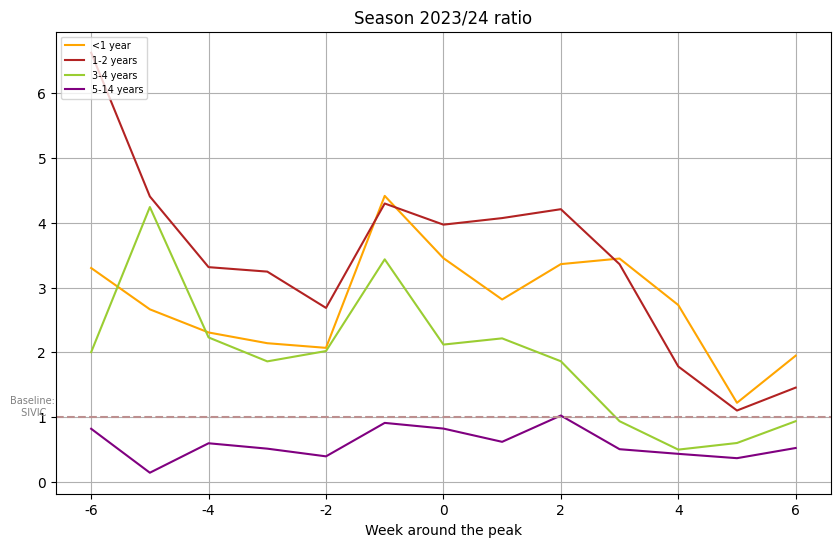

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Plot per temporada
plt.figure(figsize=(10,6))
cohort_colors={'Positivitat_VRS_0':'orange','Positivitat_VRS_12':'firebrick','Positivitat_VRS_34':'yellowgreen','Positivitat_VRS_514':'purple'}

# Mapeo de nombres de series a nombres para la leyenda
cohort_legend_labels = {'Positivitat_VRS_0': '<1 year','Positivitat_VRS_12': '1-2 years', 'Positivitat_VRS_34': '3-4 years', 'Positivitat_VRS_514': '5-14 years'}

# Automatització càlcul i representació per temp i cohort
for cohort,dades_cohort in temp_cohort_2324.items():
  dades_cohort.index=range(1,len(dades_cohort)+1)
  cohort_baseline=vrs_pic_2324['% positivitat']
  cohort_baseline.index=range(1,len(cohort_baseline)+1)

  ratio_sivic=dades_cohort.div(cohort_baseline.squeeze(),axis=0)

  plt.plot(ratio_sivic, label=cohort_legend_labels[cohort],color=cohort_colors[cohort])

plt.xlabel('Week around the peak')
plt.grid(True)
plt.xticks([1,3,5,7,9,11,13],['-6','-4','-2','0','2','4','6'])
plt.legend(loc='upper left',fontsize='x-small')
plt.title(f'Season 2023/24 ratio')

plt.axhline(y=1,color='rosybrown',linestyle='--')
plt.text(0,1,'Baseline:\n SIVIC',color='gray',ha='center',va='bottom',fontsize=7,rotation=0)

plt.subplots_adjust(hspace=0.5)

plt.show()

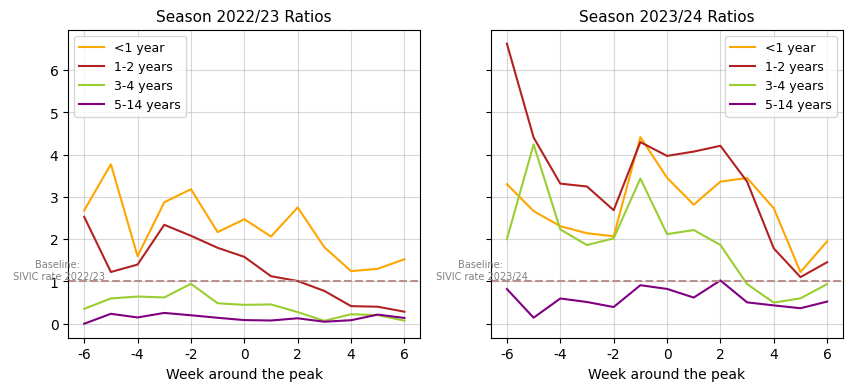

In [ ]:
from matplotlib.ticker import FixedLocator, FixedFormatter

fig, axs = plt.subplots(1, 2, figsize=(10,4), sharey=True)

# Plot para temporada 2022/23
axs[0].set_title('Season 2022/23 Ratios', fontsize=11)
for cohort, dades_cohort in temp_cohort_2223.items():
    dades_cohort.index = range(1, len(dades_cohort) + 1)
    cohort_baseline = vrs_pic_2223['% positivitat']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)
    axs[0].plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
axs[0].set_xlabel('Week around the peak', fontsize=10)
axs[0].grid(True, alpha=0.5)
axs[0].set_xticks([1, 3, 5, 7, 9, 11, 13])
axs[0].set_xticklabels(['-6', '-4', '-2', '0', '2', '4', '6'])
axs[0].legend(loc='upper left', fontsize=9)
axs[0].axhline(y=1, color='rosybrown', linestyle='--')
axs[0].text(0, 1, 'Baseline:\n SIVIC rate 2022/23', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

# Plot para temporada 2023/24
axs[1].set_title('Season 2023/24 Ratios', fontsize=11)
for cohort, dades_cohort in temp_cohort_2324.items():
    dades_cohort.index = range(1, len(dades_cohort) + 1)
    cohort_baseline = vrs_pic_2324['% positivitat']
    cohort_baseline.index = range(1, len(cohort_baseline) + 1)
    ratio_sivic = dades_cohort.div(cohort_baseline.squeeze(), axis=0)
    axs[1].plot(ratio_sivic, label=cohort_legend_labels[cohort], color=cohort_colors[cohort])
axs[1].set_xlabel('Week around the peak', fontsize=10)
axs[1].grid(True, alpha=0.5)
axs[1].set_xticks([1, 3, 5, 7, 9, 11, 13])
axs[1].set_xticklabels(['-6', '-4', '-2', '0', '2', '4', '6'])
axs[1].legend(loc='upper right', fontsize=9)
axs[1].axhline(y=1, color='rosybrown', linestyle='--')
axs[1].text(0, 1, 'Baseline:\n SIVIC rate 2023/24', color='gray', ha='center', va='bottom', fontsize=7, rotation=0)

plt.subplots_adjust(wspace=0.2)  # Ajusta el espacio horizontal entre las gráficas
plt.show()
